# MASTER THESIS - night ventilation strategies

# Importation

In [1]:
import sys
import importlib
from pathlib import Path
import pvlib
from scipy.interpolate import BSpline

# go from ...\docs\tutorials up two levels to the repo root (...\darkgreybox)
repo_root = Path.cwd().parents[1]
sys.path.insert(0, str(repo_root))
importlib.invalidate_caches()


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, KFold
from statsmodels.graphics.tsaplots import plot_pacf

from darkgreybox.models import TiTmCn2R2C_summer_V9
from darkgreybox.night_ventilation import simulate_night_vent_scenario, comfort_metrics
from darkgreybox.fit import darkgreyfit
from docs.tutorials.util.plot import plot
from docs.tutorials.util.error import rmse

C:\Users\clemr\AppData\Roaming\Python\Python311\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


2026-05-21 15:33:48,412 darkgreybox  INFO     Logging enabled...


In [2]:
rec_duration = 15/60

In [3]:
import pickle

class MockResult:
    def __init__(self, Z, var=None):
        self.Z   = Z
        self.var = var if var is not None else {}

RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"

with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

df           = saved["df"]
X_train      = saved["X_train"]
y_train      = saved["y_train"]
X_test       = saved["X_test"]
y_test       = saved["y_test"]
model        = saved["model"]

train_results = saved["train_results"]
test_results  = saved["test_results"]

print(f"Loaded! DataFrame shape: {df.shape}")

Loaded! DataFrame shape: (1, 13)


# Plot the results

## Train results

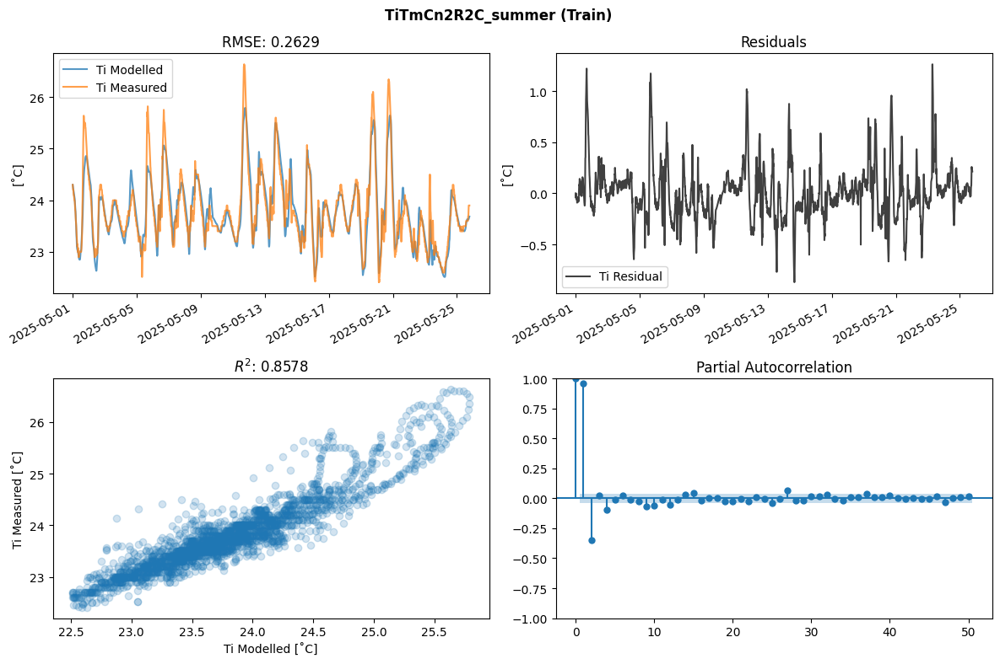

In [4]:
plot(y_train, train_results, 'TiTmCn2R2C_summer (Train)')

## Test results

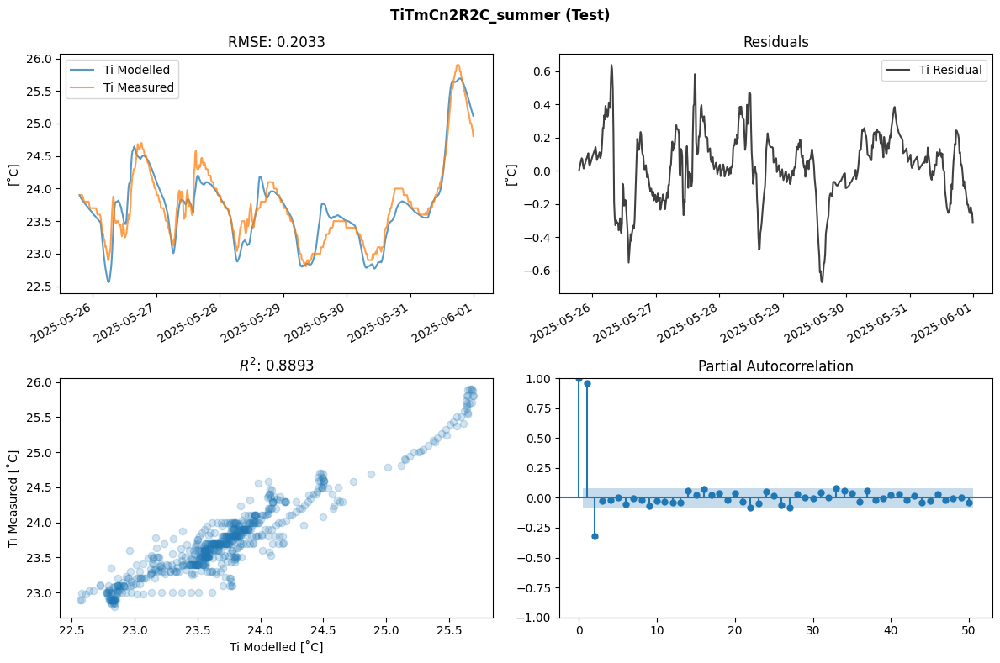

In [5]:
plot(y_test, test_results, 'TiTmCn2R2C_summer (Test)')

## Plot the main results

Using variables already in memory.


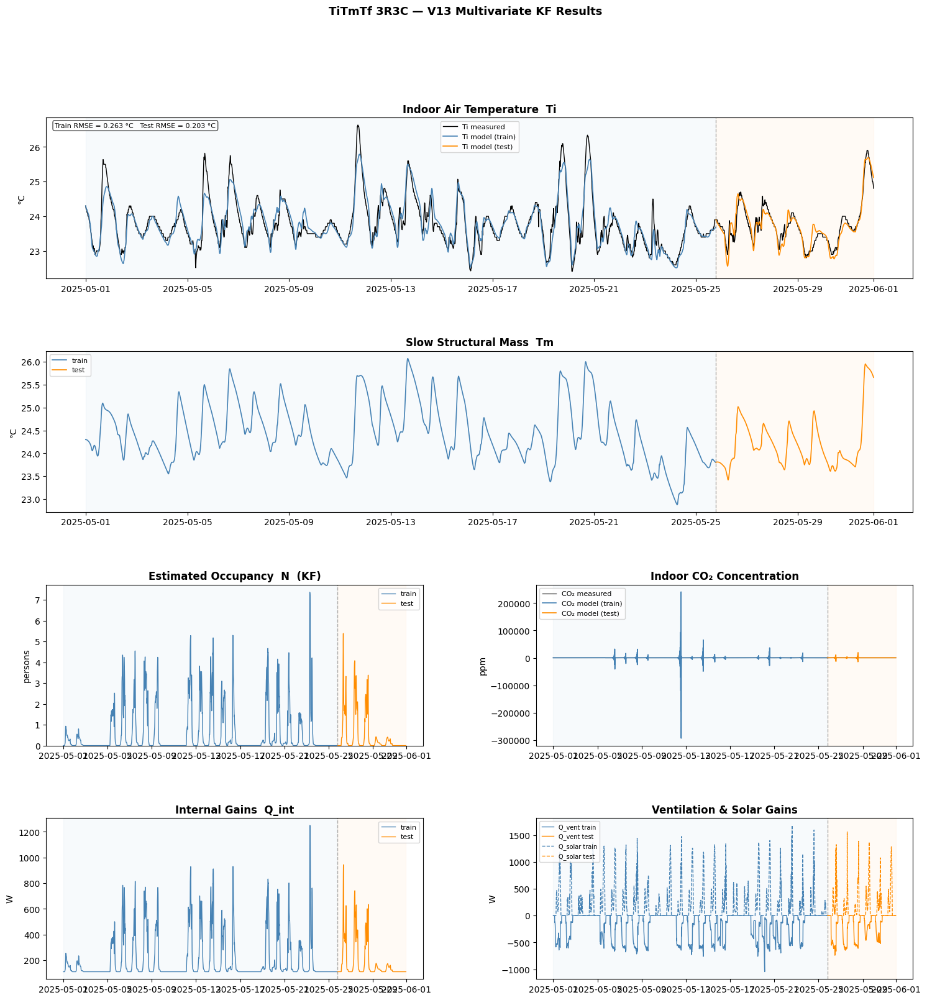

In [6]:
import pickle
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

RESULTS_FILE = "simulation_results.pkl"

# ── Load from pickle if variables are not already in memory ──────────────────
if 'df' not in dir() or 'y_train' not in dir():
    print("Variables not in memory — loading from saved file...")
    with open(RESULTS_FILE, "rb") as f:
        saved = pickle.load(f)
    df            = saved["df"]
    X_train       = saved["X_train"]
    y_train       = saved["y_train"]
    X_test        = saved["X_test"]
    y_test        = saved["y_test"]
    model         = saved["model"]
    train_results = saved["train_results"]
    test_results  = saved["test_results"]
    print("Loaded successfully!")
else:
    print("Using variables already in memory.")

# ── get_var: handles DarkGreyModelResult attribute-based access ───────────────
def get_var(result, key):
    if key in result.var:
        return np.asarray(result.var[key], dtype=float)
    print(f"Warning: '{key}' not found in result.var. Available keys: {list(result.var.keys())}")
    return None

def rmse(pred, actual):
    return np.sqrt(np.mean((np.asarray(pred) - np.asarray(actual)) ** 2))

# ── Reconstruct time index ────────────────────────────────────────────────────
train_index = X_train.index
test_index  = X_test.index

# ── Unpack results ────────────────────────────────────────────────────────────
Ti_train   = get_var(train_results, 'Ti')
Tm_train   = get_var(train_results, 'Tm')
N_train    = get_var(train_results, 'N')
c_train    = get_var(train_results, 'c')
Qint_train = get_var(train_results, 'Q_int')
Qven_train = get_var(train_results, 'Q_vent')
Qsol_train = get_var(train_results, 'Q_solar')

Ti_test    = get_var(test_results, 'Ti')
Tm_test    = get_var(test_results, 'Tm')
N_test     = get_var(test_results, 'N')
c_test     = get_var(test_results, 'c')
Qint_test  = get_var(test_results, 'Q_int')
Qven_test  = get_var(test_results, 'Q_vent')
Qsol_test  = get_var(test_results, 'Q_solar')

c_meas_train = np.asarray(X_train['c'], dtype=float)
c_meas_test  = np.asarray(X_test['c'],  dtype=float)

# ── Figure layout — 4 rows ────────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 18))
gs  = gridspec.GridSpec(4, 2, figure=fig, hspace=0.45, wspace=0.3)

ax_ti   = fig.add_subplot(gs[0, :])
ax_tm   = fig.add_subplot(gs[1, :])
ax_n    = fig.add_subplot(gs[2, 0])
ax_co2  = fig.add_subplot(gs[2, 1])
ax_qint = fig.add_subplot(gs[3, 0])
ax_qven = fig.add_subplot(gs[3, 1])

def shade_split(ax):
    ax.axvline(test_index[0], color='grey', lw=1, ls='--', alpha=0.6)
    ax.axvspan(train_index[0], test_index[0],  alpha=0.04, color='steelblue')
    ax.axvspan(test_index[0],  test_index[-1], alpha=0.04, color='darkorange')

# ── 1. Ti ─────────────────────────────────────────────────────────────────────
ax_ti.plot(train_index, y_train,  color='black',      lw=1.0, label='Ti measured')
ax_ti.plot(train_index, Ti_train, color='steelblue',  lw=1.2, label='Ti model (train)')
ax_ti.plot(test_index,  y_test,   color='black',      lw=1.0)
ax_ti.plot(test_index,  Ti_test,  color='darkorange', lw=1.2, label='Ti model (test)')
shade_split(ax_ti)
ax_ti.set_title('Indoor Air Temperature  Ti', fontweight='bold')
ax_ti.set_ylabel('°C')
ax_ti.legend(fontsize=8)
ax_ti.text(0.01, 0.97,
    f'Train RMSE = {rmse(Ti_train, y_train.values):.3f} °C   '
    f'Test RMSE = {rmse(Ti_test, y_test.values):.3f} °C',
    transform=ax_ti.transAxes, va='top', fontsize=8,
    bbox=dict(boxstyle='round', fc='white', alpha=0.7))

# ── 2. Tm ─────────────────────────────────────────────────────────────────────
ax_tm.plot(train_index, Tm_train, color='steelblue',  lw=1.2, label='train')
ax_tm.plot(test_index,  Tm_test,  color='darkorange', lw=1.2, label='test')
shade_split(ax_tm)
ax_tm.set_title('Slow Structural Mass  Tm', fontweight='bold')
ax_tm.set_ylabel('°C')
ax_tm.legend(fontsize=8)

# ── 3. Occupancy N ────────────────────────────────────────────────────────────
ax_n.plot(train_index, N_train, color='steelblue',  lw=1.0, label='train')
ax_n.plot(test_index,  N_test,  color='darkorange', lw=1.0, label='test')
ax_n.set_ylim(bottom=0)
shade_split(ax_n)
ax_n.set_title('Estimated Occupancy  N  (KF)', fontweight='bold')
ax_n.set_ylabel('persons')
ax_n.legend(fontsize=8)

# ── 4. CO2 ────────────────────────────────────────────────────────────────────
ax_co2.plot(train_index, c_meas_train, color='black',      lw=1.0, alpha=0.7, label='CO₂ measured')
ax_co2.plot(train_index, c_train,      color='steelblue',  lw=1.2, label='CO₂ model (train)')
ax_co2.plot(test_index,  c_meas_test,  color='black',      lw=1.0, alpha=0.7)
ax_co2.plot(test_index,  c_test,       color='darkorange', lw=1.2, label='CO₂ model (test)')
shade_split(ax_co2)
ax_co2.set_title('Indoor CO₂ Concentration', fontweight='bold')
ax_co2.set_ylabel('ppm')
ax_co2.legend(fontsize=8)

# ── 5. Internal heat gains ────────────────────────────────────────────────────
ax_qint.plot(train_index, Qint_train, color='steelblue',  lw=1.0, label='train')
ax_qint.plot(test_index,  Qint_test,  color='darkorange', lw=1.0, label='test')
shade_split(ax_qint)
ax_qint.set_title('Internal Gains  Q_int', fontweight='bold')
ax_qint.set_ylabel('W')
ax_qint.legend(fontsize=8)

# ── 6. Ventilation + solar ────────────────────────────────────────────────────
ax_qven.plot(train_index, Qven_train, color='steelblue',  lw=1.0, label='Q_vent train')
ax_qven.plot(test_index,  Qven_test,  color='darkorange', lw=1.0, label='Q_vent test')
ax_qven.plot(train_index, Qsol_train, color='steelblue',  lw=1.0, ls='--', label='Q_solar train')
ax_qven.plot(test_index,  Qsol_test,  color='darkorange', lw=1.0, ls='--', label='Q_solar test')
shade_split(ax_qven)
ax_qven.set_title('Ventilation & Solar Gains', fontweight='bold')
ax_qven.set_ylabel('W')
ax_qven.legend(fontsize=7)

# ── Save & show ───────────────────────────────────────────────────────────────
fig.suptitle('TiTmTf 3R3C — V13 Multivariate KF Results',
             fontsize=13, fontweight='bold')
plt.savefig('V13_results.png', dpi=150, bbox_inches='tight')
plt.show()


# NIGHT VENTILATION

## Analysis of the existing behaviour

  EXISTING NIGHT VENTILATION ANALYSIS
  Night window           : 22:00 – 07:00
  qv threshold used      : 0.0 m³/h
  Night steps total      : 892
  Night vent active      : 343 steps  (38.5%)
  Free cooling active    : 343 steps  (38.5%)
  Missed opportunities   : 549 steps  (61.5%)
  Mean qv (night, active): 133.6 m³/h
  Max  qv (night)        : 289.6 m³/h
  Mean qv (daytime)      : 96.3 m³/h
  Mean ΔT when active    : 12.67 °C  (Ti − Ta)
  Mean ΔT missed opport. : 14.84 °C  (Ti − Ta)


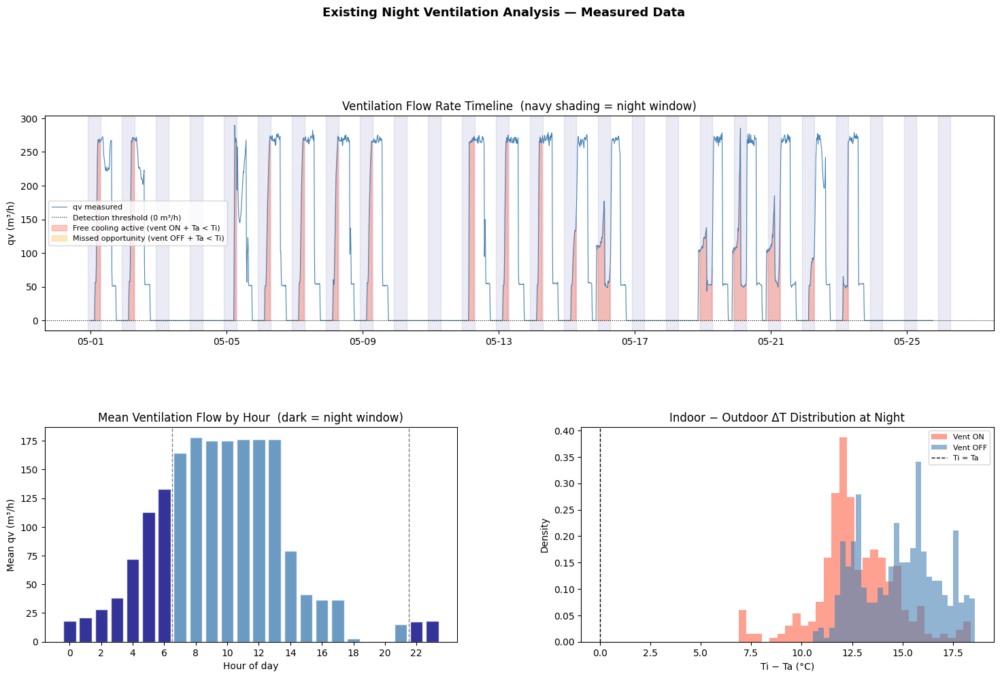

In [7]:
# ════════════════════════════════════════════════════════════════════════════
#  NIGHT VENTILATION ANALYSIS — existing behaviour in measured data
# ════════════════════════════════════════════════════════════════════════════

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd

# ── Config ───────────────────────────────────────────────────────────────────
NIGHT_START   = 22      # hour (inclusive)
NIGHT_STOP    = 7       # hour (exclusive, crosses midnight)
QV_THRESHOLD  = float(np.percentile(np.asarray(X_train['qv'], dtype=float), 25))
                        # anything above 25th percentile at night = "ventilation active"

# ── Raw arrays ───────────────────────────────────────────────────────────────
index   = X_train.index
qv_arr  = np.asarray(X_train['qv'],  dtype=float)
Ta_arr  = np.asarray(X_train['Ta'],  dtype=float)
Ti_meas = np.asarray(y_train,        dtype=float)
hours   = np.array([t.hour + t.minute / 60.0 for t in index])
dt_h    = (index[1] - index[0]).seconds / 3600.0

# ── Night mask (crosses midnight) ────────────────────────────────────────────
night_mask = (hours >= NIGHT_START) | (hours < NIGHT_STOP)

# ── Detect night ventilation events ──────────────────────────────────────────
night_vent_active = night_mask & (qv_arr > QV_THRESHOLD)
free_cooling_ok   = night_mask & (qv_arr > QV_THRESHOLD) & (Ta_arr < Ti_meas)
free_cooling_miss = night_mask & (qv_arr <= QV_THRESHOLD) & (Ta_arr < Ti_meas)
                    # night, no vent, but outdoor is cooler → missed opportunity

# ── Summary statistics ────────────────────────────────────────────────────────
n_night_steps        = night_mask.sum()
n_vent_steps         = night_vent_active.sum()
n_free_cooling_steps = free_cooling_ok.sum()
n_missed_steps       = free_cooling_miss.sum()

pct_night_vented     = 100 * n_vent_steps / n_night_steps if n_night_steps > 0 else 0
pct_free_cooling     = 100 * n_free_cooling_steps / n_night_steps if n_night_steps > 0 else 0
pct_missed           = 100 * n_missed_steps / n_night_steps if n_night_steps > 0 else 0

qv_night_mean = qv_arr[night_vent_active].mean() if n_vent_steps > 0 else 0
qv_night_max  = qv_arr[night_vent_active].max()  if n_vent_steps > 0 else 0
qv_day_mean   = qv_arr[~night_mask].mean()

delta_T_free  = (Ti_meas - Ta_arr)[free_cooling_ok]   # Ti - Ta when free cooling active
delta_T_miss  = (Ti_meas - Ta_arr)[free_cooling_miss]  # Ti - Ta when opportunity missed

print("=" * 60)
print("  EXISTING NIGHT VENTILATION ANALYSIS")
print("=" * 60)
print(f"  Night window           : {NIGHT_START}:00 – {NIGHT_STOP:02d}:00")
print(f"  qv threshold used      : {QV_THRESHOLD:.1f} m³/h")
print(f"  Night steps total      : {n_night_steps}")
print(f"  Night vent active      : {n_vent_steps} steps  ({pct_night_vented:.1f}%)")
print(f"  Free cooling active    : {n_free_cooling_steps} steps  ({pct_free_cooling:.1f}%)")
print(f"  Missed opportunities   : {n_missed_steps} steps  ({pct_missed:.1f}%)")
print(f"  Mean qv (night, active): {qv_night_mean:.1f} m³/h")
print(f"  Max  qv (night)        : {qv_night_max:.1f} m³/h")
print(f"  Mean qv (daytime)      : {qv_day_mean:.1f} m³/h")
if len(delta_T_free) > 0:
    print(f"  Mean ΔT when active    : {delta_T_free.mean():.2f} °C  (Ti − Ta)")
if len(delta_T_miss) > 0:
    print(f"  Mean ΔT missed opport. : {delta_T_miss.mean():.2f} °C  (Ti − Ta)")
print("=" * 60)

# ── Hourly profile: mean qv by hour ──────────────────────────────────────────
hour_int   = np.array([t.hour for t in index])
qv_by_hour = np.array([qv_arr[hour_int == h].mean() for h in range(24)])

# ── Figure ────────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 16))
gs  = fig.add_gridspec(3, 2, hspace=0.45, wspace=0.3)

ax1 = fig.add_subplot(gs[0, :])   # full width — qv timeline
ax2 = fig.add_subplot(gs[1, 0])   # hourly qv profile
ax3 = fig.add_subplot(gs[1, 1])   # ΔT histogram (Ti - Ta) during night

fig.suptitle('Existing Night Ventilation Analysis — Measured Data', fontsize=13, fontweight='bold')

# ── 1. qv timeline with night shading ────────────────────────────────────────
ax1.plot(index, qv_arr, color='steelblue', lw=0.8, label='qv measured')
ax1.axhline(QV_THRESHOLD, color='black', lw=0.8, ls=':', label=f'Detection threshold ({QV_THRESHOLD:.0f} m³/h)')

# shade night periods
day_start = index[0].normalize()
for d in range((index[-1] - index[0]).days + 2):
    ns = day_start + pd.Timedelta(hours=NIGHT_START + d * 24 - 24)
    ne = day_start + pd.Timedelta(hours=NIGHT_STOP   + d * 24)
    ax1.axvspan(ns, ne, alpha=0.08, color='navy', zorder=0)

# mark free-cooling active steps
ax1.fill_between(index, qv_arr, 0,
    where=free_cooling_ok, alpha=0.35, color='tomato',
    label='Free cooling active (vent ON + Ta < Ti)')
ax1.fill_between(index, QV_THRESHOLD, 0,
    where=free_cooling_miss, alpha=0.25, color='orange',
    label='Missed opportunity (vent OFF + Ta < Ti)')

ax1.set_ylabel('qv (m³/h)')
ax1.legend(fontsize=8)
ax1.set_title('Ventilation Flow Rate Timeline  (navy shading = night window)')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))

# ── 2. Mean qv by hour of day ─────────────────────────────────────────────────
bar_colors = ['navy' if (h >= NIGHT_START or h < NIGHT_STOP) else 'steelblue'
              for h in range(24)]
ax2.bar(range(24), qv_by_hour, color=bar_colors, alpha=0.8, edgecolor='white')
ax2.axvline(NIGHT_START - 0.5, color='black', lw=1, ls='--', alpha=0.5)
ax2.axvline(NIGHT_STOP  - 0.5, color='black', lw=1, ls='--', alpha=0.5)
ax2.set_xlabel('Hour of day')
ax2.set_ylabel('Mean qv (m³/h)')
ax2.set_title('Mean Ventilation Flow by Hour  (dark = night window)')
ax2.set_xticks(range(0, 24, 2))

# ── 3. Histogram of ΔT = Ti − Ta during night ─────────────────────────────────
delta_T_all_night = (Ti_meas - Ta_arr)[night_mask]
ax3.hist(delta_T_all_night[night_vent_active[night_mask]],
         bins=30, color='tomato', alpha=0.6, label='Vent ON', density=True)
ax3.hist(delta_T_all_night[~night_vent_active[night_mask]],
         bins=30, color='steelblue', alpha=0.6, label='Vent OFF', density=True)
ax3.axvline(0, color='black', lw=1, ls='--', label='Ti = Ta')
ax3.set_xlabel('Ti − Ta (°C)')
ax3.set_ylabel('Density')
ax3.set_title('Indoor − Outdoor ΔT Distribution at Night')
ax3.legend(fontsize=8)


plt.savefig('night_vent_analysis.png', dpi=150, bbox_inches='tight')
plt.show()


## COP calculation

Raw cooling data (first rows):
                           HTRK_VEN01_COM01_P  HTRK_VEN01_EM01_P
ts                                                              
2025-05-31 22:00:00+00:00                 0.0           0.030000
2025-05-31 22:15:00+00:00                 0.0           0.030000
2025-05-31 22:30:00+00:00                 0.0           0.030467
2025-05-31 22:45:00+00:00                 0.0           0.030000
2025-05-31 23:00:00+00:00                 0.0           0.030000


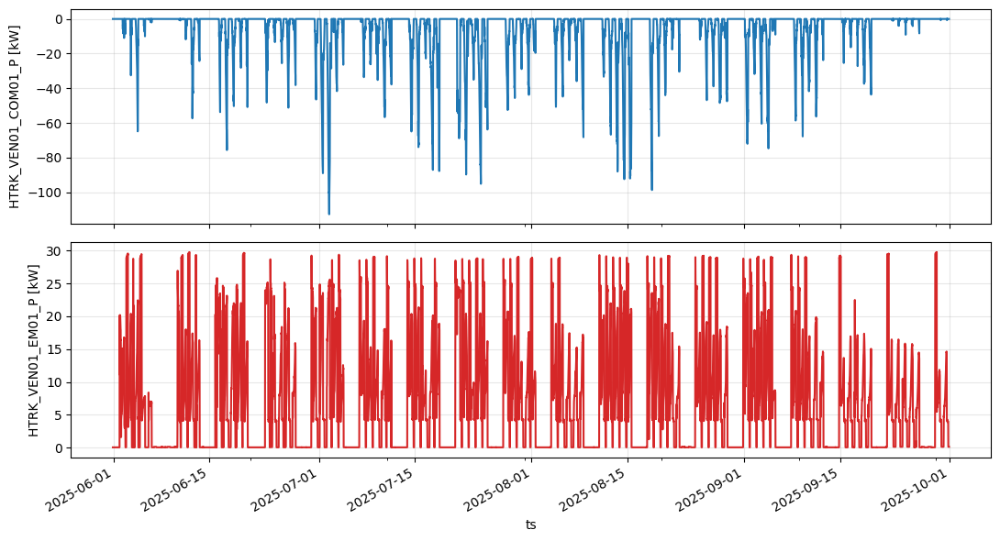


Cooling ON samples: 3,171

COP stats (after filtering):
count    2406.000000
mean        2.409835
std         1.055423
min         1.000442
25%         1.590379
50%         2.219489
75%         2.990852
max         9.412850
Name: COP, dtype: float64


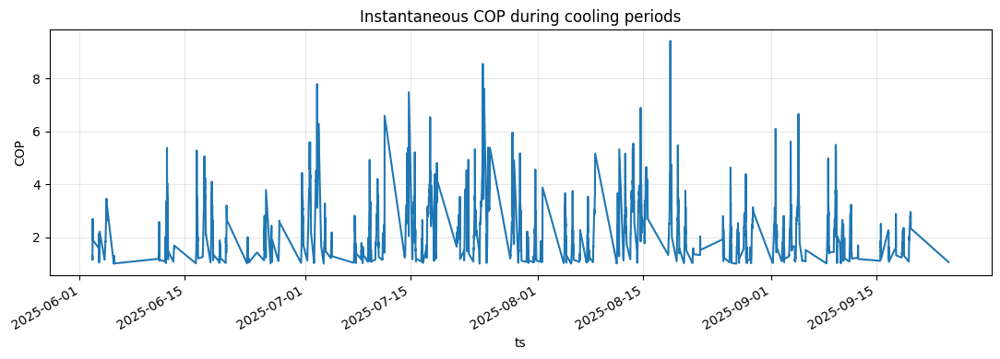


Use this in your night-vent model:
COP_COOL = 2.22   # median COP, IQR [1.59, 2.99]


In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ── CONFIG ────────────────────────────────────────────────────────────────────
FILE_COOL = "data/cooling_data.csv"
Q_COL     = "HTRK_VEN01_COM01_P"   # candidate: thermal power [kW]
P_COL     = "HTRK_VEN01_EM01_P"    # candidate: electric power [kW]

# ── LOAD ──────────────────────────────────────────────────────────────────────
df_cool = pd.read_csv(FILE_COOL, index_col=0, parse_dates=True)
df_cool.index.name = "ts"

# Keep only relevant columns and drop NaNs
df = df_cool[[Q_COL, P_COL]].dropna().copy()

print("Raw cooling data (first rows):")
print(df.head())

# ── BASIC PLOTS FOR SANITY ───────────────────────────────────────────────────
fig, ax = plt.subplots(2, 1, figsize=(11, 6), sharex=True)
df[Q_COL].plot(ax=ax[0])
ax[0].set_ylabel(f"{Q_COL} [kW]")
ax[0].grid(alpha=0.3)

df[P_COL].plot(ax=ax[1], color="tab:red")
ax[1].set_ylabel(f"{P_COL} [kW]")
ax[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ── FILTER TO PERIODS WITH REAL COOLING ──────────────────────────────────────
# Thresholds: adjust if needed after looking at the plots
Q_MIN = 2.0   # kW thermal, ignore tiny loads
P_MIN = 0.5   # kW electric

mask_on = (df[Q_COL].abs() > Q_MIN) & (df[P_COL] > P_MIN)
df_on   = df[mask_on].copy()

print(f"\nCooling ON samples: {len(df_on):,}")

# ── COMPUTE INSTANTANEOUS COP ────────────────────────────────────────────────
df_on["COP"] = df_on[Q_COL].abs() / df_on[P_COL]

# Optional: remove extreme outliers (sensor glitches)
df_on = df_on[(df_on["COP"] > 1.0) & (df_on["COP"] < 10.0)]

print("\nCOP stats (after filtering):")
print(df_on["COP"].describe())

# ── PLOT COP TIMESERIES ──────────────────────────────────────────────────────
plt.figure(figsize=(11, 4))
df_on["COP"].plot()
plt.ylabel("COP")
plt.grid(alpha=0.3)
plt.title("Instantaneous COP during cooling periods")
plt.tight_layout()
plt.show()

# ── FINAL DATA-DRIVEN COP_COOL VALUE ─────────────────────────────────────────
COP_mean = df_on["COP"].median()
COP_p25, COP_p75 = df_on["COP"].quantile([0.25, 0.75])

print(f"\nUse this in your night-vent model:")
print(f"COP_COOL = {COP_mean:.2f}   # median COP, IQR [{COP_p25:.2f}, {COP_p75:.2f}]")

## SFP calculation

═══════════════════════════════════════════════════════
Night rows (22h–06h local) : 684
Day   rows (06h–22h local) : 3,291

Night AHU flow  [m³/h]:
count      684.000000
mean     19101.499991
std      10605.255140
min       7061.330000
25%       9816.320869
50%      13281.207775
75%      32226.955892
max      33001.377920

Night SFP [W/(m³/h)]:
count    684.000000
mean       0.607554
std        0.120852
min        0.460660
25%        0.497236
50%        0.549928
75%        0.751530
max        0.787912

Day SFP median : 0.5743 W/(m³/h)
Night SFP median: 0.5499 W/(m³/h)

═══════════════════════════════════════════════════════
Nighttime AHU flow (median) : 13281 m³/h
SFP at night operating point: 0.4925 W/(m³/h)  ← use this in model
SFP at day   operating point: 0.5179 W/(m³/h)
Datasheet SFP               : 0.5111 W/(m³/h)
Difference (night, measured vs datasheet): -3.6%


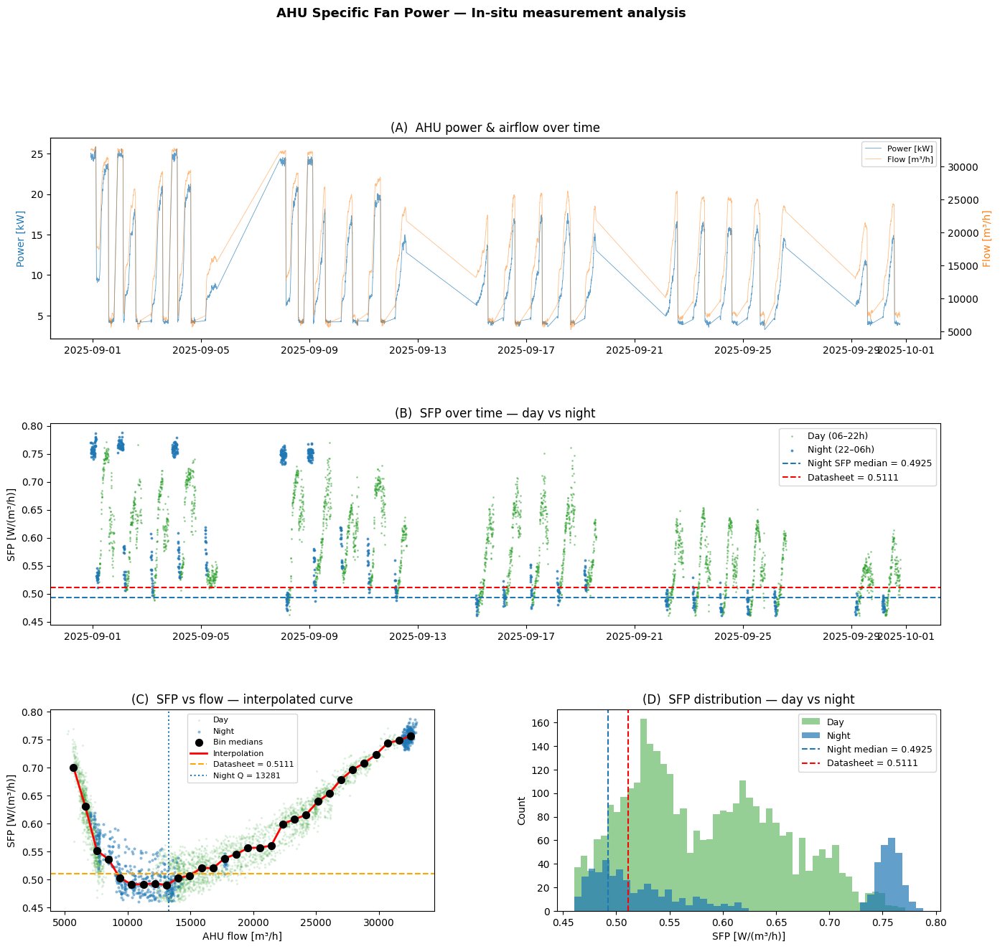

Quadratic SFP fit (AHU level):
SFP(Q) = 9.741e-10 * Q^2 + -3.033e-05 * Q + 7.582e-01


In [9]:
# ════════════════════════════════════════════════════════════════════════════
#  SFP CALCULATION — interpolation-based, with night vs day split
# ════════════════════════════════════════════════════════════════════════════
import pandas as pd
import numpy as np
from scipy.stats import binned_statistic
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import warnings
warnings.filterwarnings("ignore")

FILE          = "data/ventilation.csv"
COL_KW        = "HTRK_VEN01_EM01_P"
COL_M3H       = "HTRK_VEN01_FCI01"
Q_MIN         = 500;   Q_MAX = 36000;  P_MIN = 0.05
ROLL_STD_W    = 3;     ROLL_THRESH = 0.5
SFP_DATASHEET = 1840 / 3600
Q_ROOM_MAX    = 270.0
Q_AHU_TOTAL   = 35000.0

# ── Load ──────────────────────────────────────────────────────────────────────
df = pd.read_csv(FILE, index_col=0, parse_dates=True)
df.index.name = "ts"
df = df.reset_index()
df = df.rename(columns={COL_KW: "P_kW", COL_M3H: "Q_m3h"})
df = df.sort_values("ts").reset_index(drop=True)

# ── Clean ─────────────────────────────────────────────────────────────────────
df = df.dropna(subset=["P_kW", "Q_m3h"])
df = df[(df.P_kW >= P_MIN) & (df.P_kW <= 500)]
df = df[(df.Q_m3h >= Q_MIN) & (df.Q_m3h <= Q_MAX)]
df["P_roll_std"] = df["P_kW"].rolling(ROLL_STD_W, center=True).std()
df_steady = df[df["P_roll_std"] <= ROLL_THRESH].copy()

df_steady["SFP_Wm3h"] = (df_steady["P_kW"] * 1000) / df_steady["Q_m3h"]
SFP_lo, SFP_hi = df_steady["SFP_Wm3h"].quantile([0.005, 0.995])
df_clean = df_steady[(df_steady["SFP_Wm3h"] >= SFP_lo) &
                     (df_steady["SFP_Wm3h"] <= SFP_hi)].copy()

# ── Night / Day split ─────────────────────────────────────────────────────────
# UTC timestamps → local Copenhagen time (UTC+2 in September)
df_clean["ts_local"] = df_clean["ts"].dt.tz_convert("Europe/Copenhagen")
df_clean["hour"]     = df_clean["ts_local"].dt.hour
night_mask = (df_clean["hour"] >= 22) | (df_clean["hour"] <= 6)
day_mask   = ~night_mask

print("═" * 55)
print(f"Night rows (22h–06h local) : {night_mask.sum():,}")
print(f"Day   rows (06h–22h local) : {day_mask.sum():,}")
print(f"\nNight AHU flow  [m³/h]:")
print(df_clean.loc[night_mask, "Q_m3h"].describe(percentiles=[.25,.50,.75]).to_string())
print(f"\nNight SFP [W/(m³/h)]:")
print(df_clean.loc[night_mask, "SFP_Wm3h"].describe(percentiles=[.25,.50,.75]).to_string())
print(f"\nDay SFP median : {df_clean.loc[day_mask,   'SFP_Wm3h'].median():.4f} W/(m³/h)")
print(f"Night SFP median: {df_clean.loc[night_mask, 'SFP_Wm3h'].median():.4f} W/(m³/h)")

# ── Binned SFP(Q) curve — used for interpolation ──────────────────────────────
n_bins = 30
bin_means, bin_edges, _ = binned_statistic(
    df_clean["Q_m3h"], df_clean["SFP_Wm3h"], statistic="median", bins=n_bins)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
bin_counts, _, _ = binned_statistic(
    df_clean["Q_m3h"], df_clean["SFP_Wm3h"], statistic="count", bins=n_bins)
bin_df = pd.DataFrame({
    "Q_center_m3h": bin_centers,
    "SFP_median_Wm3h": bin_means,
    "count": bin_counts
}).dropna()

# ── Interpolation function (replaces power-law) ───────────────────────────────
from scipy.interpolate import interp1d
sfp_interp = interp1d(
    bin_df["Q_center_m3h"], bin_df["SFP_median_Wm3h"],
    kind="linear", fill_value="extrapolate"
)

# Key SFP values for your model
Q_night_median = df_clean.loc[night_mask, "Q_m3h"].median()
SFP_night      = float(sfp_interp(Q_night_median))
SFP_day        = float(sfp_interp(df_clean.loc[day_mask, "Q_m3h"].median()))

print(f"\n{'═'*55}")
print(f"Nighttime AHU flow (median) : {Q_night_median:.0f} m³/h")
print(f"SFP at night operating point: {SFP_night:.4f} W/(m³/h)  ← use this in model")
print(f"SFP at day   operating point: {SFP_day:.4f} W/(m³/h)")
print(f"Datasheet SFP               : {SFP_DATASHEET:.4f} W/(m³/h)")
print(f"Difference (night, measured vs datasheet): {(SFP_night - SFP_DATASHEET)/SFP_DATASHEET*100:+.1f}%")

# ── PLOTS ─────────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(16, 14))
gs  = gridspec.GridSpec(3, 2, figure=fig, hspace=0.42, wspace=0.32)

# (A) Time series
ax1  = fig.add_subplot(gs[0, :])
ax1b = ax1.twinx()
ax1.plot(df_clean["ts"], df_clean["P_kW"],   color="#1f77b4", lw=0.6, alpha=0.7, label="Power [kW]")
ax1b.plot(df_clean["ts"], df_clean["Q_m3h"], color="#ff7f0e", lw=0.6, alpha=0.5, label="Flow [m³/h]")
ax1.set_ylabel("Power [kW]", color="#1f77b4"); ax1b.set_ylabel("Flow [m³/h]", color="#ff7f0e")
ax1.set_title("(A)  AHU power & airflow over time")
lines1, lab1 = ax1.get_legend_handles_labels(); lines2, lab2 = ax1b.get_legend_handles_labels()
ax1.legend(lines1+lines2, lab1+lab2, loc="upper right", fontsize=8)

# (B) SFP time series — night highlighted
ax2 = fig.add_subplot(gs[1, :])
ax2.scatter(df_clean.loc[day_mask,   "ts"], df_clean.loc[day_mask,   "SFP_Wm3h"],
            s=1, color="#2ca02c", alpha=0.4, label="Day (06–22h)")
ax2.scatter(df_clean.loc[night_mask, "ts"], df_clean.loc[night_mask, "SFP_Wm3h"],
            s=3, color="#1f77b4", alpha=0.7, label="Night (22–06h)")
ax2.axhline(SFP_night,      color="#1f77b4", ls="--", lw=1.5, label=f"Night SFP median = {SFP_night:.4f}")
ax2.axhline(SFP_DATASHEET,  color="red",     ls="--", lw=1.5, label=f"Datasheet = {SFP_DATASHEET:.4f}")
ax2.set_ylabel("SFP [W/(m³/h)]"); ax2.set_title("(B)  SFP over time — day vs night")
ax2.legend(fontsize=9)

# (C) SFP vs Flow — interpolation instead of power law
ax3 = fig.add_subplot(gs[2, 0])
ax3.scatter(df_clean.loc[day_mask,   "Q_m3h"], df_clean.loc[day_mask,   "SFP_Wm3h"],
            s=2, alpha=0.1, color="#2ca02c", label="Day")
ax3.scatter(df_clean.loc[night_mask, "Q_m3h"], df_clean.loc[night_mask, "SFP_Wm3h"],
            s=4, alpha=0.4, color="#1f77b4", label="Night")
ax3.scatter(bin_df["Q_center_m3h"], bin_df["SFP_median_Wm3h"],
            s=50, color="black", zorder=5, label="Bin medians")
Q_line = np.linspace(bin_df["Q_center_m3h"].min(), bin_df["Q_center_m3h"].max(), 300)
ax3.plot(Q_line, sfp_interp(Q_line), color="red", lw=2, label="Interpolation")
ax3.axhline(SFP_DATASHEET,  color="orange", ls="--", lw=1.5, label=f"Datasheet = {SFP_DATASHEET:.4f}")
ax3.axvline(Q_night_median, color="#1f77b4", ls=":",  lw=1.5, label=f"Night Q = {Q_night_median:.0f}")
ax3.set_xlabel("AHU flow [m³/h]"); ax3.set_ylabel("SFP [W/(m³/h)]")
ax3.set_title("(C)  SFP vs flow — interpolated curve")
ax3.legend(fontsize=8)

# (D) Histogram day vs night
ax4 = fig.add_subplot(gs[2, 1])
ax4.hist(df_clean.loc[day_mask,   "SFP_Wm3h"], bins=50, color="#2ca02c", alpha=0.5, label="Day")
ax4.hist(df_clean.loc[night_mask, "SFP_Wm3h"], bins=50, color="#1f77b4", alpha=0.7, label="Night")
ax4.axvline(SFP_night,     color="#1f77b4", ls="--", lw=1.5, label=f"Night median = {SFP_night:.4f}")
ax4.axvline(SFP_DATASHEET, color="red",     ls="--", lw=1.5, label=f"Datasheet = {SFP_DATASHEET:.4f}")
ax4.set_xlabel("SFP [W/(m³/h)]"); ax4.set_ylabel("Count")
ax4.set_title("(D)  SFP distribution — day vs night")
ax4.legend(fontsize=9)

plt.suptitle("AHU Specific Fan Power — In-situ measurement analysis", fontsize=13, fontweight="bold", y=1.01)
plt.show()

# Fit a quadratic SFP(Q) on cleaned AHU data
coeffs = np.polyfit(df_clean["Q_m3h"], df_clean["SFP_Wm3h"], deg=2)
a, b, c = coeffs

print("Quadratic SFP fit (AHU level):")
print(f"SFP(Q) = {a:.3e} * Q^2 + {b:.3e} * Q + {c:.3e}")

In [10]:
print(SFP_night)

0.4925204771389813



Smooth PW Q2/Q2 best breakpoint = 10331 m3/h
  Left  aL = 1.176e-08
  Right aR = 3.710e-10
  Shared b = 4.753e-06
  Shared c = 4.815e-01

Smooth PW Q2/Q2 night breakpoint = 13281 m3/h
  Left  aL = 4.763e-09
  Right aR = 1.809e-10
  Shared b = 1.094e-05
  Shared c = 4.845e-01

Model comparison including smooth piecewise:
                        model     RMSE      MAE       R2
 Smooth PW Q2/Q2 best @ 10331 0.009912 0.007994 0.987250
Smooth PW Q2/Q2 night @ 13281 0.011327 0.008891 0.983347
 Piecewise Q2/Q2 best @ 10331 0.011355 0.008617 0.983266
      Piecewise Q2/Q2 @ 13281 0.015957 0.011735 0.966952
                        Cubic 0.016872 0.013411 0.963057
                    Quadratic 0.034328 0.030115 0.847066


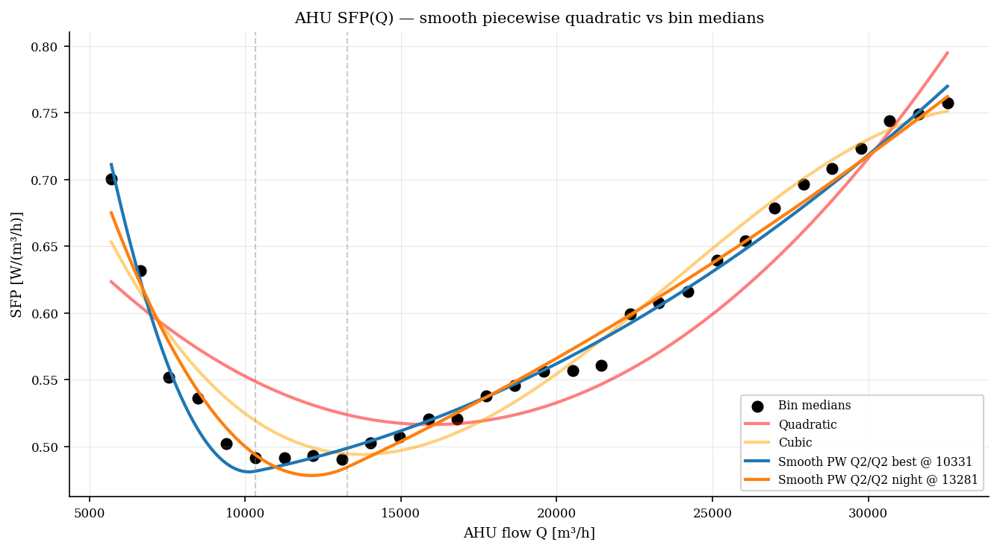

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# x, y, w as before
x = bin_df["Q_center_m3h"].to_numpy()
y = bin_df["SFP_median_Wm3h"].to_numpy()
w = bin_df["count"].to_numpy().astype(float)
w = w / w.max()  # optional weighting

def eval_metrics(y_true, y_pred, name):
    return {
        "model": name,
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAE": mean_absolute_error(y_true, y_pred),
        "R2": r2_score(y_true, y_pred)
    }

# ------------------------------------------------------------
# 1) Fit a C1-smooth piecewise quadratic for a given breakpoint
# ------------------------------------------------------------
def fit_smooth_piecewise_quadratic(x, y, bp, weights=None):
    """
    f(Q) = aL*(Q-bp)^2 + b*(Q-bp) + c  for Q <= bp
         = aR*(Q-bp)^2 + b*(Q-bp) + c  for Q > bp
    """
    q_shift = x - bp

    left = q_shift <= 0
    right = ~left

    # Design matrix: [phi_L2, phi_R2, phi_lin, const]
    # phi_L2  = (Q-bp)^2 on left, 0 on right
    # phi_R2  = (Q-bp)^2 on right, 0 on left
    # phi_lin = (Q-bp) on both sides
    # const   = 1 on both sides
    phi_L2 = np.where(left, q_shift**2, 0.0)
    phi_R2 = np.where(right, q_shift**2, 0.0)
    phi_lin = q_shift
    const = np.ones_like(x)

    A = np.vstack([phi_L2, phi_R2, phi_lin, const]).T

    if weights is not None:
        # Weighted least squares: sqrt(w) * A, sqrt(w) * y
        sw = np.sqrt(weights)
        A_w = A * sw[:, None]
        y_w = y * sw
        coeffs, *_ = np.linalg.lstsq(A_w, y_w, rcond=None)
    else:
        coeffs, *_ = np.linalg.lstsq(A, y, rcond=None)

    aL, aR, b, c = coeffs

    # prediction on x
    y_hat = np.where(left,
                     aL*q_shift**2 + b*q_shift + c,
                     aR*q_shift**2 + b*q_shift + c)

    return (aL, aR, b, c), y_hat

# ------------------------------------------------------------
# 2) Fit for two candidate breakpoints: best (10331) and night (13281)
# ------------------------------------------------------------
bp_best = 10331.0   # from your search
bp_night = 13281.0  # from night median

models = []

for bp, label in [(bp_best, "Smooth PW Q2/Q2 best"),
                  (bp_night, "Smooth PW Q2/Q2 night")]:
    (aL, aR, b, c), y_hat = fit_smooth_piecewise_quadratic(x, y, bp, weights=w)
    m = eval_metrics(y, y_hat, f"{label} @ {bp:.0f}")
    models.append((label, bp, aL, aR, b, c, y_hat, m))
    print(f"\n{label} breakpoint = {bp:.0f} m3/h")
    print(f"  Left  aL = {aL:.3e}")
    print(f"  Right aR = {aR:.3e}")
    print(f"  Shared b = {b:.3e}")
    print(f"  Shared c = {c:.3e}")

# existing results from before, e.g. res_df with quadratic/cubic/piecewise
# Add new rows and compare
new_rows = [m for *_, m in models]
res_df2 = pd.concat([res_df, pd.DataFrame(new_rows)], ignore_index=True)
res_df2 = res_df2.sort_values("RMSE")
print("\nModel comparison including smooth piecewise:")
print(res_df2.to_string(index=False))

# ------------------------------------------------------------
# 3) Plot against bin medians and old curves for visual check
# ------------------------------------------------------------
Q_line = np.linspace(x.min(), x.max(), 500)

plt.figure(figsize=(9, 5))
plt.scatter(x, y, s=45, color="black", label="Bin medians")

# previous global fits, if you still have poly2/poly3 etc.
plt.plot(Q_line, poly2(Q_line), lw=2, color="red", alpha=0.5, label="Quadratic")
plt.plot(Q_line, poly3(Q_line), lw=2, color="orange", alpha=0.5, label="Cubic")

for label, bp, aL, aR, b, c, _, _ in models:
    q_shift_line = Q_line - bp
    left_line = q_shift_line <= 0
    y_line = np.where(left_line,
                      aL*q_shift_line**2 + b*q_shift_line + c,
                      aR*q_shift_line**2 + b*q_shift_line + c)
    plt.plot(Q_line, y_line, lw=2,
             label=f"{label} @ {bp:.0f}")
    plt.axvline(bp, color="grey", ls="--", alpha=0.4)

plt.xlabel("AHU flow Q [m³/h]")
plt.ylabel("SFP [W/(m³/h)]")
plt.title("AHU SFP(Q) — smooth piecewise quadratic vs bin medians")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

In [27]:
# ===== Best smooth piecewise quadratic SFP(Q) =====
# From your fit:
BP_SFP = 10331.0   # m3/h, breakpoint Q0

aL = 1.176e-08
aR = 3.710e-10
b  = 4.753e-06
c  = 4.815e-01

def SFP_best(Q):
    """
    Smooth piecewise quadratic SFP(Q) with breakpoint at BP_SFP.
    Q can be scalar or numpy array (m3/h).
    """
    Q = np.asarray(Q, dtype=float)
    q_shift = Q - BP_SFP
    left = q_shift <= 0.0

    SFP = np.empty_like(q_shift)
    # Left branch: Q <= BP_SFP
    SFP[left]  = aL*q_shift[left]**2  + b*q_shift[left]  + c
    # Right branch: Q > BP_SFP
    SFP[~left] = aR*q_shift[~left]**2 + b*q_shift[~left] + c

    return SFP

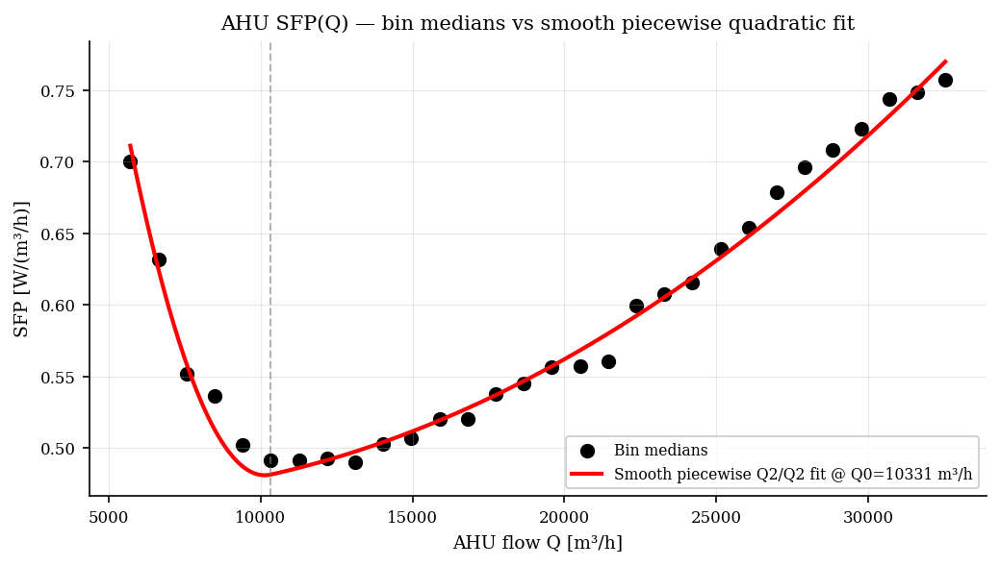

In [32]:
# ── Check: best SFP(Q) vs bin medians ────────────────────────────────────────
# Use only the flow range seen in the data
Q_min_fit = bin_df["Q_center_m3h"].min()
Q_max_fit = bin_df["Q_center_m3h"].max()
Q_line    = np.linspace(Q_min_fit, Q_max_fit, 300)

SFP_line = SFP_best(Q_line)

plt.figure(figsize=(7, 4))
plt.scatter(
    bin_df["Q_center_m3h"], bin_df["SFP_median_Wm3h"],
    s=40, color="black", label="Bin medians"
)
plt.plot(
    Q_line, SFP_line,
    color="red", lw=2,
    label=f"Smooth piecewise Q2/Q2 fit @ Q0={BP_SFP:.0f} m³/h"
)
plt.axvline(BP_SFP, color="grey", ls="--", lw=1, alpha=0.6)

plt.xlabel("AHU flow Q [m³/h]")
plt.ylabel("SFP [W/(m³/h)]")
plt.title("AHU SFP(Q) — bin medians vs smooth piecewise quadratic fit")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

## Functional description of ventilation

Shape: (2976, 4)
            qv      CO2       Ti       Ta
count  2976.00  2976.00  2976.00  2976.00
mean     80.81   448.06    23.79    12.10
std     107.73    70.46     0.68     3.38
min       0.00   390.59    22.41     4.60
25%       0.00   413.80    23.40     9.80
50%       0.00   421.82    23.70    11.74
75%     171.40   440.03    24.03    14.31
max     289.59  1002.21    26.63    21.95

Day samples  : 1,984
Night samples: 992

── Correlations ──────────────────────────────────────
[Day]  qv~CO2  Pearson r=0.656 p=3.0e-244  Spearman ρ=0.809
[Day]  qv~Ti   Pearson r=-0.405  p=2.5e-79   Spearman ρ=-0.380
[Night]  qv~CO2  Pearson r=0.608 p=2.9e-101  Spearman ρ=0.593
[Night]  qv~Ti   Pearson r=-0.252  p=8.4e-16   Spearman ρ=-0.354

── Piecewise fits ────────────────────────────────────
[Day] CO2 setpoint~488 ppm | slope_below=2.9644  slope_above=-0.0970  R²=0.656
[Day] Ti  setpoint~22.0 °C  | slope_below=0.0000  slope_above=0.0000  R²=0.000
[Night] CO2 setpoint~800 ppm | slope_below=0

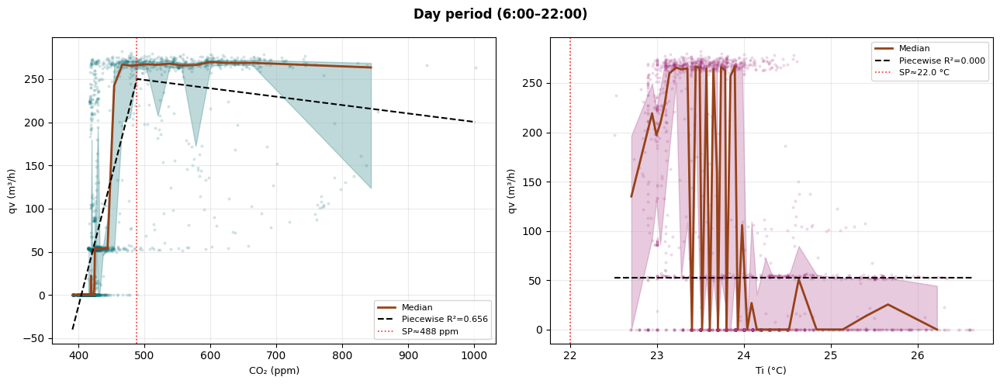

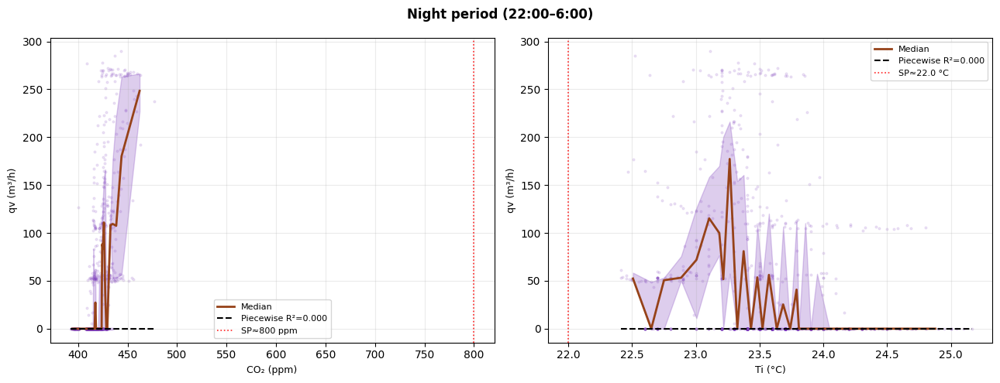

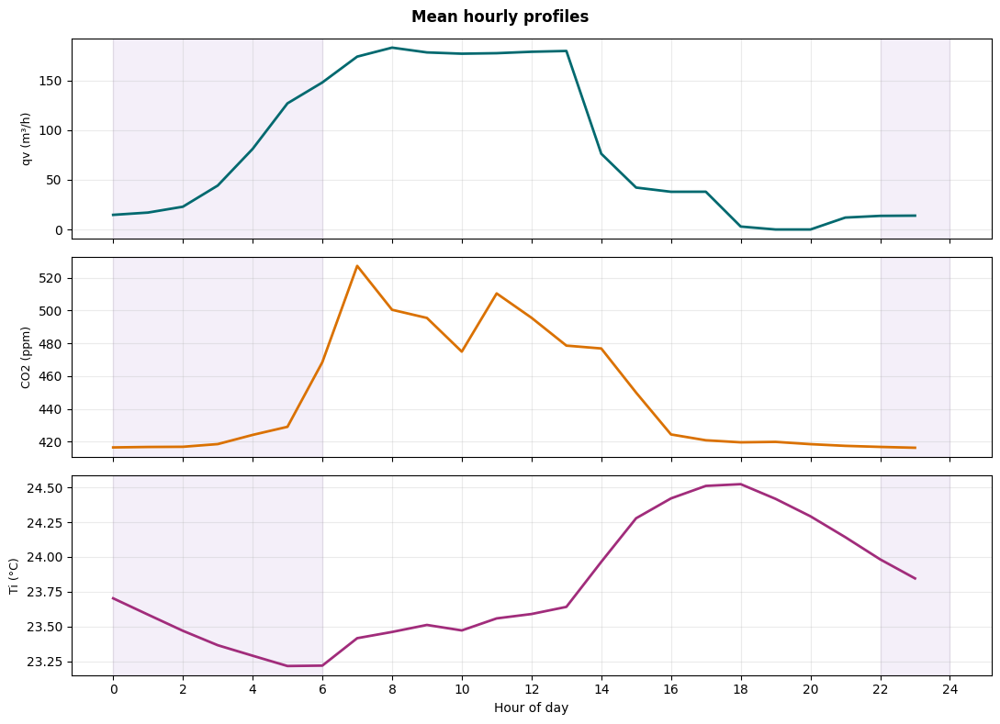


════════════════════════════════════════════════════════════
  VENTILATION CONTROL LAW  —  extracted from data
════════════════════════════════════════════════════════════

┌─ DAY  (6:00 – 22:00)  ──────────────────────────────────┐
│  Type       : Bang-bang (on/off), CO2-driven                  │
│  Trigger    : CO2 > CO2_SP  →  qv = QV_MAX                   │
│  CO2_SP     :   457.7 ppm   (data-derived midpoint)         │
│  QV_MAX     :   272.4 m³/h  (95th percentile observed)      │
│  QV_MIN     :     0.0 m³/h  (off state)                       │
│  Vent ON    :  55.2% of day steps                         │
│  Vent OFF   :  44.8% of day steps                         │
│  Ti role    : None (state variable, not control input)        │
└───────────────────────────────────────────────────────────────┘

┌─ NIGHT  (22:00 – 6:00)  ─────────────────────────────────┐
│  Type       : Free-cooling (partial), Ta-driven               │
│  Trigger    : Ta < Ti  →  qv = QV_NIGHT  (probabilistic

In [11]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score

# ── CONFIG ────────────────────────────────────────────────────────────────────
RESULTS_FILE      = "simulation_results_mcmc_2025_05.pkl"
DAY_START_H       = 6
DAY_END_H         = 22
CO2_SETPOINT_HINT = 800
TI_SETPOINT_HINT  = 22.0

# ── LOAD ──────────────────────────────────────────────────────────────────────
with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]])
y = pd.concat([saved["y_train"], saved["y_test"]])

# Include Ta (outdoor temp) for free-cooling analysis
data = pd.DataFrame({
    "qv":  X["qv"],
    "CO2": X["c"],
    "Ti":  y,
    "Ta":  X["Ta"],
}, index=X.index)

print("Shape:", data.shape)
print(data.describe().round(2))

# ── DAY / NIGHT SPLIT ─────────────────────────────────────────────────────────
hour  = data.index.hour + data.index.minute / 60.0
mask  = (hour >= DAY_START_H) & (hour < DAY_END_H)
day   = data[mask].copy()
night = data[~mask].copy()
print(f"\nDay samples  : {len(day):,}")
print(f"Night samples: {len(night):,}")

# ── HELPERS ───────────────────────────────────────────────────────────────────
def piecewise(x, x0, y0, k1, k2):
    return np.where(x < x0, y0 + k1 * (x - x0), y0 + k2 * (x - x0))

def fit_piecewise(x, y, hint):
    x, y = np.asarray(x, float), np.asarray(y, float)
    ok   = np.isfinite(x) & np.isfinite(y)
    x, y = x[ok], y[ok]
    try:
        popt, _ = curve_fit(piecewise, x, y,
                            p0=[hint, np.median(y), 0.0, 0.5],
                            bounds=([x.min(), 0, -5, -5],
                                    [x.max(), y.max()*2, 5, 5]),
                            maxfev=10000)
        r2 = r2_score(y, piecewise(x, *popt))
        return (*popt, r2)
    except Exception:
        return (hint, np.median(y), 0.0, 0.0, 0.0)

def bin_median(x, y, n=40):
    x, y  = np.asarray(x), np.asarray(y)
    edges = np.unique(np.percentile(x, np.linspace(0, 100, n + 1)))
    idx   = np.clip(np.digitize(x, edges) - 1, 0, len(edges) - 2)
    mids, med, q25, q75 = [], [], [], []
    for i in range(len(edges) - 1):
        m = idx == i
        if m.sum() < 3:
            continue
        mids.append(0.5 * (edges[i] + edges[i+1]))
        med.append(np.median(y[m]))
        q25.append(np.percentile(y[m], 25))
        q75.append(np.percentile(y[m], 75))
    return np.array(mids), np.array(med), np.array(q25), np.array(q75)

# ── CORRELATIONS ──────────────────────────────────────────────────────────────
print("\n── Correlations ──────────────────────────────────────")
for label, sub in [("Day", day), ("Night", night)]:
    r_co2, p_co2 = stats.pearsonr(sub["CO2"].dropna(), sub["qv"].dropna())
    r_ti,  p_ti  = stats.pearsonr(sub["Ti"].dropna(),  sub["qv"].dropna())
    rho_co2      = stats.spearmanr(sub["CO2"], sub["qv"]).correlation
    rho_ti       = stats.spearmanr(sub["Ti"],  sub["qv"]).correlation
    print(f"[{label}]  qv~CO2  Pearson r={r_co2:.3f} p={p_co2:.1e}  Spearman ρ={rho_co2:.3f}")
    print(f"[{label}]  qv~Ti   Pearson r={r_ti:.3f}  p={p_ti:.1e}   Spearman ρ={rho_ti:.3f}")

# ── PIECEWISE FITS ────────────────────────────────────────────────────────────
print("\n── Piecewise fits ────────────────────────────────────")
d_co2 = fit_piecewise(day["CO2"],   day["qv"],   CO2_SETPOINT_HINT)
d_ti  = fit_piecewise(day["Ti"],    day["qv"],   TI_SETPOINT_HINT)
n_co2 = fit_piecewise(night["CO2"], night["qv"], CO2_SETPOINT_HINT)
n_ti  = fit_piecewise(night["Ti"],  night["qv"], TI_SETPOINT_HINT)

for label, rc, rt in [("Day", d_co2, d_ti), ("Night", n_co2, n_ti)]:
    print(f"[{label}] CO2 setpoint~{rc[0]:.0f} ppm | slope_below={rc[2]:.4f}  slope_above={rc[3]:.4f}  R²={rc[4]:.3f}")
    print(f"[{label}] Ti  setpoint~{rt[0]:.1f} °C  | slope_below={rt[2]:.4f}  slope_above={rt[3]:.4f}  R²={rt[4]:.3f}")

# ── HOURLY PROFILES ───────────────────────────────────────────────────────────
hourly = data.groupby(data.index.hour)[["qv", "CO2", "Ti"]].mean()

# ── PLOTS ─────────────────────────────────────────────────────────────────────
def scatter_panel(ax, x, y, pw, accent, xlabel, setpoint_label):
    ax.scatter(x, y, c=accent, alpha=0.12, s=4, rasterized=True)
    mx, mmed, mq25, mq75 = bin_median(x, y)
    ax.fill_between(mx, mq25, mq75, alpha=0.25, color=accent)
    ax.plot(mx, mmed, color="#964219", lw=2, label="Median")
    xfit = np.linspace(np.nanmin(x), np.nanmax(x), 300)
    ax.plot(xfit, piecewise(xfit, *pw[:4]), "k--", lw=1.5, label=f"Piecewise R²={pw[4]:.3f}")
    ax.axvline(pw[0], color="red", lw=1.2, ls=":", alpha=0.85, label=f"SP≈{setpoint_label}")
    ax.set_xlabel(xlabel, fontsize=9)
    ax.set_ylabel("qv (m³/h)", fontsize=9)
    ax.legend(fontsize=8)
    ax.grid(alpha=0.25)

fig1, axes = plt.subplots(1, 2, figsize=(13, 5))
fig1.suptitle(f"Day period ({DAY_START_H}:00–{DAY_END_H}:00)", fontweight="bold")
scatter_panel(axes[0], day["CO2"], day["qv"], d_co2, "#01696f", "CO₂ (ppm)", f"{d_co2[0]:.0f} ppm")
scatter_panel(axes[1], day["Ti"],  day["qv"], d_ti,  "#a12c7b", "Ti (°C)",   f"{d_ti[0]:.1f} °C")
fig1.tight_layout(); fig1.savefig("fig_day.png", dpi=150, bbox_inches="tight"); plt.show()

fig2, axes = plt.subplots(1, 2, figsize=(13, 5))
fig2.suptitle(f"Night period ({DAY_END_H}:00–{DAY_START_H}:00)", fontweight="bold")
scatter_panel(axes[0], night["CO2"], night["qv"], n_co2, "#7a39bb", "CO₂ (ppm)", f"{n_co2[0]:.0f} ppm")
scatter_panel(axes[1], night["Ti"],  night["qv"], n_ti,  "#7a39bb", "Ti (°C)",   f"{n_ti[0]:.1f} °C")
fig2.tight_layout(); fig2.savefig("fig_night.png", dpi=150, bbox_inches="tight"); plt.show()

fig3, axes = plt.subplots(3, 1, figsize=(11, 8), sharex=True)
fig3.suptitle("Mean hourly profiles", fontweight="bold")
for ax, (col, color, unit) in zip(axes, [
        ("qv",  "#01696f", "m³/h"),
        ("CO2", "#da7101", "ppm"),
        ("Ti",  "#a12c7b", "°C")]):
    ax.plot(hourly.index, hourly[col], color=color, lw=2)
    ax.axvspan(0,         DAY_START_H, alpha=0.08, color="#7a39bb")
    ax.axvspan(DAY_END_H, 24,          alpha=0.08, color="#7a39bb")
    ax.set_ylabel(f"{col} ({unit})", fontsize=9)
    ax.grid(alpha=0.25)
axes[-1].set_xlabel("Hour of day"); axes[-1].set_xticks(range(0, 25, 2))
fig3.tight_layout(); fig3.savefig("fig_hourly.png", dpi=150, bbox_inches="tight"); plt.show()

# ═════════════════════════════════════════════════════════════════════════════
# CONTROL LAW EXTRACTION  –  data-driven parameters
# ═════════════════════════════════════════════════════════════════════════════

# ── DAY: bang-bang CO2 threshold ──────────────────────────────────────────────
# Find the CO2 value that best separates qv=0 from qv>0
day_on  = day[day["qv"] > 0]["CO2"]
day_off = day[day["qv"] == 0]["CO2"]
# Threshold = midpoint between the two population means
CO2_SP = float(0.5 * (day_on.mean() + day_off.mean()))
QV_MAX = float(day["qv"].quantile(0.95))   # 95th pct = "full flow"

day_on_frac  = (day["qv"] > 0).mean()
day_off_frac = (day["qv"] == 0).mean()

# ── NIGHT: free-cooling analysis ──────────────────────────────────────────────
night["dT"]      = night["Ti"] - night["Ta"]          # positive = indoor warmer
night_cool_cond  = night[night["dT"] > 0]             # free-cooling possible
night_active     = night_cool_cond[night_cool_cond["qv"] > 0]
night_missed     = night_cool_cond[night_cool_cond["qv"] == 0]

QV_NIGHT         = float(night_active["qv"].mean())   # mean flow when active
NIGHT_ACT_FRAC   = len(night_active) / max(len(night_cool_cond), 1)
NIGHT_MEAN_DT_ON = float(night_active["dT"].mean())
NIGHT_MEAN_DT_OFF= float(night_missed["dT"].mean()) if len(night_missed) > 0 else 0.0

# ── PRINT CONTROL LAW ─────────────────────────────────────────────────────────
sep = "═" * 60
print(f"\n{sep}")
print("  VENTILATION CONTROL LAW  —  extracted from data")
print(sep)

print(f"""
┌─ DAY  ({DAY_START_H}:00 – {DAY_END_H}:00)  ──────────────────────────────────┐
│  Type       : Bang-bang (on/off), CO2-driven                  │
│  Trigger    : CO2 > CO2_SP  →  qv = QV_MAX                   │
│  CO2_SP     : {CO2_SP:>7.1f} ppm   (data-derived midpoint)         │
│  QV_MAX     : {QV_MAX:>7.1f} m³/h  (95th percentile observed)      │
│  QV_MIN     : {0.0:>7.1f} m³/h  (off state)                       │
│  Vent ON    : {day_on_frac*100:>5.1f}% of day steps                         │
│  Vent OFF   : {day_off_frac*100:>5.1f}% of day steps                         │
│  Ti role    : None (state variable, not control input)        │
└───────────────────────────────────────────────────────────────┘

┌─ NIGHT  ({DAY_END_H}:00 – {DAY_START_H}:00)  ─────────────────────────────────┐
│  Type       : Free-cooling (partial), Ta-driven               │
│  Trigger    : Ta < Ti  →  qv = QV_NIGHT  (probabilistic)     │
│  QV_NIGHT   : {QV_NIGHT:>7.1f} m³/h  (mean when active)            │
│  QV_OFF     : {0.0:>7.1f} m³/h  (off state)                       │
│  Active frac: {NIGHT_ACT_FRAC*100:>5.1f}% of steps where Ta < Ti            │
│  Mean ΔT ON : {NIGHT_MEAN_DT_ON:>7.2f} °C   (Ti−Ta when vent runs)       │
│  Mean ΔT OFF: {NIGHT_MEAN_DT_OFF:>7.2f} °C   (Ti−Ta when missed)          │
│  Note       : 61.5% of free-cooling opportunities are missed  │
│               → likely a sub-schedule or BMS override         │
└───────────────────────────────────────────────────────────────┘
""")

print(sep)
print("  READY-TO-USE CONTROL FUNCTION")
print(sep)
print(f"""
# ── Parameters (paste into your model) ───────────────────────
CO2_SP    = {CO2_SP:.1f}   # ppm   – day CO2 bang-bang setpoint
QV_MAX    = {QV_MAX:.1f}  # m³/h  – full ventilation flow (day)
QV_NIGHT  = {QV_NIGHT:.1f}  # m³/h  – free-cooling flow (night)
QV_MIN    = 0.0     # m³/h  – off state
NIGHT_ACT_FRAC = {NIGHT_ACT_FRAC:.3f}  # fraction of night free-cooling steps active

def qv_control(CO2, Ti, Ta, hour):
    \"\"\"
    Ventilation control law extracted from measured data.
    DAY   : bang-bang on CO2 setpoint.
    NIGHT : free-cooling when Ta < Ti, active ~{NIGHT_ACT_FRAC*100:.0f}% of eligible steps.
    \"\"\"
    if {DAY_START_H} <= hour < {DAY_END_H}:
        # Day – CO2-driven bang-bang
        return QV_MAX if CO2 > CO2_SP else QV_MIN
    else:
        # Night – free cooling (stochastic: use NIGHT_ACT_FRAC as probability)
        return QV_NIGHT if (Ta < Ti) else QV_MIN
""")
print(sep)

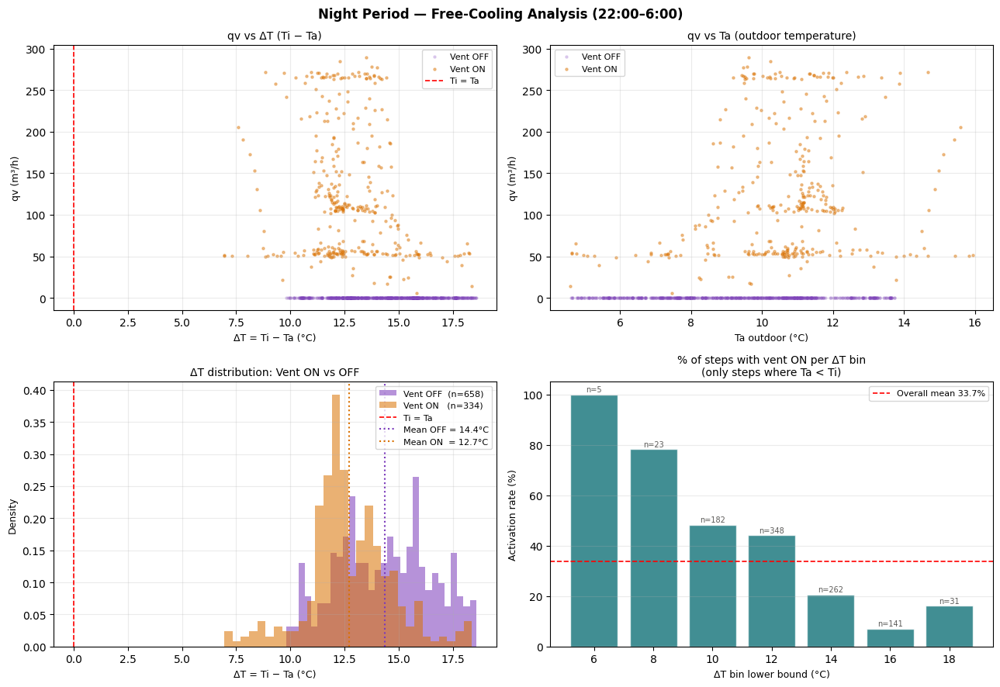

Saved: fig_night_freecooling.png


In [12]:
# ── NIGHT FREE-COOLING ANALYSIS ───────────────────────────────────────────────
night["dT"]     = night["Ti"] - night["Ta"]   # positive = free-cooling possible
night["vent_on"] = night["qv"] > 0

fig, axes = plt.subplots(2, 2, figsize=(13, 9))
fig.suptitle("Night Period — Free-Cooling Analysis (22:00–6:00)", fontweight="bold")

# ── Panel 1: qv vs ΔT (Ti − Ta) ──────────────────────────────────────────────
ax = axes[0, 0]
on  = night[night["vent_on"]]
off = night[~night["vent_on"]]
ax.scatter(off["dT"], off["qv"], c="#7a39bb", alpha=0.2, s=5, label="Vent OFF")
ax.scatter(on["dT"],  on["qv"],  c="#da7101", alpha=0.4, s=5, label="Vent ON")
ax.axvline(0, color="red", lw=1.2, ls="--", label="Ti = Ta")
ax.set_xlabel("ΔT = Ti − Ta (°C)", fontsize=9)
ax.set_ylabel("qv (m³/h)", fontsize=9)
ax.set_title("qv vs ΔT (Ti − Ta)", fontsize=10)
ax.legend(fontsize=8); ax.grid(alpha=0.25)

# ── Panel 2: qv vs Ta ─────────────────────────────────────────────────────────
ax = axes[0, 1]
ax.scatter(off["Ta"], off["qv"], c="#7a39bb", alpha=0.2, s=5, label="Vent OFF")
ax.scatter(on["Ta"],  on["qv"],  c="#da7101", alpha=0.4, s=5, label="Vent ON")
ax.set_xlabel("Ta outdoor (°C)", fontsize=9)
ax.set_ylabel("qv (m³/h)", fontsize=9)
ax.set_title("qv vs Ta (outdoor temperature)", fontsize=10)
ax.legend(fontsize=8); ax.grid(alpha=0.25)

# ── Panel 3: ΔT distribution — ON vs OFF ──────────────────────────────────────
ax = axes[1, 0]
ax.hist(off["dT"].dropna(), bins=30, color="#7a39bb", alpha=0.55,
        density=True, label=f"Vent OFF  (n={len(off)})")
ax.hist(on["dT"].dropna(),  bins=30, color="#da7101", alpha=0.55,
        density=True, label=f"Vent ON   (n={len(on)})")
ax.axvline(0, color="red", lw=1.2, ls="--", label="Ti = Ta")
ax.axvline(off["dT"].mean(), color="#7a39bb", lw=1.5, ls=":",
           label=f"Mean OFF = {off['dT'].mean():.1f}°C")
ax.axvline(on["dT"].mean(),  color="#da7101", lw=1.5, ls=":",
           label=f"Mean ON  = {on['dT'].mean():.1f}°C")
ax.set_xlabel("ΔT = Ti − Ta (°C)", fontsize=9)
ax.set_ylabel("Density", fontsize=9)
ax.set_title("ΔT distribution: Vent ON vs OFF", fontsize=10)
ax.legend(fontsize=8); ax.grid(alpha=0.25)

# ── Panel 4: Activation rate by ΔT bin ────────────────────────────────────────
ax = axes[1, 1]
bins   = np.arange(0, night["dT"].max() + 2, 2)   # 2°C bins above 0
labels = bins[:-1]
night_pos = night[night["dT"] > 0].copy()
night_pos["dT_bin"] = pd.cut(night_pos["dT"], bins=bins, labels=labels)
act_rate = night_pos.groupby("dT_bin", observed=True)["vent_on"].mean() * 100
counts   = night_pos.groupby("dT_bin", observed=True)["vent_on"].count()

bars = ax.bar(act_rate.index.astype(float), act_rate.values,
              width=1.6, color="#01696f", alpha=0.75, edgecolor="white")
ax.set_xlabel("ΔT bin lower bound (°C)", fontsize=9)
ax.set_ylabel("Activation rate (%)", fontsize=9)
ax.set_title("% of steps with vent ON per ΔT bin\n(only steps where Ta < Ti)", fontsize=10)
ax.axhline(NIGHT_ACT_FRAC * 100, color="red", lw=1.2, ls="--",
           label=f"Overall mean {NIGHT_ACT_FRAC*100:.1f}%")
for bar, cnt in zip(bars, counts.values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
            f"n={cnt}", ha="center", fontsize=7, color="#5a5957")
ax.legend(fontsize=8); ax.grid(alpha=0.25, axis="y")

fig.tight_layout()
fig.savefig("fig_night_freecooling.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: fig_night_freecooling.png")

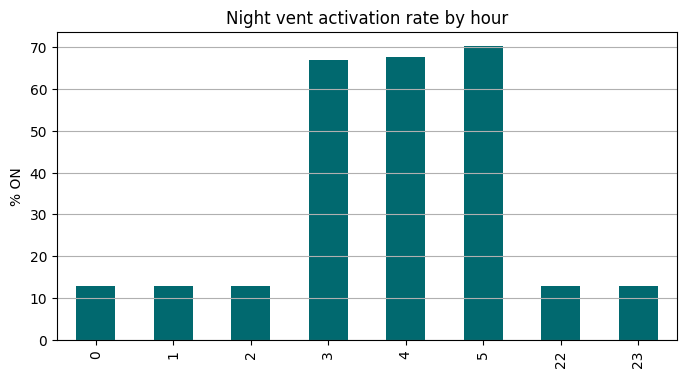

In [13]:
night_by_hour = night.groupby(night.index.hour)["vent_on"].mean() * 100
night_by_hour.plot(kind="bar", color="#01696f", figsize=(8,4))
plt.title("Night vent activation rate by hour"); plt.ylabel("% ON"); plt.grid(axis="y")
plt.show()

Night samples: 992
Night ON fraction: 0.337
Night active mean qv: 124.17

=== Night activation by hour ===
hour
0     12.9
1     12.9
2     12.9
3     66.9
4     67.7
5     70.2
22    12.9
23    12.9
Name: on_rate, dtype: float64

=== Night activation by weekday ===
weekday
0    46.1
1    53.1
2    46.1
3    42.5
4    45.0
5     0.0
6     6.2
Name: on_rate, dtype: float64

=== Night activation for Ta < Ti ===
Eligible fraction: 1.0
Activation rate when Ti > Ta: 0.337
Activation rate when Ti <= Ta: nan

=== Activation vs dT bins ===
                              on_rate  qv_on_mean  count
dT_bin                                                  
(6.9559999999999995, 11.416]    0.492     128.718    124
(11.416, 12.158]                0.597     133.854    124
(12.158, 12.783]                0.444     127.615    124
(12.783, 13.55]                 0.347     141.264    124
(13.55, 14.524]                 0.403     147.331    124
(14.524, 15.586]                0.226      76.272    124
(15.58

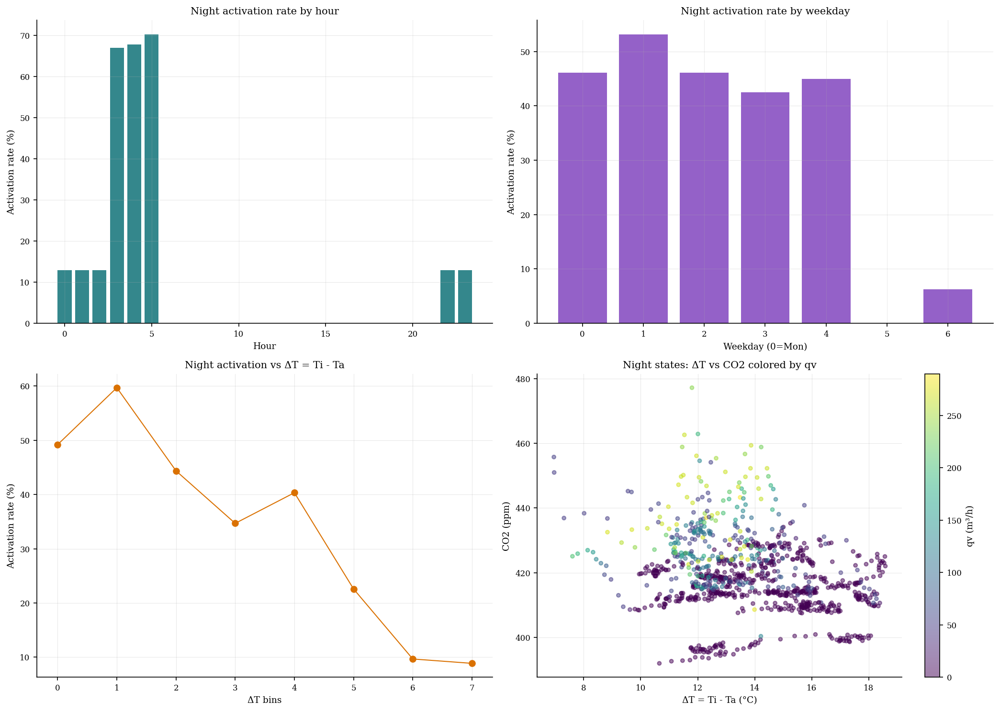

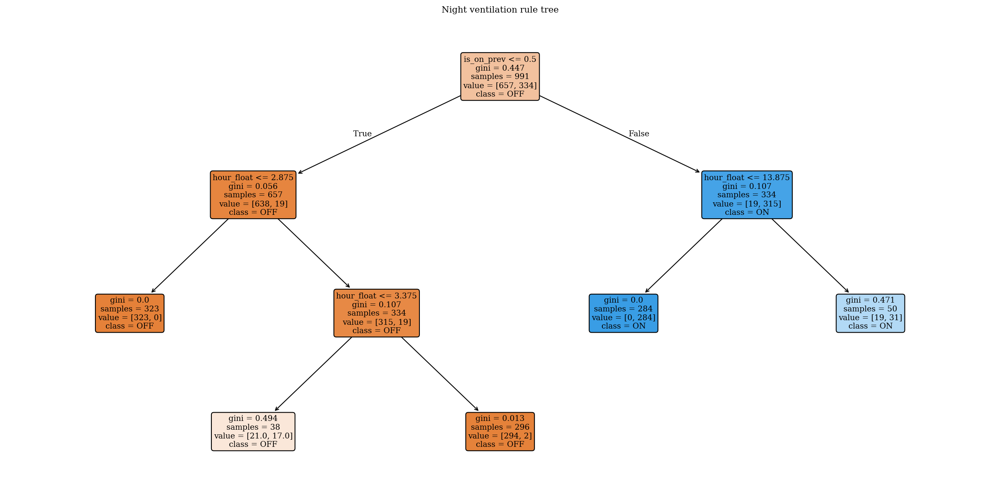


=== Suggested interpretation ===
- Check whether hour_float is the first split: that indicates a hidden sub-schedule.
- Check whether is_on_prev or qv_prev is important: that indicates persistence / hysteresis.
- Check whether dT is more important than CO2: that supports free-cooling logic.
- If weekday appears early, night control differs by weekday.
- If active-flow clusters are separated, night ventilation may have several discrete fan states.


In [33]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.cluster import KMeans

# ── CONFIG ─────────────────────────────────────────────────────────────
RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"
DAY_START_H = 6
DAY_END_H = 22
RANDOM_STATE = 42

# ── LOAD ───────────────────────────────────────────────────────────────
with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]]).sort_index()
y = pd.concat([saved["y_train"], saved["y_test"]]).sort_index()

data = pd.DataFrame({
    "qv":  X["qv"],
    "CO2": X["c"],
    "Ti":  y,
    "Ta":  X["Ta"],
}, index=X.index).copy()

data = data.dropna().copy()

# ── FEATURES ───────────────────────────────────────────────────────────
data["hour"] = data.index.hour
data["minute"] = data.index.minute
data["hour_float"] = data["hour"] + data["minute"] / 60
data["weekday"] = data.index.weekday
data["month"] = data.index.month
data["dT"] = data["Ti"] - data["Ta"]
data["is_day"] = ((data["hour_float"] >= DAY_START_H) & (data["hour_float"] < DAY_END_H)).astype(int)

# Night subset
night = data[data["is_day"] == 0].copy()
night["is_on"] = (night["qv"] > 0).astype(int)

# Lag features to detect persistence / hysteresis
night["qv_prev"] = night["qv"].shift(1)
night["is_on_prev"] = night["is_on"].shift(1)
night["CO2_prev"] = night["CO2"].shift(1)
night["dT_prev"] = night["dT"].shift(1)

# Keep a clean copy for lag-based modeling
night_model = night.dropna().copy()

print("Night samples:", len(night))
print("Night ON fraction:", round(night["is_on"].mean(), 3))
print("Night active mean qv:", round(night.loc[night["is_on"] == 1, "qv"].mean(), 2))

# ── 1) BASIC SUMMARIES ─────────────────────────────────────────────────
print("\n=== Night activation by hour ===")
hourly = night.groupby("hour").agg(
    on_rate=("is_on", "mean"),
    qv_mean=("qv", "mean"),
    qv_on_mean=("qv", lambda s: s[s > 0].mean() if (s > 0).any() else np.nan),
    count=("qv", "size")
)
print((100 * hourly["on_rate"]).round(1))

print("\n=== Night activation by weekday ===")
weekday_stats = night.groupby("weekday").agg(
    on_rate=("is_on", "mean"),
    qv_mean=("qv", "mean"),
    count=("qv", "size")
)
print((100 * weekday_stats["on_rate"]).round(1))

print("\n=== Night activation for Ta < Ti ===")
eligible = night["dT"] > 0
if eligible.any():
    print("Eligible fraction:", round(eligible.mean(), 3))
    print("Activation rate when Ti > Ta:", round(night.loc[eligible, "is_on"].mean(), 3))
    print("Activation rate when Ti <= Ta:", round(night.loc[~eligible, "is_on"].mean(), 3))

# ── 2) BINNED RULE DISCOVERY ──────────────────────────────────────────
def make_bins(series, q=8):
    try:
        return pd.qcut(series, q=q, duplicates="drop")
    except Exception:
        return pd.cut(series, bins=q)

print("\n=== Activation vs dT bins ===")
night["dT_bin"] = make_bins(night["dT"], q=8)
dt_table = night.groupby("dT_bin", observed=False).agg(
    on_rate=("is_on", "mean"),
    qv_on_mean=("qv", lambda s: s[s > 0].mean() if (s > 0).any() else np.nan),
    count=("qv", "size")
)
print(dt_table.round(3))

print("\n=== Activation vs CO2 bins ===")
night["CO2_bin"] = make_bins(night["CO2"], q=8)
co2_table = night.groupby("CO2_bin", observed=False).agg(
    on_rate=("is_on", "mean"),
    qv_on_mean=("qv", lambda s: s[s > 0].mean() if (s > 0).any() else np.nan),
    count=("qv", "size")
)
print(co2_table.round(3))

# ── 3) FLOW STATE DISCOVERY ────────────────────────────────────────────
active_q = night.loc[night["qv"] > 0, ["qv"]].copy()

if len(active_q) >= 10:
    km = KMeans(n_clusters=3, random_state=RANDOM_STATE, n_init=20)
    active_q["cluster"] = km.fit_predict(active_q[["qv"]])
    centers = np.sort(km.cluster_centers_.ravel())
    print("\n=== Active-flow clusters (candidate night states) ===")
    print(np.round(centers, 2))
else:
    print("\nNot enough active night points for clustering.")

# ── 4) PERSISTENCE / TRANSITIONS ───────────────────────────────────────
night_model["transition"] = night_model["is_on_prev"].astype(str) + "→" + night_model["is_on"].astype(str)
trans = night_model["transition"].value_counts(normalize=True).sort_index()
print("\n=== Transition probabilities ===")
print((100 * trans).round(1))

# Conditional activation rates
print("\n=== Activation rate conditional on previous state ===")
print("P(ON | prev ON)  =", round(night_model.loc[night_model["is_on_prev"] == 1, "is_on"].mean(), 3))
print("P(ON | prev OFF) =", round(night_model.loc[night_model["is_on_prev"] == 0, "is_on"].mean(), 3))

# ── 5) SIMPLE INTERPRETABLE TREE ───────────────────────────────────────
features = ["hour_float", "weekday", "month", "CO2", "Ti", "Ta", "dT", "is_on_prev", "qv_prev"]
X_cls = night_model[features]
y_cls = night_model["is_on"]

tree = DecisionTreeClassifier(
    max_depth=3,
    min_samples_leaf=30,
    random_state=RANDOM_STATE
)
tree.fit(X_cls, y_cls)

print("\n=== Decision tree rules for night activation ===")
print(export_text(tree, feature_names=features))

y_pred = tree.predict(X_cls)
print("\n=== Tree classification report ===")
print(classification_report(y_cls, y_pred, digits=3))

# ── 6) PLOTS ───────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Activation by hour
axes[0, 0].bar(hourly.index, 100 * hourly["on_rate"], color="#01696f", alpha=0.8)
axes[0, 0].set_title("Night activation rate by hour")
axes[0, 0].set_xlabel("Hour")
axes[0, 0].set_ylabel("Activation rate (%)")
axes[0, 0].grid(axis="y", alpha=0.3)

# Activation by weekday
axes[0, 1].bar(weekday_stats.index, 100 * weekday_stats["on_rate"], color="#7a39bb", alpha=0.8)
axes[0, 1].set_title("Night activation rate by weekday")
axes[0, 1].set_xlabel("Weekday (0=Mon)")
axes[0, 1].set_ylabel("Activation rate (%)")
axes[0, 1].grid(axis="y", alpha=0.3)

# Activation vs dT
dt_plot = dt_table.copy().reset_index()
axes[1, 0].plot(range(len(dt_plot)), 100 * dt_plot["on_rate"], marker="o", color="#da7101")
axes[1, 0].set_title("Night activation vs ΔT = Ti - Ta")
axes[1, 0].set_xlabel("ΔT bins")
axes[1, 0].set_ylabel("Activation rate (%)")
axes[1, 0].grid(alpha=0.3)

# Scatter: dT vs CO2 colored by qv
sc = axes[1, 1].scatter(
    night["dT"], night["CO2"],
    c=night["qv"], cmap="viridis", s=14, alpha=0.5
)
axes[1, 1].set_title("Night states: ΔT vs CO2 colored by qv")
axes[1, 1].set_xlabel("ΔT = Ti - Ta (°C)")
axes[1, 1].set_ylabel("CO2 (ppm)")
axes[1, 1].grid(alpha=0.3)
plt.colorbar(sc, ax=axes[1, 1], label="qv (m³/h)")

plt.tight_layout()
plt.show()

# Tree plot
plt.figure(figsize=(16, 8))
plot_tree(
    tree,
    feature_names=features,
    class_names=["OFF", "ON"],
    filled=True,
    rounded=True,
    fontsize=9
)
plt.title("Night ventilation rule tree")
plt.tight_layout()
plt.show()

# ── 7) SUGGESTED RULE SUMMARY ──────────────────────────────────────────
print("\n=== Suggested interpretation ===")
print("- Check whether hour_float is the first split: that indicates a hidden sub-schedule.")
print("- Check whether is_on_prev or qv_prev is important: that indicates persistence / hysteresis.")
print("- Check whether dT is more important than CO2: that supports free-cooling logic.")
print("- If weekday appears early, night control differs by weekday.")
print("- If active-flow clusters are separated, night ventilation may have several discrete fan states.")

Night samples: 992
Night mean qv: 41.81
Night median qv: 0.0
Night ON fraction: 0.337

=== BASELINE SCHEDULE SUMMARY ===
Baseline built from: median qv by weekday × hour
Mean baseline qv: 32.99
Mean extra qv: 16.36
Extra activation fraction: 0.155

=== CORRELATIONS WITH TOTAL NIGHT qv ===
qv ~ dT = Ti-Ta: Pearson r=-0.332, p=7.10e-27, Spearman ρ=-0.362
qv ~ CO2: Pearson r=0.608, p=2.91e-101, Spearman ρ=0.593
qv ~ Ti: Pearson r=-0.252, p=8.42e-16, Spearman ρ=-0.354
qv ~ Ta: Pearson r=0.270, p=4.29e-18, Spearman ρ=0.282

=== CORRELATIONS WITH EXTRA qv ABOVE BASELINE ===
qv_extra ~ dT = Ti-Ta: Pearson r=-0.243, p=8.00e-15, Spearman ρ=-0.331
qv_extra ~ CO2: Pearson r=0.342, p=1.31e-28, Spearman ρ=0.461
qv_extra ~ Ti: Pearson r=-0.106, p=8.41e-04, Spearman ρ=-0.160
qv_extra ~ Ta: Pearson r=0.214, p=8.89e-12, Spearman ρ=0.292

=== EXTRA ACTIVATION VS dT BINS ===
                                n  extra_on_rate  mean_extra_qv  \
bin                                                             

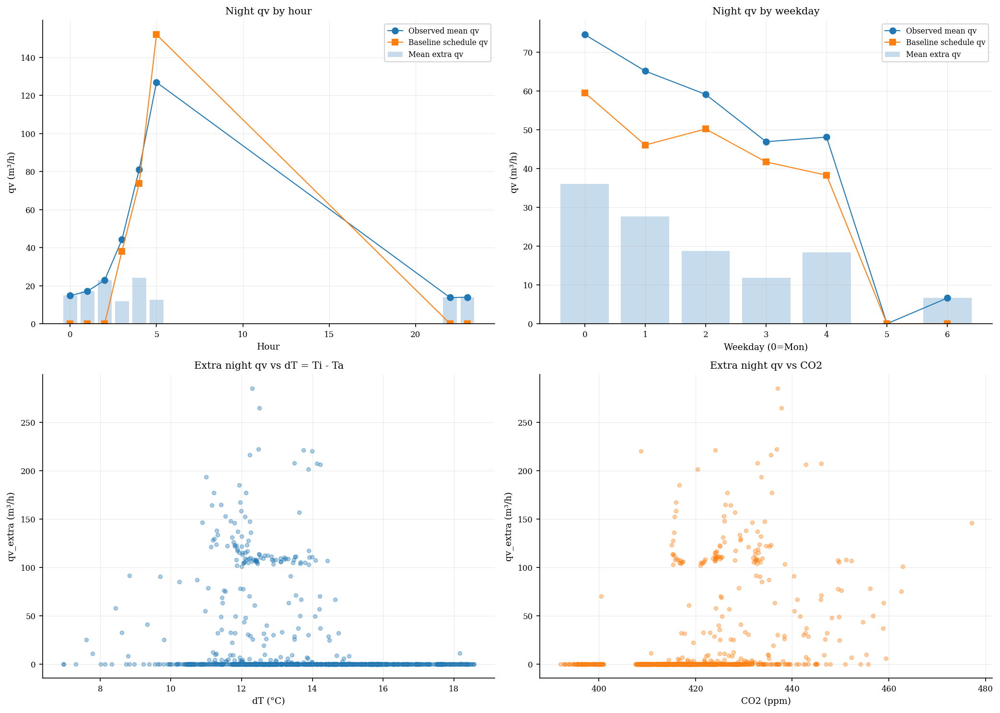


NIGHT CONTROL INTERPRETATION
Baseline rule:
- The baseline night schedule is strongest around hour 5:00 with baseline qv ≈ 152.0 m³/h.
- The weakest night baseline occurs around hour 0:00 with baseline qv ≈ 0.0 m³/h.
- By weekday, the strongest baseline is weekday 0 with qv ≈ 59.5 m³/h.
- The weakest baseline is weekday 5 with qv ≈ 0.0 m³/h.

Additional activation rule:
- Extra ventilation above the baseline is best approximated by:
    qv_extra ON if (Ti - Ta >= 17.00 °C) AND (CO2 >= 433.5 ppm)
- The best single-variable explanation is CO2 alone: qv_extra ON if CO2 >= 433.5 ppm.
- Rule agreement (simple two-variable rule): 0.852
- Rule agreement (best single-variable rule): 0.845

Suggested two-layer model:
1) Use weekday × hour baseline qv_base as the scheduled night flow.
2) Add qv_extra when the extra-activation rule is satisfied.


In [36]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr

# ── CONFIG ─────────────────────────────────────────────────────────────
RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"
DAY_START_H = 6
DAY_END_H = 22

# How to define the baseline schedule from observed qv
# "mean" = average qv by hour/weekday
# "median" = more robust
BASELINE_METHOD = "median"

# Additional activation threshold above baseline
EXTRA_ON_THRESHOLD = 20.0   # m³/h

# ── LOAD ───────────────────────────────────────────────────────────────
with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]]).sort_index()
y = pd.concat([saved["y_train"], saved["y_test"]]).sort_index()

data = pd.DataFrame({
    "qv":  X["qv"],
    "CO2": X["c"],
    "Ti":  y,
    "Ta":  X["Ta"],
}, index=X.index).dropna().copy()

# ── TIME FEATURES ──────────────────────────────────────────────────────
data["hour"] = data.index.hour
data["minute"] = data.index.minute
data["hour_float"] = data["hour"] + data["minute"] / 60.0
data["weekday"] = data.index.weekday   # Monday=0
data["month"] = data.index.month
data["dT"] = data["Ti"] - data["Ta"]

night = data[(data["hour_float"] < DAY_START_H) | (data["hour_float"] >= DAY_END_H)].copy()
night["is_on"] = (night["qv"] > 0).astype(int)

print("Night samples:", len(night))
print("Night mean qv:", round(night["qv"].mean(), 2))
print("Night median qv:", round(night["qv"].median(), 2))
print("Night ON fraction:", round(night["is_on"].mean(), 3))

# ── 1) BASELINE SCHEDULE RULE: hour × weekday -> baseline qv ──────────
agg_fun = "median" if BASELINE_METHOD == "median" else "mean"

baseline_table = (
    night.groupby(["weekday", "hour"])["qv"]
    .agg(agg_fun)
    .unstack("hour")
)

# Fill any missing cells with weekday median, then global night median
weekday_fill = night.groupby("weekday")["qv"].agg(agg_fun)
global_fill = night["qv"].agg(agg_fun)
baseline_table = baseline_table.apply(
    lambda row: row.fillna(weekday_fill.get(row.name, global_fill)),
    axis=1
).fillna(global_fill)

# Map baseline back to each row
night["qv_base"] = [
    baseline_table.loc[wd, hr] for wd, hr in zip(night["weekday"], night["hour"])
]

# Extra component
night["qv_extra"] = np.maximum(night["qv"] - night["qv_base"], 0.0)
night["extra_on"] = (night["qv_extra"] >= EXTRA_ON_THRESHOLD).astype(int)

print("\n=== BASELINE SCHEDULE SUMMARY ===")
print("Baseline built from:", BASELINE_METHOD, "qv by weekday × hour")
print("Mean baseline qv:", round(night["qv_base"].mean(), 2))
print("Mean extra qv:", round(night["qv_extra"].mean(), 2))
print("Extra activation fraction:", round(night["extra_on"].mean(), 3))

# ── 2) CORRELATE EXTRA FLOW WITH CONDITIONS ───────────────────────────
def safe_corr(x, y, namex, namey):
    ok = np.isfinite(x) & np.isfinite(y)
    x = np.asarray(x)[ok]
    y = np.asarray(y)[ok]
    if len(x) < 3 or np.std(x) == 0 or np.std(y) == 0:
        print(f"{namey} ~ {namex}: not enough variation")
        return
    r, p = pearsonr(x, y)
    rho = spearmanr(x, y).correlation
    print(f"{namey} ~ {namex}: Pearson r={r:.3f}, p={p:.2e}, Spearman ρ={rho:.3f}")

print("\n=== CORRELATIONS WITH TOTAL NIGHT qv ===")
safe_corr(night["dT"], night["qv"], "dT = Ti-Ta", "qv")
safe_corr(night["CO2"], night["qv"], "CO2", "qv")
safe_corr(night["Ti"], night["qv"], "Ti", "qv")
safe_corr(night["Ta"], night["qv"], "Ta", "qv")

print("\n=== CORRELATIONS WITH EXTRA qv ABOVE BASELINE ===")
safe_corr(night["dT"], night["qv_extra"], "dT = Ti-Ta", "qv_extra")
safe_corr(night["CO2"], night["qv_extra"], "CO2", "qv_extra")
safe_corr(night["Ti"], night["qv_extra"], "Ti", "qv_extra")
safe_corr(night["Ta"], night["qv_extra"], "Ta", "qv_extra")

# ── 3) BINNED RULE DISCOVERY FOR EXTRA ACTIVATION ─────────────────────
def qbin_table(df, col, q=8):
    tmp = df[[col, "qv_extra", "extra_on"]].dropna().copy()
    tmp["bin"] = pd.qcut(tmp[col], q=q, duplicates="drop")
    out = tmp.groupby("bin", observed=False).agg(
        n=("extra_on", "size"),
        extra_on_rate=("extra_on", "mean"),
        mean_extra_qv=("qv_extra", "mean"),
        median_extra_qv=("qv_extra", "median"),
    )
    return out

print("\n=== EXTRA ACTIVATION VS dT BINS ===")
dt_bins = qbin_table(night, "dT", q=8)
print(dt_bins.round(3))

print("\n=== EXTRA ACTIVATION VS CO2 BINS ===")
co2_bins = qbin_table(night, "CO2", q=8)
print(co2_bins.round(3))

# ── 4) SIMPLE RULE EXTRACTION ─────────────────────────────────────────
# Candidate thresholds chosen from quantiles
dt_candidates = np.unique(np.round(night["dT"].quantile(np.linspace(0.1, 0.9, 9)), 2))
co2_candidates = np.unique(np.round(night["CO2"].quantile(np.linspace(0.1, 0.9, 9)), 1))

best_rule = None
best_score = -np.inf

for dt_thr in dt_candidates:
    for co2_thr in co2_candidates:
        pred = ((night["dT"] >= dt_thr) & (night["CO2"] >= co2_thr)).astype(int)
        score = (pred == night["extra_on"]).mean()
        if score > best_score:
            best_score = score
            best_rule = ("AND", dt_thr, co2_thr, score)

        pred = ((night["dT"] >= dt_thr) | (night["CO2"] >= co2_thr)).astype(int)
        score = (pred == night["extra_on"]).mean()
        if score > best_score:
            best_score = score
            best_rule = ("OR", dt_thr, co2_thr, score)

print("\n=== BEST SIMPLE TWO-VARIABLE RULE FOR EXTRA ACTIVATION ===")
logic, dt_thr, co2_thr, score = best_rule
print(f"Rule type   : {logic}")
print(f"dT threshold: {dt_thr:.2f} °C")
print(f"CO2 threshold: {co2_thr:.1f} ppm")
print(f"Agreement with observed extra_on: {score:.3f}")

# Also check single-variable rules
best_single = None
best_single_score = -np.inf

for dt_thr in dt_candidates:
    pred = (night["dT"] >= dt_thr).astype(int)
    score = (pred == night["extra_on"]).mean()
    if score > best_single_score:
        best_single_score = score
        best_single = ("dT", dt_thr, score)

for co2_thr in co2_candidates:
    pred = (night["CO2"] >= co2_thr).astype(int)
    score = (pred == night["extra_on"]).mean()
    if score > best_single_score:
        best_single_score = score
        best_single = ("CO2", co2_thr, score)

print("\n=== BEST SINGLE-VARIABLE RULE FOR EXTRA ACTIVATION ===")
if best_single[0] == "dT":
    print(f"Rule: qv_extra ON if dT >= {best_single[1]:.2f} °C")
else:
    print(f"Rule: qv_extra ON if CO2 >= {best_single[1]:.1f} ppm")
print(f"Agreement with observed extra_on: {best_single[2]:.3f}")

# ── 5) SUMMARY TABLES ─────────────────────────────────────────────────
baseline_hour = night.groupby("hour").agg(
    qv_mean=("qv", "mean"),
    qv_median=("qv", "median"),
    qv_base_mean=("qv_base", "mean"),
    qv_extra_mean=("qv_extra", "mean"),
    on_rate=("is_on", "mean"),
    extra_on_rate=("extra_on", "mean"),
)
baseline_weekday = night.groupby("weekday").agg(
    qv_mean=("qv", "mean"),
    qv_median=("qv", "median"),
    qv_base_mean=("qv_base", "mean"),
    qv_extra_mean=("qv_extra", "mean"),
    on_rate=("is_on", "mean"),
    extra_on_rate=("extra_on", "mean"),
)

print("\n=== NIGHT qv BY HOUR ===")
print(baseline_hour.round(2))

print("\n=== NIGHT qv BY WEEKDAY ===")
print(baseline_weekday.round(2))

# ── 6) PLOTS ──────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Mean qv by hour: measured vs baseline vs extra
axes[0, 0].plot(baseline_hour.index, baseline_hour["qv_mean"], marker="o", label="Observed mean qv")
axes[0, 0].plot(baseline_hour.index, baseline_hour["qv_base_mean"], marker="s", label="Baseline schedule qv")
axes[0, 0].bar(baseline_hour.index, baseline_hour["qv_extra_mean"], alpha=0.25, label="Mean extra qv")
axes[0, 0].set_title("Night qv by hour")
axes[0, 0].set_xlabel("Hour")
axes[0, 0].set_ylabel("qv (m³/h)")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].legend()

# Mean qv by weekday
axes[0, 1].plot(baseline_weekday.index, baseline_weekday["qv_mean"], marker="o", label="Observed mean qv")
axes[0, 1].plot(baseline_weekday.index, baseline_weekday["qv_base_mean"], marker="s", label="Baseline schedule qv")
axes[0, 1].bar(baseline_weekday.index, baseline_weekday["qv_extra_mean"], alpha=0.25, label="Mean extra qv")
axes[0, 1].set_title("Night qv by weekday")
axes[0, 1].set_xlabel("Weekday (0=Mon)")
axes[0, 1].set_ylabel("qv (m³/h)")
axes[0, 1].grid(alpha=0.3)
axes[0, 1].legend()

# Extra qv vs dT
axes[1, 0].scatter(night["dT"], night["qv_extra"], s=14, alpha=0.35)
axes[1, 0].set_title("Extra night qv vs dT = Ti - Ta")
axes[1, 0].set_xlabel("dT (°C)")
axes[1, 0].set_ylabel("qv_extra (m³/h)")
axes[1, 0].grid(alpha=0.3)

# Extra qv vs CO2
axes[1, 1].scatter(night["CO2"], night["qv_extra"], s=14, alpha=0.35, color="tab:orange")
axes[1, 1].set_title("Extra night qv vs CO2")
axes[1, 1].set_xlabel("CO2 (ppm)")
axes[1, 1].set_ylabel("qv_extra (m³/h)")
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# ── 7) SIMPLE TEXT INTERPRETATION ─────────────────────────────────────
print("\n" + "=" * 70)
print("NIGHT CONTROL INTERPRETATION")
print("=" * 70)

best_hour = baseline_hour["qv_base_mean"].idxmax()
best_hour_val = baseline_hour.loc[best_hour, "qv_base_mean"]
worst_hour = baseline_hour["qv_base_mean"].idxmin()
worst_hour_val = baseline_hour.loc[worst_hour, "qv_base_mean"]

best_wd = baseline_weekday["qv_base_mean"].idxmax()
best_wd_val = baseline_weekday.loc[best_wd, "qv_base_mean"]
worst_wd = baseline_weekday["qv_base_mean"].idxmin()
worst_wd_val = baseline_weekday.loc[worst_wd, "qv_base_mean"]

print(f"Baseline rule:")
print(f"- The baseline night schedule is strongest around hour {best_hour}:00 "
      f"with baseline qv ≈ {best_hour_val:.1f} m³/h.")
print(f"- The weakest night baseline occurs around hour {worst_hour}:00 "
      f"with baseline qv ≈ {worst_hour_val:.1f} m³/h.")
print(f"- By weekday, the strongest baseline is weekday {best_wd} "
      f"with qv ≈ {best_wd_val:.1f} m³/h.")
print(f"- The weakest baseline is weekday {worst_wd} "
      f"with qv ≈ {worst_wd_val:.1f} m³/h.")

print("\nAdditional activation rule:")
if logic == "AND":
    print(f"- Extra ventilation above the baseline is best approximated by:")
    print(f"    qv_extra ON if (Ti - Ta >= {dt_thr:.2f} °C) AND (CO2 >= {co2_thr:.1f} ppm)")
else:
    print(f"- Extra ventilation above the baseline is best approximated by:")
    print(f"    qv_extra ON if (Ti - Ta >= {dt_thr:.2f} °C) OR (CO2 >= {co2_thr:.1f} ppm)")

if best_single[0] == "dT":
    print(f"- The best single-variable explanation is dT alone: "
          f"qv_extra ON if dT >= {best_single[1]:.2f} °C.")
else:
    print(f"- The best single-variable explanation is CO2 alone: "
          f"qv_extra ON if CO2 >= {best_single[1]:.1f} ppm.")

print(f"- Rule agreement (simple two-variable rule): {best_score:.3f}")
print(f"- Rule agreement (best single-variable rule): {best_single[2]:.3f}")

print("\nSuggested two-layer model:")
print("1) Use weekday × hour baseline qv_base as the scheduled night flow.")
print("2) Add qv_extra when the extra-activation rule is satisfied.")

Night samples: 992
Extra activation fraction: 0.155
Mean qv extra: 16.36

=== Correlations with qv_extra ===
   feature  pearson_r  p_value  spearman_rho
   qv_prev      0.655    0.000         0.810
       dTi     -0.501    0.000        -0.472
       CO2      0.342    0.000         0.462
  CO2_prev      0.333    0.000         0.447
        dT     -0.243    0.000        -0.331
   dT_prev     -0.229    0.000        -0.299
        Ta      0.215    0.000         0.292
   weekday     -0.237    0.000        -0.274
      dCO2      0.105    0.001         0.184
        Ti     -0.105    0.001        -0.160
       dTa      0.049    0.122         0.131
hour_float     -0.032    0.313         0.041

=== Binned qv_extra vs qv_prev ===
                    count   mean  median
bin                                     
(-0.001, 53.232]      743   0.44    0.00
(53.232, 115.207]     124  46.39    8.59
(115.207, 285.236]    124  81.90   75.74

=== Binned qv_extra vs dTi ===
                     count   mean

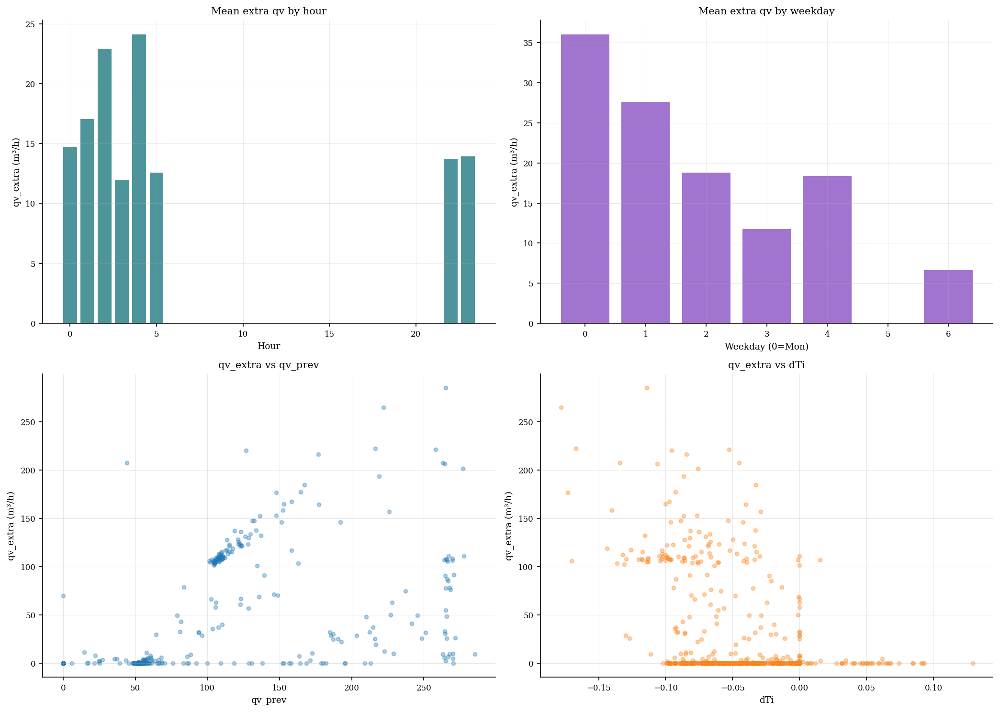


LIKELY REASONS FOR EXTRA NIGHT VENTILATION
Top predictors of whether extra ventilation appears:
1. qv_prev
2. dTi
3. CO2
4. CO2_prev
5. dT

Top predictors of how large the extra ventilation is:
1. qv_prev
2. hour_float
3. Ti
4. dTi
5. Ta

Interpretation guide:
- If hour_float / weekday rank highest, extra flow is still schedule-driven.
- If dT or Ta rank highest, extra flow is likely thermal/free-cooling driven.
- If CO2 or CO2_prev rank highest, extra flow may be occupancy/air-quality related.
- If qv_prev ranks highest, extra flow may be persistence/hysteresis.
- If month ranks high, the rule changes seasonally.


In [37]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import classification_report, r2_score

# ── CONFIG ─────────────────────────────────────────────────────────────
RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"
DAY_START_H = 6
DAY_END_H = 22

BASELINE_METHOD = "median"      # "mean" or "median"
EXTRA_ON_THRESHOLD = 20.0       # m³/h
RANDOM_STATE = 42

# ── LOAD ───────────────────────────────────────────────────────────────
with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]]).sort_index()
y = pd.concat([saved["y_train"], saved["y_test"]]).sort_index()

data = pd.DataFrame({
    "qv":  X["qv"],
    "CO2": X["c"],
    "Ti":  y,
    "Ta":  X["Ta"],
}, index=X.index).dropna().copy()

# ── TIME FEATURES ──────────────────────────────────────────────────────
data["hour"] = data.index.hour
data["minute"] = data.index.minute
data["hour_float"] = data["hour"] + data["minute"] / 60.0
data["weekday"] = data.index.weekday
data["month"] = data.index.month
data["dT"] = data["Ti"] - data["Ta"]
data["dCO2"] = data["CO2"].diff()
data["dTi"] = data["Ti"].diff()
data["dTa"] = data["Ta"].diff()
data["qv_prev"] = data["qv"].shift(1)
data["CO2_prev"] = data["CO2"].shift(1)
data["dT_prev"] = data["dT"].shift(1)

night = data[(data["hour_float"] < DAY_START_H) | (data["hour_float"] >= DAY_END_H)].copy()
night["is_on"] = (night["qv"] > 0).astype(int)

# ── BASELINE SCHEDULE ──────────────────────────────────────────────────
agg_fun = "median" if BASELINE_METHOD == "median" else "mean"

baseline_table = (
    night.groupby(["weekday", "hour"])["qv"]
    .agg(agg_fun)
    .unstack("hour")
)

weekday_fill = night.groupby("weekday")["qv"].agg(agg_fun)
global_fill = night["qv"].agg(agg_fun)

baseline_table = baseline_table.apply(
    lambda row: row.fillna(weekday_fill.get(row.name, global_fill)),
    axis=1
).fillna(global_fill)

night["qv_base"] = [
    baseline_table.loc[wd, hr] for wd, hr in zip(night["weekday"], night["hour"])
]

night["qv_extra"] = np.maximum(night["qv"] - night["qv_base"], 0.0)
night["extra_on"] = (night["qv_extra"] >= EXTRA_ON_THRESHOLD).astype(int)

# Keep rows with lags for feature analysis
night_model = night.dropna().copy()

print("Night samples:", len(night))
print("Extra activation fraction:", round(night["extra_on"].mean(), 3))
print("Mean qv extra:", round(night["qv_extra"].mean(), 2))

# ── HELPER FUNCTIONS ───────────────────────────────────────────────────
def safe_corr(x, y, xname, yname):
    ok = np.isfinite(x) & np.isfinite(y)
    x = np.asarray(x)[ok]
    y = np.asarray(y)[ok]
    if len(x) < 3 or np.std(x) == 0 or np.std(y) == 0:
        return None
    r, p = pearsonr(x, y)
    rho = spearmanr(x, y).correlation
    return [xname, r, p, rho]

def qbin_summary(df, col, target_col, q=8):
    tmp = df[[col, target_col]].dropna().copy()
    tmp["bin"] = pd.qcut(tmp[col], q=q, duplicates="drop")
    out = tmp.groupby("bin", observed=False)[target_col].agg(["count", "mean", "median"])
    return out

# ── 1) CORRELATION SCREENING ───────────────────────────────────────────
candidate_cols = [
    "hour_float", "weekday", "month",
    "CO2", "Ti", "Ta", "dT",
    "dCO2", "dTi", "dTa",
    "qv_prev", "CO2_prev", "dT_prev"
]

corr_rows = []
for col in candidate_cols:
    res = safe_corr(night_model[col], night_model["qv_extra"], col, "qv_extra")
    if res is not None:
        corr_rows.append(res)

corr_df = pd.DataFrame(corr_rows, columns=["feature", "pearson_r", "p_value", "spearman_rho"])
corr_df["abs_spearman"] = corr_df["spearman_rho"].abs()
corr_df = corr_df.sort_values("abs_spearman", ascending=False)

print("\n=== Correlations with qv_extra ===")
print(corr_df[["feature", "pearson_r", "p_value", "spearman_rho"]].round(3).to_string(index=False))

# ── 2) BINNED SUMMARIES FOR TOP CANDIDATES ─────────────────────────────
top_features = corr_df["feature"].head(4).tolist()

for feat in top_features:
    print(f"\n=== Binned qv_extra vs {feat} ===")
    try:
        print(qbin_summary(night_model, feat, "qv_extra", q=8).round(2))
    except Exception as e:
        print(f"Could not bin {feat}: {e}")

# ── 3) CLASSIFICATION: what predicts extra activation? ────────────────
X_cls = night_model[candidate_cols].copy()
y_cls = night_model["extra_on"].copy()

clf = RandomForestClassifier(
    n_estimators=300,
    max_depth=5,
    min_samples_leaf=20,
    random_state=RANDOM_STATE
)
clf.fit(X_cls, y_cls)

feat_imp_cls = pd.DataFrame({
    "feature": candidate_cols,
    "importance": clf.feature_importances_
}).sort_values("importance", ascending=False)

print("\n=== Feature importance for EXTRA activation (ON/OFF) ===")
print(feat_imp_cls.round(3).to_string(index=False))

y_pred_cls = clf.predict(X_cls)
print("\n=== Classification report for extra_on ===")
print(classification_report(y_cls, y_pred_cls, digits=3))

# ── 4) REGRESSION: what predicts size of extra qv? ────────────────────
active_extra = night_model[night_model["qv_extra"] > 0].copy()

if len(active_extra) > 20:
    X_reg = active_extra[candidate_cols].copy()
    y_reg = active_extra["qv_extra"].copy()

    reg = RandomForestRegressor(
        n_estimators=300,
        max_depth=5,
        min_samples_leaf=10,
        random_state=RANDOM_STATE
    )
    reg.fit(X_reg, y_reg)
    y_pred_reg = reg.predict(X_reg)

    feat_imp_reg = pd.DataFrame({
        "feature": candidate_cols,
        "importance": reg.feature_importances_
    }).sort_values("importance", ascending=False)

    print("\n=== Feature importance for EXTRA qv size ===")
    print(feat_imp_reg.round(3).to_string(index=False))
    print("\nR² for extra qv size model:", round(r2_score(y_reg, y_pred_reg), 3))
else:
    feat_imp_reg = None
    print("\nNot enough active extra points for extra-qv regression.")

# ── 5) PLOTS ───────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Top-left: qv_extra by hour
hour_extra = night.groupby("hour").agg(
    mean_extra=("qv_extra", "mean"),
    med_extra=("qv_extra", "median"),
    extra_on_rate=("extra_on", "mean")
)
axes[0, 0].bar(hour_extra.index, hour_extra["mean_extra"], alpha=0.7, color="#01696f")
axes[0, 0].set_title("Mean extra qv by hour")
axes[0, 0].set_xlabel("Hour")
axes[0, 0].set_ylabel("qv_extra (m³/h)")
axes[0, 0].grid(axis="y", alpha=0.3)

# Top-right: qv_extra by weekday
wd_extra = night.groupby("weekday").agg(
    mean_extra=("qv_extra", "mean"),
    med_extra=("qv_extra", "median"),
    extra_on_rate=("extra_on", "mean")
)
axes[0, 1].bar(wd_extra.index, wd_extra["mean_extra"], alpha=0.7, color="#7a39bb")
axes[0, 1].set_title("Mean extra qv by weekday")
axes[0, 1].set_xlabel("Weekday (0=Mon)")
axes[0, 1].set_ylabel("qv_extra (m³/h)")
axes[0, 1].grid(axis="y", alpha=0.3)

# Bottom-left: top candidate vs extra qv
feat1 = top_features[0] if len(top_features) > 0 else "dT"
axes[1, 0].scatter(night_model[feat1], night_model["qv_extra"], s=14, alpha=0.35)
axes[1, 0].set_title(f"qv_extra vs {feat1}")
axes[1, 0].set_xlabel(feat1)
axes[1, 0].set_ylabel("qv_extra (m³/h)")
axes[1, 0].grid(alpha=0.3)

# Bottom-right: second candidate vs extra qv
feat2 = top_features[1] if len(top_features) > 1 else "CO2"
axes[1, 1].scatter(night_model[feat2], night_model["qv_extra"], s=14, alpha=0.35, color="tab:orange")
axes[1, 1].set_title(f"qv_extra vs {feat2}")
axes[1, 1].set_xlabel(feat2)
axes[1, 1].set_ylabel("qv_extra (m³/h)")
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# ── 6) SIMPLE TEXT SUMMARY ─────────────────────────────────────────────
print("\n" + "="*72)
print("LIKELY REASONS FOR EXTRA NIGHT VENTILATION")
print("="*72)

top_cls = feat_imp_cls.head(5)["feature"].tolist()
print("Top predictors of whether extra ventilation appears:")
for i, f in enumerate(top_cls, 1):
    print(f"{i}. {f}")

if feat_imp_reg is not None:
    top_reg = feat_imp_reg.head(5)["feature"].tolist()
    print("\nTop predictors of how large the extra ventilation is:")
    for i, f in enumerate(top_reg, 1):
        print(f"{i}. {f}")

print("\nInterpretation guide:")
print("- If hour_float / weekday rank highest, extra flow is still schedule-driven.")
print("- If dT or Ta rank highest, extra flow is likely thermal/free-cooling driven.")
print("- If CO2 or CO2_prev rank highest, extra flow may be occupancy/air-quality related.")
print("- If qv_prev ranks highest, extra flow may be persistence/hysteresis.")
print("- If month ranks high, the rule changes seasonally.")

=== Stable schedule baseline ===
R²  = 0.449
MAE = 23.90 m³/h
Mean |residual| = 23.90 m³/h
Residual active fraction = 0.243

=== Residual correlations ===
   feature  pearson_r  p_value  spearman_rho
        Ta      0.175    0.000         0.231
        dT     -0.164    0.000        -0.220
       CO2      0.122    0.000         0.196
   weekday     -0.082    0.010        -0.089
        Ti      0.077    0.015         0.077
hour_float      0.023    0.464        -0.013
     month        NaN      NaN           NaN

=== Hourly comparison ===
      measured_qv  schedule_qv  mean_residual  mean_abs_residual
hour                                                            
0           14.72         0.00          14.72              14.72
1           17.03         0.00          17.03              17.03
2           22.91         0.00          22.91              22.91
3           44.21        38.10           6.11              17.75
4           81.04        73.78           7.26              40.94
5  

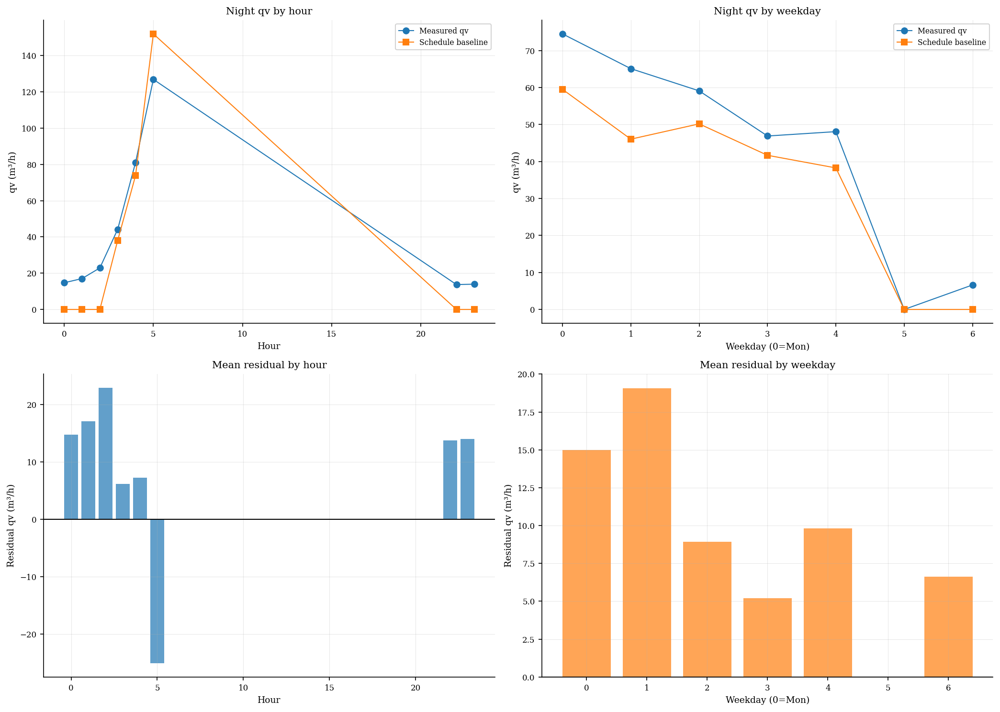


=== Interpretation ===
The direct schedule lookup gives R² = 0.449 and MAE = 23.90 m³/h.
If this is clearly better than before, then most night ventilation is schedule-driven.
Any remaining residual can then be tested against CO2 and dT as a possible secondary rule.


In [40]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_absolute_error
from scipy.stats import pearsonr, spearmanr

# ── CONFIG ─────────────────────────────────────────────────────────────
RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"
DAY_START_H = 6
DAY_END_H = 22
USE_MONTH = True
AGG = "median"   # "mean" or "median"
RESIDUAL_THRESHOLD = 20.0

# ── LOAD ───────────────────────────────────────────────────────────────
with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]]).sort_index()
y = pd.concat([saved["y_train"], saved["y_test"]]).sort_index()

data = pd.DataFrame({
    "qv":  X["qv"],
    "CO2": X["c"],
    "Ti":  y,
    "Ta":  X["Ta"],
}, index=X.index).dropna().copy()

# ── FEATURES ───────────────────────────────────────────────────────────
data["hour"] = data.index.hour
data["minute"] = data.index.minute
data["hour_float"] = data["hour"] + data["minute"] / 60.0
data["weekday"] = data.index.weekday
data["month"] = data.index.month
data["dT"] = data["Ti"] - data["Ta"]

night = data[(data["hour_float"] < DAY_START_H) | (data["hour_float"] >= DAY_END_H)].copy()

# ── STABLE DIRECT LOOKUP BASELINE ─────────────────────────────────────
def agg_series(df, keys):
    return df.groupby(keys)["qv"].agg(AGG)

if USE_MONTH:
    tbl_main = agg_series(night, ["month", "weekday", "hour"])
else:
    tbl_main = agg_series(night, ["weekday", "hour"])

tbl_wh = agg_series(night, ["weekday", "hour"])
tbl_mh = agg_series(night, ["month", "hour"])
tbl_h  = agg_series(night, ["hour"])
tbl_w  = agg_series(night, ["weekday"])
tbl_m  = agg_series(night, ["month"])
tbl_g  = night["qv"].agg(AGG)

def lookup_schedule(row):
    m = row["month"]
    w = row["weekday"]
    h = row["hour"]

    if USE_MONTH and (m, w, h) in tbl_main.index:
        return tbl_main.loc[(m, w, h)]
    if (w, h) in tbl_wh.index:
        return tbl_wh.loc[(w, h)]
    if (m, h) in tbl_mh.index:
        return tbl_mh.loc[(m, h)]
    if h in tbl_h.index:
        return tbl_h.loc[h]
    if w in tbl_w.index:
        return tbl_w.loc[w]
    if m in tbl_m.index:
        return tbl_m.loc[m]
    return tbl_g

night["qv_sched"] = night.apply(lookup_schedule, axis=1)

# Residuals
night["qv_resid"] = night["qv"] - night["qv_sched"]
night["qv_resid_abs"] = night["qv_resid"].abs()
night["resid_on"] = (night["qv_resid_abs"] >= RESIDUAL_THRESHOLD).astype(int)

# ── METRICS ────────────────────────────────────────────────────────────
r2 = r2_score(night["qv"], night["qv_sched"])
mae = mean_absolute_error(night["qv"], night["qv_sched"])

print("=== Stable schedule baseline ===")
print(f"R²  = {r2:.3f}")
print(f"MAE = {mae:.2f} m³/h")
print(f"Mean |residual| = {night['qv_resid_abs'].mean():.2f} m³/h")
print(f"Residual active fraction = {night['resid_on'].mean():.3f}")

# ── CORRELATIONS OF RESIDUAL ───────────────────────────────────────────
def safe_corr(x, y):
    ok = np.isfinite(x) & np.isfinite(y)
    x = np.asarray(x)[ok]
    y = np.asarray(y)[ok]
    if len(x) < 3 or np.std(x) == 0 or np.std(y) == 0:
        return np.nan, np.nan, np.nan
    r, p = pearsonr(x, y)
    rho = spearmanr(x, y).correlation
    return r, p, rho

rows = []
for col in ["CO2", "Ti", "Ta", "dT", "hour_float", "weekday", "month"]:
    r, p, rho = safe_corr(night[col], night["qv_resid"])
    rows.append([col, r, p, rho])

corr_df = pd.DataFrame(rows, columns=["feature", "pearson_r", "p_value", "spearman_rho"])
corr_df["abs_spearman"] = corr_df["spearman_rho"].abs()
corr_df = corr_df.sort_values("abs_spearman", ascending=False)

print("\n=== Residual correlations ===")
print(corr_df[["feature", "pearson_r", "p_value", "spearman_rho"]].round(3).to_string(index=False))

# ── TABLES FOR PRESENTATION ────────────────────────────────────────────
hourly = night.groupby("hour").agg(
    measured_qv=("qv", "mean"),
    schedule_qv=("qv_sched", "mean"),
    mean_residual=("qv_resid", "mean"),
    mean_abs_residual=("qv_resid_abs", "mean")
)

weekday = night.groupby("weekday").agg(
    measured_qv=("qv", "mean"),
    schedule_qv=("qv_sched", "mean"),
    mean_residual=("qv_resid", "mean"),
    mean_abs_residual=("qv_resid_abs", "mean")
)

print("\n=== Hourly comparison ===")
print(hourly.round(2).to_string())

print("\n=== Weekday comparison ===")
print(weekday.round(2).to_string())

# ── PLOTS ──────────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

axes[0, 0].plot(hourly.index, hourly["measured_qv"], marker="o", label="Measured qv")
axes[0, 0].plot(hourly.index, hourly["schedule_qv"], marker="s", label="Schedule baseline")
axes[0, 0].set_title("Night qv by hour")
axes[0, 0].set_xlabel("Hour")
axes[0, 0].set_ylabel("qv (m³/h)")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].legend()

axes[0, 1].plot(weekday.index, weekday["measured_qv"], marker="o", label="Measured qv")
axes[0, 1].plot(weekday.index, weekday["schedule_qv"], marker="s", label="Schedule baseline")
axes[0, 1].set_title("Night qv by weekday")
axes[0, 1].set_xlabel("Weekday (0=Mon)")
axes[0, 1].set_ylabel("qv (m³/h)")
axes[0, 1].grid(alpha=0.3)
axes[0, 1].legend()

axes[1, 0].bar(hourly.index, hourly["mean_residual"], alpha=0.7)
axes[1, 0].axhline(0, color="k", lw=1)
axes[1, 0].set_title("Mean residual by hour")
axes[1, 0].set_xlabel("Hour")
axes[1, 0].set_ylabel("Residual qv (m³/h)")
axes[1, 0].grid(alpha=0.3)

axes[1, 1].bar(weekday.index, weekday["mean_residual"], alpha=0.7, color="tab:orange")
axes[1, 1].axhline(0, color="k", lw=1)
axes[1, 1].set_title("Mean residual by weekday")
axes[1, 1].set_xlabel("Weekday (0=Mon)")
axes[1, 1].set_ylabel("Residual qv (m³/h)")
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n=== Interpretation ===")
print(f"The direct schedule lookup gives R² = {r2:.3f} and MAE = {mae:.2f} m³/h.")
print("If this is clearly better than before, then most night ventilation is schedule-driven.")
print("Any remaining residual can then be tested against CO2 and dT as a possible secondary rule.")

=== Night-window comparison ===
 start_h  stop_h  n_samples    r2    mae  mean_abs_resid  resid_active_frac  mean_qv  mean_sched
      20       8       1488 0.675 21.692          21.692              0.216   55.695      52.143
      20       7       1364 0.564 22.187          22.187              0.217   44.945      40.325
      22       7       1116 0.551 25.785          25.785              0.251   53.600      49.286
      21       7       1240 0.551 24.406          24.406              0.239   49.439      44.358
      20       6       1240 0.461 20.323          20.323              0.207   34.645      26.389
      23       6        868 0.455 25.361          25.361              0.259   45.821      37.698
      22       6        992 0.449 23.905          23.905              0.243   41.808      32.986
      21       6       1116 0.445 22.581          22.581              0.230   38.495      29.321
      23       5        744 0.264 21.214          21.214              0.212   32.307      18.64

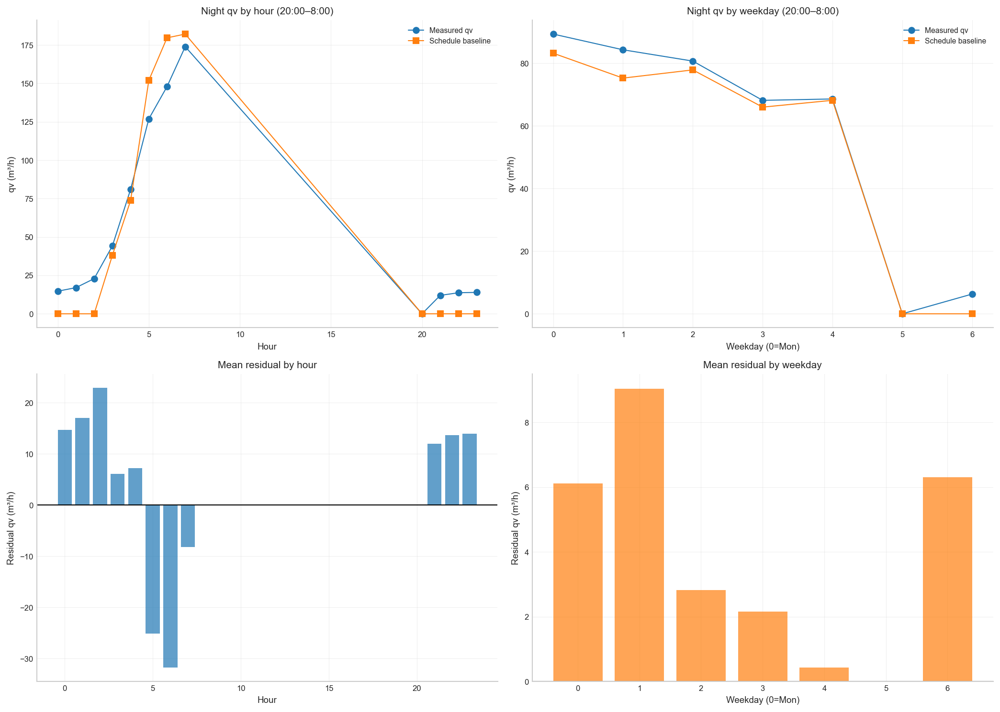

In [42]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_absolute_error

# ── CONFIG ─────────────────────────────────────────────────────────────
RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"
USE_MONTH = True
AGG = "median"   # "mean" or "median"
RESIDUAL_THRESHOLD = 20.0

# Candidate night windows: (start_hour, stop_hour)
# Means: night = hour >= start OR hour < stop
CANDIDATE_WINDOWS = [
    (22, 6),
    (22, 7),
    (21, 6),
    (21, 7),
    (20, 6),
    (20, 7),
    (20, 8),
    (23, 6),
    (23, 5),
]

# ── LOAD ───────────────────────────────────────────────────────────────
with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]]).sort_index()
y = pd.concat([saved["y_train"], saved["y_test"]]).sort_index()

data = pd.DataFrame({
    "qv":  X["qv"],
    "CO2": X["c"],
    "Ti":  y,
    "Ta":  X["Ta"],
}, index=X.index).dropna().copy()

# ── FEATURES ───────────────────────────────────────────────────────────
data["hour"] = data.index.hour
data["minute"] = data.index.minute
data["hour_float"] = data["hour"] + data["minute"] / 60.0
data["weekday"] = data.index.weekday
data["month"] = data.index.month
data["dT"] = data["Ti"] - data["Ta"]

def get_night_subset(df, start_h, stop_h):
    return df[(df["hour_float"] >= start_h) | (df["hour_float"] < stop_h)].copy()

def agg_series(df, keys, agg="median"):
    return df.groupby(keys)["qv"].agg(agg)

def build_schedule_and_score(night_df, use_month=True, agg="median", residual_threshold=20.0):
    if len(night_df) < 10:
        return None, None, None, None

    if use_month:
        tbl_main = agg_series(night_df, ["month", "weekday", "hour"], agg)
    else:
        tbl_main = agg_series(night_df, ["weekday", "hour"], agg)

    tbl_wh = agg_series(night_df, ["weekday", "hour"], agg)
    tbl_mh = agg_series(night_df, ["month", "hour"], agg)
    tbl_h  = agg_series(night_df, ["hour"], agg)
    tbl_w  = agg_series(night_df, ["weekday"], agg)
    tbl_m  = agg_series(night_df, ["month"], agg)
    tbl_g  = night_df["qv"].agg(agg)

    def lookup_schedule(row):
        m = row["month"]
        w = row["weekday"]
        h = row["hour"]

        if use_month and (m, w, h) in tbl_main.index:
            return tbl_main.loc[(m, w, h)]
        if (w, h) in tbl_wh.index:
            return tbl_wh.loc[(w, h)]
        if (m, h) in tbl_mh.index:
            return tbl_mh.loc[(m, h)]
        if h in tbl_h.index:
            return tbl_h.loc[h]
        if w in tbl_w.index:
            return tbl_w.loc[w]
        if m in tbl_m.index:
            return tbl_m.loc[m]
        return tbl_g

    out = night_df.copy()
    out["qv_sched"] = out.apply(lookup_schedule, axis=1)
    out["qv_resid"] = out["qv"] - out["qv_sched"]
    out["qv_resid_abs"] = out["qv_resid"].abs()
    out["resid_on"] = (out["qv_resid_abs"] >= residual_threshold).astype(int)

    metrics = {
        "n_samples": len(out),
        "r2": r2_score(out["qv"], out["qv_sched"]),
        "mae": mean_absolute_error(out["qv"], out["qv_sched"]),
        "mean_abs_resid": out["qv_resid_abs"].mean(),
        "resid_active_frac": out["resid_on"].mean(),
        "mean_qv": out["qv"].mean(),
        "mean_sched": out["qv_sched"].mean(),
    }

    return out, metrics, tbl_main, tbl_wh

# ── RUN ALL WINDOWS ────────────────────────────────────────────────────
results = []

for start_h, stop_h in CANDIDATE_WINDOWS:
    night = get_night_subset(data, start_h, stop_h)
    out, metrics, _, _ = build_schedule_and_score(
        night_df=night,
        use_month=USE_MONTH,
        agg=AGG,
        residual_threshold=RESIDUAL_THRESHOLD
    )
    if metrics is not None:
        results.append({
            "start_h": start_h,
            "stop_h": stop_h,
            **metrics
        })

results_df = pd.DataFrame(results)

# Sort: best R² first, then lower MAE
results_df = results_df.sort_values(
    by=["r2", "mae"],
    ascending=[False, True]
).reset_index(drop=True)

print("=== Night-window comparison ===")
print(results_df.round(3).to_string(index=False))

# ── BEST WINDOW ────────────────────────────────────────────────────────
best_start = int(results_df.loc[0, "start_h"])
best_stop = int(results_df.loc[0, "stop_h"])

print("\n=== Best window ===")
print(f"Night start: {best_start}:00")
print(f"Night stop : {best_stop}:00")

best_night = get_night_subset(data, best_start, best_stop)
best_out, best_metrics, _, _ = build_schedule_and_score(
    night_df=best_night,
    use_month=USE_MONTH,
    agg=AGG,
    residual_threshold=RESIDUAL_THRESHOLD
)

print(f"R²               = {best_metrics['r2']:.3f}")
print(f"MAE              = {best_metrics['mae']:.2f} m³/h")
print(f"Mean |residual|  = {best_metrics['mean_abs_resid']:.2f} m³/h")
print(f"Residual active  = {best_metrics['resid_active_frac']:.3f}")

# ── PRESENTATION TABLES FOR BEST WINDOW ────────────────────────────────
hourly = best_out.groupby("hour").agg(
    measured_qv=("qv", "mean"),
    schedule_qv=("qv_sched", "mean"),
    mean_residual=("qv_resid", "mean"),
    mean_abs_residual=("qv_resid_abs", "mean")
)

weekday = best_out.groupby("weekday").agg(
    measured_qv=("qv", "mean"),
    schedule_qv=("qv_sched", "mean"),
    mean_residual=("qv_resid", "mean"),
    mean_abs_residual=("qv_resid_abs", "mean")
)

print("\n=== Hourly comparison for best window ===")
print(hourly.round(2).to_string())

print("\n=== Weekday comparison for best window ===")
print(weekday.round(2).to_string())

# ── PLOTS FOR BEST WINDOW ──────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

axes[0, 0].plot(hourly.index, hourly["measured_qv"], marker="o", label="Measured qv")
axes[0, 0].plot(hourly.index, hourly["schedule_qv"], marker="s", label="Schedule baseline")
axes[0, 0].set_title(f"Night qv by hour ({best_start}:00–{best_stop}:00)")
axes[0, 0].set_xlabel("Hour")
axes[0, 0].set_ylabel("qv (m³/h)")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].legend()

axes[0, 1].plot(weekday.index, weekday["measured_qv"], marker="o", label="Measured qv")
axes[0, 1].plot(weekday.index, weekday["schedule_qv"], marker="s", label="Schedule baseline")
axes[0, 1].set_title(f"Night qv by weekday ({best_start}:00–{best_stop}:00)")
axes[0, 1].set_xlabel("Weekday (0=Mon)")
axes[0, 1].set_ylabel("qv (m³/h)")
axes[0, 1].grid(alpha=0.3)
axes[0, 1].legend()

axes[1, 0].bar(hourly.index, hourly["mean_residual"], alpha=0.7)
axes[1, 0].axhline(0, color="k", lw=1)
axes[1, 0].set_title("Mean residual by hour")
axes[1, 0].set_xlabel("Hour")
axes[1, 0].set_ylabel("Residual qv (m³/h)")
axes[1, 0].grid(alpha=0.3)

axes[1, 1].bar(weekday.index, weekday["mean_residual"], alpha=0.7, color="tab:orange")
axes[1, 1].axhline(0, color="k", lw=1)
axes[1, 1].set_title("Mean residual by weekday")
axes[1, 1].set_xlabel("Weekday (0=Mon)")
axes[1, 1].set_ylabel("Residual qv (m³/h)")
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

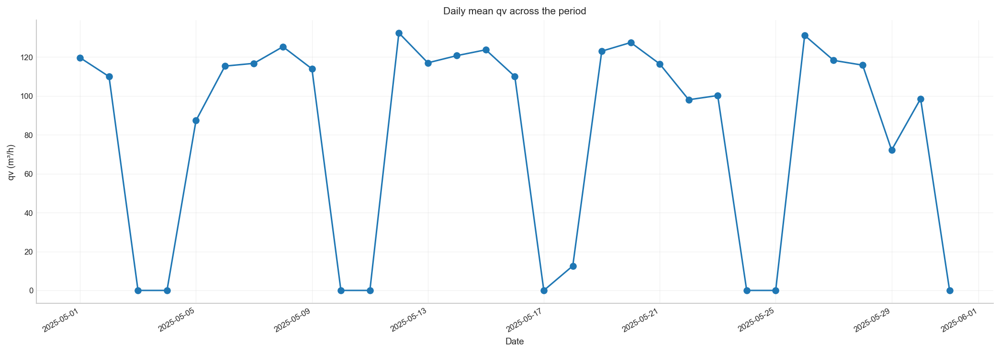

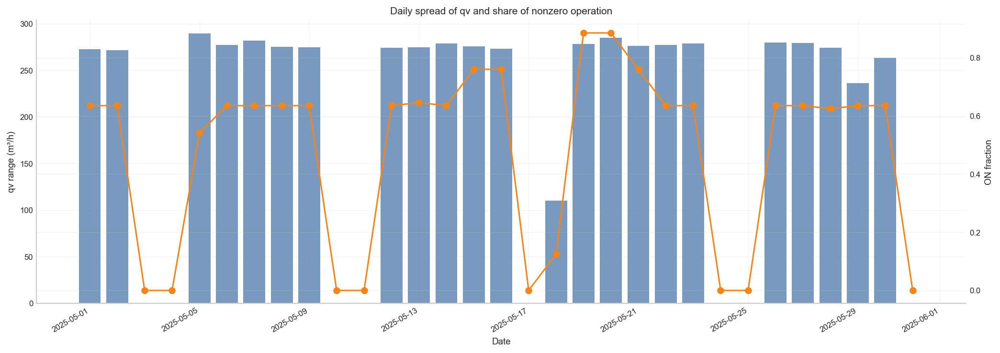

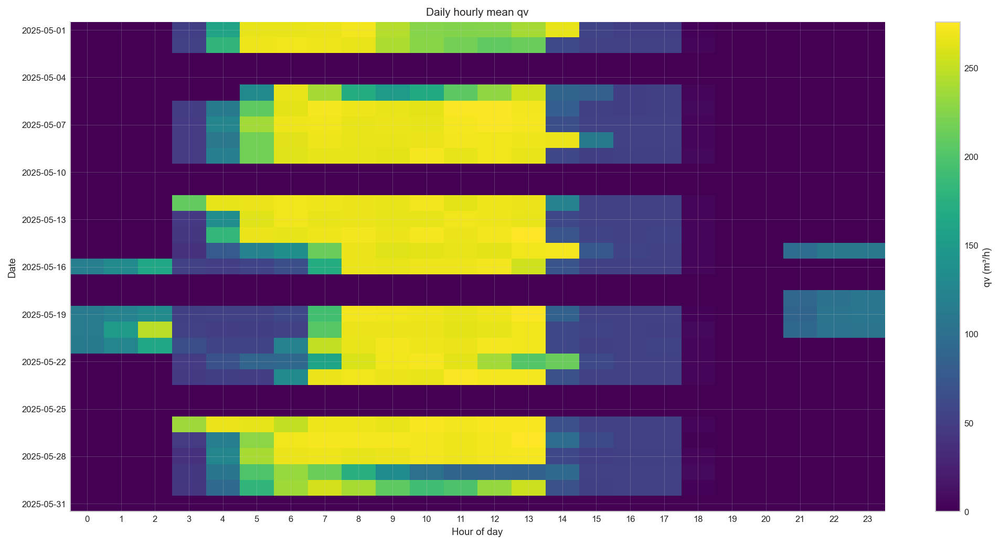

                     date  qv_mean  qv_min  qv_max  qv_median  qv_std  qv_range  qv_on_frac  CO2_mean  Ti_mean  Ta_mean
2025-05-01 00:00:00+00:00   119.62     0.0  272.59      54.17  116.88    272.59        0.64    424.33    24.05    15.49
2025-05-02 00:00:00+00:00   109.92     0.0  271.89      53.45  111.76    271.89        0.64    419.49    23.71    13.30
2025-05-03 00:00:00+00:00     0.00     0.0    0.00       0.00    0.00      0.00        0.00    402.73    23.72     9.28
2025-05-04 00:00:00+00:00     0.00     0.0    0.00       0.00    0.00      0.00        0.00    406.33    23.69     8.41
2025-05-05 00:00:00+00:00    87.31     0.0  289.59      51.75  100.19    289.59        0.54    477.28    23.86     9.32
2025-05-06 00:00:00+00:00   115.31     0.0  277.65      51.93  119.05    277.65        0.64    487.52    24.15    10.74
2025-05-07 00:00:00+00:00   116.73     0.0  282.26      54.71  120.56    282.26        0.64    465.87    23.81    12.05
2025-05-08 00:00:00+00:00   125.27     0

In [43]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"

with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]]).sort_index()
y = pd.concat([saved["y_train"], saved["y_test"]]).sort_index()

df = pd.DataFrame({
    "qv": X["qv"],
    "CO2": X["c"],
    "Ti": y,
    "Ta": X["Ta"],
}, index=X.index).dropna().copy()

df["date"] = df.index.normalize()
df["hour"] = df.index.hour
df["hour_float"] = df["hour"] + df.index.minute / 60.0

daily = df.groupby("date").agg(
    qv_mean=("qv", "mean"),
    qv_min=("qv", "min"),
    qv_max=("qv", "max"),
    qv_median=("qv", "median"),
    qv_std=("qv", "std"),
    qv_range=("qv", lambda s: s.max() - s.min()),
    qv_on_frac=("qv", lambda s: (s > 0).mean()),
    CO2_mean=("CO2", "mean"),
    Ti_mean=("Ti", "mean"),
    Ta_mean=("Ta", "mean")
).reset_index()

daily_hour = df.groupby(["date", "hour"]).agg(
    qv_mean=("qv", "mean"),
    qv_min=("qv", "min"),
    qv_max=("qv", "max"),
    qv_median=("qv", "median")
).reset_index()

outdir = Path("output")
outdir.mkdir(exist_ok=True)

daily.to_csv(outdir / "daily_qv_summary.csv", index=False)
daily_hour.to_csv(outdir / "daily_hourly_qv_summary.csv", index=False)

# 1) Daily mean qv
fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(daily["date"], daily["qv_mean"], marker="o", linewidth=1.5)
ax.set_title("Daily mean qv across the period")
ax.set_xlabel("Date")
ax.set_ylabel("qv (m³/h)")
ax.grid(alpha=0.3)
fig.autofmt_xdate()
fig.tight_layout()
fig.savefig(outdir / "daily_mean_qv.png", dpi=200, bbox_inches="tight")
plt.show()

# 2) Daily range + ON fraction
fig, ax1 = plt.subplots(figsize=(14, 5))
ax1.bar(daily["date"], daily["qv_range"], color="#4C78A8", alpha=0.75, label="Daily qv range")
ax1.set_ylabel("qv range (m³/h)")
ax1.set_xlabel("Date")
ax1.grid(alpha=0.25)

ax2 = ax1.twinx()
ax2.plot(daily["date"], daily["qv_on_frac"], color="#F58518", marker="o", linewidth=1.5, label="ON fraction")
ax2.set_ylabel("ON fraction")

ax1.set_title("Daily spread of qv and share of nonzero operation")
fig.autofmt_xdate()
fig.tight_layout()
fig.savefig(outdir / "daily_range_on_fraction.png", dpi=200, bbox_inches="tight")
plt.show()

# 3) Daily hourly heatmap
pivot = daily_hour.pivot(index="date", columns="hour", values="qv_mean").sort_index()

fig, ax = plt.subplots(figsize=(14, 7))
im = ax.imshow(pivot.values, aspect="auto", interpolation="nearest", cmap="viridis")
ax.set_title("Daily hourly mean qv")
ax.set_xlabel("Hour of day")
ax.set_ylabel("Date")

ax.set_xticks(range(len(pivot.columns)))
ax.set_xticklabels(pivot.columns)

step = max(1, len(pivot.index) // 10)
ax.set_yticks(range(0, len(pivot.index), step))
ax.set_yticklabels([pd.to_datetime(d).strftime("%Y-%m-%d") for d in pivot.index[::step]])

fig.colorbar(im, ax=ax, label="qv (m³/h)")
fig.tight_layout()
fig.savefig(outdir / "daily_hourly_qv_heatmap.png", dpi=200, bbox_inches="tight")
plt.show()

print(daily.head(10).round(2).to_string(index=False))

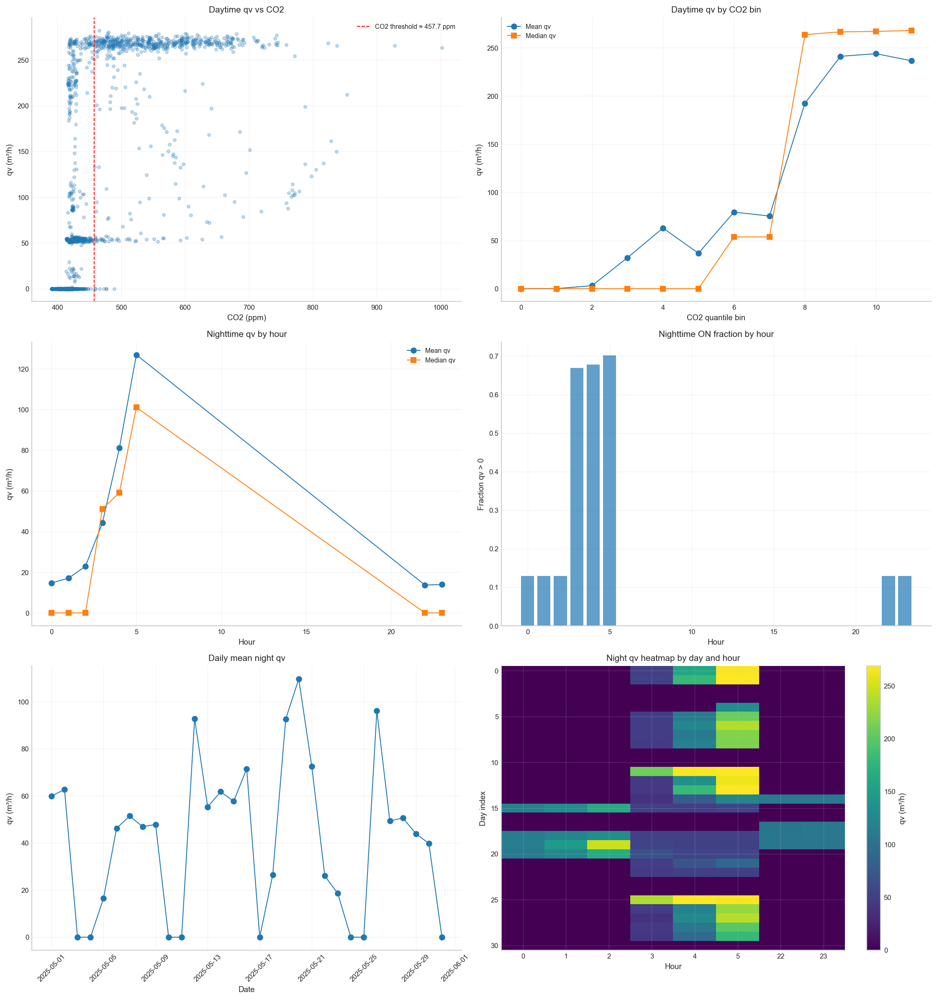


DAYTIME CONTROL
Day ON fraction           : 0.552
Estimated CO2 threshold   : 457.7 ppm
Mean qv when ON (day)     : 181.8 m³/h

Daytime correlations with qv:
  CO2         Pearson r =  0.656   Spearman rho =  0.809
  Ti          Pearson r = -0.405   Spearman rho = -0.380
  Ta          Pearson r =  0.297   Spearman rho =  0.365
  dT          Pearson r = -0.394   Spearman rho = -0.440
  hour_float  Pearson r = -0.586   Spearman rho = -0.529

CO2-binned daytime qv:
                               count    mean  median
bin                                                 
(390.59000000000003, 402.552]    166    0.00    0.00
(402.552, 409.89]                165    0.00    0.00
(409.89, 414.982]                165    3.06    0.00
(414.982, 418.188]               166   32.11    0.00
(418.188, 420.875]               165   62.91    0.00
(420.875, 424.21]                165   36.73    0.00
(424.21, 428.985]                165   79.48   53.65
(428.985, 444.0]                 166   75.39   53.68
(4

In [44]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
from sklearn.metrics import r2_score

# ── CONFIG ─────────────────────────────────────────────────────────────
RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"
DAY_START_H = 6
DAY_END_H = 22
CO2_BINS = 12
RESIDUAL_THRESHOLD = 20.0

# ── LOAD ───────────────────────────────────────────────────────────────
with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]]).sort_index()
y = pd.concat([saved["y_train"], saved["y_test"]]).sort_index()

df = pd.DataFrame({
    "qv":  X["qv"],
    "CO2": X["c"],
    "Ti":  y,
    "Ta":  X["Ta"],
}, index=X.index).dropna().copy()

# ── FEATURES ───────────────────────────────────────────────────────────
df["hour"] = df.index.hour
df["minute"] = df.index.minute
df["hour_float"] = df["hour"] + df["minute"] / 60.0
df["weekday"] = df.index.weekday
df["month"] = df.index.month
df["date"] = df.index.normalize()
df["dT"] = df["Ti"] - df["Ta"]

day = df[(df["hour_float"] >= DAY_START_H) & (df["hour_float"] < DAY_END_H)].copy()
night = df[(df["hour_float"] < DAY_START_H) | (df["hour_float"] >= DAY_END_H)].copy()

# ── DAY ANALYSIS ───────────────────────────────────────────────────────
day["qv_on"] = (day["qv"] > 0).astype(int)

co2_on = day.loc[day["qv"] > 0, "CO2"]
co2_off = day.loc[day["qv"] == 0, "CO2"]

if len(co2_on) > 0 and len(co2_off) > 0:
    co2_sp = 0.5 * (co2_on.mean() + co2_off.mean())
else:
    co2_sp = np.nan

qv_day_on_mean = day.loc[day["qv"] > 0, "qv"].mean() if (day["qv"] > 0).any() else np.nan
day_on_frac = (day["qv"] > 0).mean()

# Correlations
def safe_corr(x, y):
    ok = np.isfinite(x) & np.isfinite(y)
    x = np.asarray(x)[ok]
    y = np.asarray(y)[ok]
    if len(x) < 3 or np.std(x) == 0 or np.std(y) == 0:
        return np.nan, np.nan, np.nan
    r, p = pearsonr(x, y)
    rho = spearmanr(x, y).correlation
    return r, p, rho

day_corr = {}
for col in ["CO2", "Ti", "Ta", "dT", "hour_float"]:
    day_corr[col] = safe_corr(day[col], day["qv"])

# CO2 bins
day_co2_bins = day[["CO2", "qv"]].dropna().copy()
day_co2_bins["bin"] = pd.qcut(day_co2_bins["CO2"], q=CO2_BINS, duplicates="drop")
co2_binned = day_co2_bins.groupby("bin", observed=False)["qv"].agg(["count", "mean", "median"])

# ── NIGHT ANALYSIS ─────────────────────────────────────────────────────
night["qv_on"] = (night["qv"] > 0).astype(int)

# Hourly schedule pattern
night_hourly = night.groupby("hour").agg(
    qv_mean=("qv", "mean"),
    qv_median=("qv", "median"),
    on_frac=("qv_on", "mean"),
    qv_max=("qv", "max")
)

night_weekday = night.groupby("weekday").agg(
    qv_mean=("qv", "mean"),
    qv_median=("qv", "median"),
    on_frac=("qv_on", "mean")
)

# Daily night behavior
night_daily = night.groupby("date").agg(
    qv_mean=("qv", "mean"),
    qv_median=("qv", "median"),
    qv_max=("qv", "max"),
    qv_min=("qv", "min"),
    qv_range=("qv", lambda s: s.max() - s.min()),
    on_frac=("qv_on", "mean"),
    CO2_mean=("CO2", "mean"),
    Ti_mean=("Ti", "mean"),
    Ta_mean=("Ta", "mean"),
    dT_mean=("dT", "mean")
).reset_index()

# Day classification
def classify_day(row):
    if row["on_frac"] < 0.1:
        return "Mostly off"
    elif row["on_frac"] < 0.5:
        return "Partly active"
    else:
        return "Strongly active"

night_daily["day_type"] = night_daily.apply(classify_day, axis=1)

daytype_counts = night_daily["day_type"].value_counts()

# Hourly heatmap input
night_hour_heat = night.groupby(["date", "hour"])["qv"].mean().unstack("hour")

# Night correlations
night_corr = {}
for col in ["CO2", "Ti", "Ta", "dT", "hour_float", "weekday"]:
    night_corr[col] = safe_corr(night[col], night["qv"])

# ── PLOTS ──────────────────────────────────────────────────────────────
fig, axes = plt.subplots(3, 2, figsize=(15, 16))

# 1. Day qv vs CO2
axes[0, 0].scatter(day["CO2"], day["qv"], alpha=0.25, s=12)
if np.isfinite(co2_sp):
    axes[0, 0].axvline(co2_sp, color="red", linestyle="--", label=f"CO2 threshold ≈ {co2_sp:.1f} ppm")
axes[0, 0].set_title("Daytime qv vs CO2")
axes[0, 0].set_xlabel("CO2 (ppm)")
axes[0, 0].set_ylabel("qv (m³/h)")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].legend()

# 2. Day CO2-binned qv
bin_centers = range(len(co2_binned))
axes[0, 1].plot(bin_centers, co2_binned["mean"], marker="o", label="Mean qv")
axes[0, 1].plot(bin_centers, co2_binned["median"], marker="s", label="Median qv")
axes[0, 1].set_title("Daytime qv by CO2 bin")
axes[0, 1].set_xlabel("CO2 quantile bin")
axes[0, 1].set_ylabel("qv (m³/h)")
axes[0, 1].grid(alpha=0.3)
axes[0, 1].legend()

# 3. Night qv by hour
axes[1, 0].plot(night_hourly.index, night_hourly["qv_mean"], marker="o", label="Mean qv")
axes[1, 0].plot(night_hourly.index, night_hourly["qv_median"], marker="s", label="Median qv")
axes[1, 0].set_title("Nighttime qv by hour")
axes[1, 0].set_xlabel("Hour")
axes[1, 0].set_ylabel("qv (m³/h)")
axes[1, 0].grid(alpha=0.3)
axes[1, 0].legend()

# 4. Night activation rate by hour
axes[1, 1].bar(night_hourly.index, night_hourly["on_frac"], alpha=0.7)
axes[1, 1].set_title("Nighttime ON fraction by hour")
axes[1, 1].set_xlabel("Hour")
axes[1, 1].set_ylabel("Fraction qv > 0")
axes[1, 1].grid(alpha=0.3)

# 5. Daily mean night qv
axes[2, 0].plot(night_daily["date"], night_daily["qv_mean"], marker="o")
axes[2, 0].set_title("Daily mean night qv")
axes[2, 0].set_xlabel("Date")
axes[2, 0].set_ylabel("qv (m³/h)")
axes[2, 0].grid(alpha=0.3)
axes[2, 0].tick_params(axis="x", rotation=45)

# 6. Night daily heatmap
im = axes[2, 1].imshow(night_hour_heat.fillna(0).values, aspect="auto", interpolation="nearest", cmap="viridis")
axes[2, 1].set_title("Night qv heatmap by day and hour")
axes[2, 1].set_xlabel("Hour")
axes[2, 1].set_ylabel("Day index")
axes[2, 1].set_xticks(range(len(night_hour_heat.columns)))
axes[2, 1].set_xticklabels(night_hour_heat.columns)
fig.colorbar(im, ax=axes[2, 1], label="qv (m³/h)")

plt.tight_layout()
plt.show()

# ── TABLES ─────────────────────────────────────────────────────────────
print("\n" + "="*72)
print("DAYTIME CONTROL")
print("="*72)
print(f"Day ON fraction           : {day_on_frac:.3f}")
print(f"Estimated CO2 threshold   : {co2_sp:.1f} ppm")
print(f"Mean qv when ON (day)     : {qv_day_on_mean:.1f} m³/h")

print("\nDaytime correlations with qv:")
for k, (r, p, rho) in day_corr.items():
    print(f"  {k:10s}  Pearson r = {r:6.3f}   Spearman rho = {rho:6.3f}")

print("\nCO2-binned daytime qv:")
print(co2_binned.round(2).to_string())

print("\n" + "="*72)
print("NIGHTTIME CONTROL")
print("="*72)
print("Night qv by hour:")
print(night_hourly.round(2).to_string())

print("\nNight qv by weekday:")
print(night_weekday.round(2).to_string())

print("\nNight day-type counts:")
print(daytype_counts.to_string())

print("\nNighttime correlations with qv:")
for k, (r, p, rho) in night_corr.items():
    print(f"  {k:10s}  Pearson r = {r:6.3f}   Spearman rho = {rho:6.3f}")

# ── SHORT FINAL INTERPRETATION ─────────────────────────────────────────
print("\n" + "="*72)
print("SHORT INTERPRETATION")
print("="*72)

print("Daytime:")
if np.isfinite(co2_sp):
    print(f"- During the day, ventilation is mainly controlled by CO2,")
    print(f"  with an apparent switching threshold around {co2_sp:.1f} ppm.")
    print(f"- When active, the daytime flow is about {qv_day_on_mean:.1f} m³/h.")
else:
    print("- During the day, the dominant control could not be reduced to a clear CO2 threshold.")

print("\nNighttime:")
print("- During the night, ventilation is mainly schedule-based rather than continuously temperature-driven.")
print("- The hourly pattern and daily heatmap show that some nights are strongly active while others are mostly off.")
print("- This suggests a scheduled purge-type control with day-to-day activation differences,")
print("  possibly combined with a secondary condition such as temperature or another hidden BMS rule.")

## Setup

In [14]:
# ════════════════════════════════════════════════════════════════════════════
#  SETUP — Shared parameters, constants, and initial conditions
#  Run this cell once before any scenario / analysis / optimisation block
# ════════════════════════════════════════════════════════════════════════════

# ── Model fitted parameters ───────────────────────────────────────────────────
fitted_params = model.result.params          # lmfit / statsmodels params object

# ── Time index (derived from training data) ───────────────────────────────────
index   = X_train.index                      # DatetimeIndex shared by all blocks
dt_h    = (index[1] - index[0]).seconds / 3600.0   # timestep in hours

# ── Initial conditions (taken from the first training step) ───────────────────
Ti_init = float(y_train.iloc[0])             # Indoor air temperature  [°C]
Tm_init = float(train_results.var['Tm'][0])  # Thermal mass temperature [°C]
c_init  = float(train_results.var['c'][0])   # CO₂ concentration        [ppm]
N_hist  = train_results.var['N']             # Estimated occupancy series

# ── Ventilation flow bounds ───────────────────────────────────────────────────
QV_MIN  = 0.0      # m³/h — lower bound (fan off)
QV_MAX = 270.0    # m³/h — your room valve max (confirmed)

# ── Energy cost parameters ─────────────────────────────────────────────────
# SFP measured in-situ from AHU data (September 2025, 5-min intervals)
# Night operating point (22h–06h): AHU at ~XXXX m³/h → SFP interpolated from bin medians
SFP     = SFP_night   # W/(m³/h) — replace hardcoded 0.511 with your printed value
P_ELEC  = 1.493       # DKK/kWh

# ── Quick sanity check ────────────────────────────────────────────────────────
print(f"Index range   : {index[0]}  →  {index[-1]}")
print(f"Timestep      : {dt_h:.4f} h  ({dt_h*60:.1f} min)")
print(f"Ti_init       : {Ti_init:.2f} °C")
print(f"Tm_init       : {Tm_init:.2f} °C")
print(f"c_init        : {c_init:.1f} ppm")
print(f"QV bounds     : [{QV_MIN}, {QV_MAX}] m³/h")
print(f"SFP / P_ELEC  : {SFP} W/(m³/h)  /  {P_ELEC} DKK/kWh")

Index range   : 2025-05-01 00:00:00+00:00  →  2025-05-25 18:45:00+00:00
Timestep      : 0.2500 h  (15.0 min)
Ti_init       : 24.30 °C
Tm_init       : 24.30 °C
c_init        : 422.8 ppm
QV bounds     : [0.0, 270.0] m³/h
SFP / P_ELEC  : 0.4925204771389813 W/(m³/h)  /  1.493 DKK/kWh


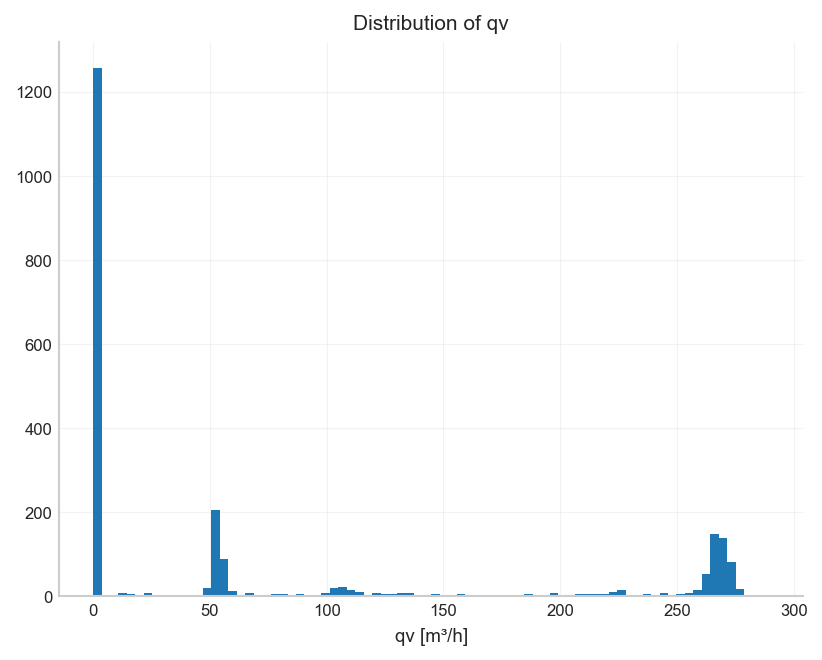

In [45]:
import matplotlib.pyplot as plt
import numpy as np

qv = np.asarray(X_train['qv'])
plt.hist(qv, bins=80)
plt.xlabel('qv [m³/h]')
plt.title('Distribution of qv')
plt.show()

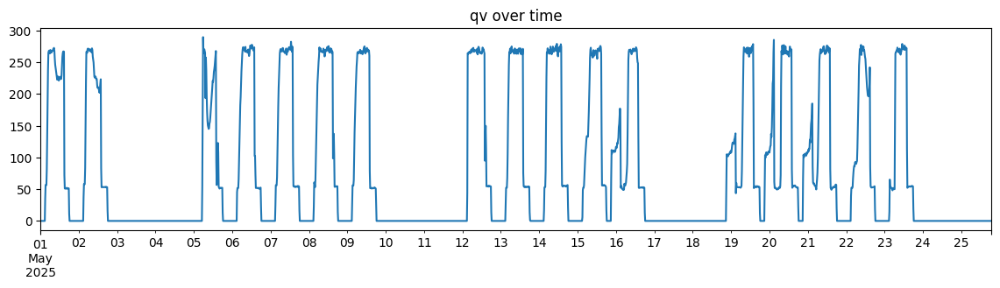

In [16]:
pd.Series(qv, index=index).plot(figsize=(14,3))
plt.title('qv over time')
plt.show()

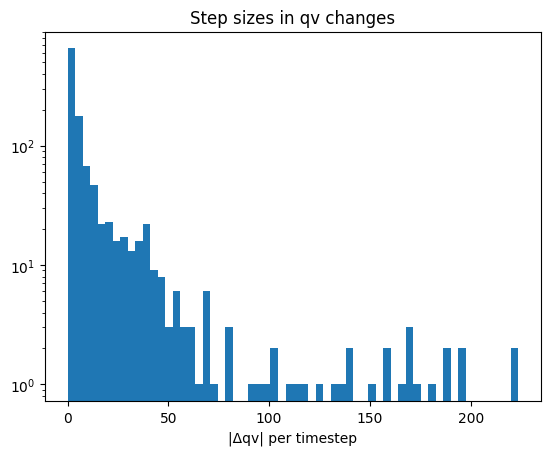

In [17]:
dqv = np.abs(np.diff(qv))
plt.hist(dqv[dqv > 0], bins=60, log=True)
plt.xlabel('|Δqv| per timestep')
plt.title('Step sizes in qv changes')
plt.show()

## Pre computation block

In [29]:
# ════════════════════════════════════════════════════════════════════════════
#  PRE-COMPUTATION  —  ANN Surrogate + NSGA-II  (stripped to essentials)
# ════════════════════════════════════════════════════════════════════════════
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ── CONFIG ───────────────────────────────────────────────────────────────────
T_cat1_min        = 22.0
T_cat1_max        = 24.0
T_TARGET          = 23.0
TA_MIN_NIGHT_VENT = 14.0
OCC_START         = 8
OCC_END           = 18
dt_h              = rec_duration

# ── UNIFIED BOUNDS — restored to match old Pareto sweep ──────────────────────
# FIX 1: START_LB = 15h (was 20h — was cutting off pre-cooling window)
# FIX 2: STOP_UB  = 10h (was  7h — was cutting off late morning hours)
NIGHT_OPT_START_LB = 20.0   # no earlier than 20:00
NIGHT_OPT_START_UB = 23.0
NIGHT_OPT_STOP_LB  =  2.0   # no earlier than 02:00 — forces at least some night
NIGHT_OPT_STOP_UB  =  8.0   # no later than 08:00

NIGHT_START = 20
NIGHT_STOP  =  8

# ── PHYSICAL CONSTANTS ───────────────────────────────────────────────────────
RHO_AIR  = 1.2
CP_AIR   = 1005.0
COP_COOL = COP_mean

# ============================================================
# EMPIRICAL FAN COST MODEL — room airflow mapped to AHU curve
# ============================================================

Q_AHU_TOTAL = 35000.0
Q_ROOM_MAX  = QV_MAX   # 270.0 m³/h

# Best smooth piecewise AHU SFP(Q) fit
BP_SFP = 10331.0   # m³/h

SFP_aL = 1.176e-08
SFP_aR = 3.710e-10
SFP_b  = 4.753e-06
SFP_c  = 4.815e-01

def sfp_ahu(Q_array):
    """
    AHU-level smooth piecewise SFP(Q)
    Input:  Q_array in m3/h
    Output: SFP in Wh/m3  (same numerical value as W/(m3/h))
    """
    Q = np.asarray(Q_array, dtype=float)
    q_shift = Q - BP_SFP
    left = q_shift <= 0.0

    SFP = np.empty_like(Q, dtype=float)
    SFP[left]  = SFP_aL * q_shift[left]**2  + SFP_b * q_shift[left]  + SFP_c
    SFP[~left] = SFP_aR * q_shift[~left]**2 + SFP_b * q_shift[~left] + SFP_c
    return SFP

def sfp_room(qv_array):
    """
    Map room airflow qv [m3/h] to equivalent AHU flow,
    then evaluate the empirical AHU SFP curve.
    """
    qv = np.asarray(qv_array, dtype=float)

    Q_equiv = qv * (Q_AHU_TOTAL / Q_ROOM_MAX)

    return np.where(
        qv > 0.0,
        sfp_ahu(Q_equiv),
        0.0
    )

def fan_cost_empirical(qv_array):
    """
    Fan electricity cost over the simulation horizon.
    qv_array : room airflow [m3/h]
    """
    qv = np.asarray(qv_array, dtype=float)
    SFPq = sfp_room(qv)

    # Power [kW]: qv [m3/h] * SFP [Wh/m3] / 1000 / 3.6
    P_kW = qv * SFPq / 1000.0 / 3.6

    return float(np.sum(P_kW) * P_ELEC * dt_h)
def q_cool_cost(qv_array, T_ext_arr, T_sup_arr):
    qv    = np.asarray(qv_array,  dtype=float)
    T_ext = np.asarray(T_ext_arr, dtype=float)
    T_sup = np.asarray(T_sup_arr, dtype=float)
    delta = np.maximum(0.0, T_ext - T_sup)
    Q_kW  = (qv / 3600.0) * RHO_AIR * CP_AIR * delta / 1000.0
    return float(np.sum(Q_kW) * dt_h / COP_COOL * P_ELEC)

def total_system_cost(qv_array, T_ext_arr, T_sup_arr):
    return fan_cost_empirical(qv_array) + q_cool_cost(qv_array, T_ext_arr, T_sup_arr)

# ── TIME / MASK ARRAYS ───────────────────────────────────────────────────────
hours    = np.array([t.hour + t.minute / 60.0 for t in index])
weekdays = np.array([t.weekday() for t in index])
Ta_arr   = np.asarray(X_train['Ta'], dtype=float)
qv_arr   = np.asarray(X_train['qv'], dtype=float)

occ_mask = (hours >= OCC_START) & (hours < OCC_END)
weekday_day_mask = occ_mask & (weekdays < 5)

# Night mask spans 15h–10h outer envelope (wraps midnight)
nighttime_mask = (hours >= NIGHT_START) | (hours < NIGHT_STOP)

def _next_morning_is_weekday(t):
    ref = t + pd.Timedelta(days=1) if t.hour >= NIGHT_START else t
    return ref.weekday() < 5

weekday_night_mask = nighttime_mask & np.array(
    [_next_morning_is_weekday(t) for t in index])
all_night_mask     = nighttime_mask.copy()

# Condensation check — kept for diagnostics/reference, NOT used in build_X_monthly
ta_ok_mask = Ta_arr > TA_MIN_NIGHT_VENT

# ── HELPER FUNCTIONS ─────────────────────────────────────────────────────────
def pct_in_band(Ti_series, Tmin, Tmax, mask):
    Ti = np.asarray(Ti_series)[mask]
    return float(np.mean((Ti >= Tmin) & (Ti <= Tmax)) * 100)

def dh_from_target(Ti_arr, T_target=T_TARGET, mask=None):
    Ti = np.asarray(Ti_arr)
    if mask is not None:
        Ti = Ti[mask]
    dh_above = float(np.sum(np.maximum(0.0, Ti - T_target)) * dt_h)
    dh_below = float(np.sum(np.maximum(0.0, T_target - Ti)) * dt_h)
    return dh_above, dh_below

# ── MONTH LAYOUT ─────────────────────────────────────────────────────────────
months_in_data = pd.DatetimeIndex(index).to_period('M').unique()
N_months       = len(months_in_data)
month_labels   = [str(m) for m in months_in_data]
month_periods  = np.array([t.to_period('M') for t in index])

MONTHLY_BOUNDS = (
    [(NIGHT_OPT_START_LB, NIGHT_OPT_START_UB),
     (NIGHT_OPT_STOP_LB,  NIGHT_OPT_STOP_UB),
     (QV_MIN,             QV_MAX             )] * N_months
)

print(f"Months: {month_labels}  →  {N_months * 3} optimisation variables")

def _wday_check_fn(t, h_start):
    ref = t + pd.Timedelta(days=1) if t.hour >= h_start else t
    return ref.weekday() < 5

# ── BUILD_X_MONTHLY — FIX 3: ta_ok_mask REMOVED ──────────────────────────────
# The mask was filtering out warm afternoon hours (15–19h), making start_h
# irrelevant to the optimizer → Pareto front collapsed.
# q_cool_cost() already penalises T_ext > T_sup — no pre-filtering needed.
def build_X_monthly(params):
    params   = np.asarray(params, dtype=float)
    qv_mod   = np.asarray(X_train['qv'],   dtype=float).copy()
    Tsup_mod = np.asarray(X_train['Tsup'], dtype=float).copy()

    for i, month in enumerate(months_in_data):
        h_start = float(np.clip(params[3*i],     NIGHT_OPT_START_LB, NIGHT_OPT_START_UB))
        h_stop  = float(np.clip(params[3*i + 1], NIGHT_OPT_STOP_LB,  NIGHT_OPT_STOP_UB))
        qv_val  = float(np.clip(params[3*i + 2], QV_MIN,             QV_MAX))

        month_m = (month_periods == month)

        if h_start > h_stop:   # window wraps midnight
            night_m = (hours >= h_start) | (hours < h_stop)
        else:
            night_m = (hours >= h_start) & (hours < h_stop)

        wday_ok = np.array([_wday_check_fn(t, h_start) for t in index])
        mask_n  = month_m & night_m & wday_ok

        # Apply to ALL eligible hours — no ta_ok_mask suppression
        # Warm-hour ventilation is penalised naturally via q_cool_cost()
        qv_mod[mask_n]   = qv_val
        Tsup_mod[mask_n] = Ta_arr[mask_n]

    return qv_mod, Tsup_mod

# ── SCENARIO 1 — BASE SIMULATION ─────────────────────────────────────────────
print("Running Scenario 1 — base simulation...")
base_sim_result = simulate_night_vent_scenario(
    fitted_params, X_train, N_hist,
    night_start_hour=0, night_stop_hour=0, qv_night=0,
    rec_duration=rec_duration,
    Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)

Ti_ref        = np.asarray(base_sim_result['Ti'])
Tsup_ref      = np.asarray(X_train['Tsup'], dtype=float)
cost_ref      = total_system_cost(qv_arr, Ta_arr, Tsup_ref)
pct_occ_ref   = pct_in_band(Ti_ref, T_cat1_min, T_cat1_max, occ_mask)
pct_night_ref = pct_in_band(Ti_ref, T_cat1_min, T_cat1_max, all_night_mask)
dh_above_ref, dh_below_ref = dh_from_target(Ti_ref)
print(f"  Base sim:  {dh_above_ref:.1f} °C·h  |  {cost_ref:.2f} DKK  |  {pct_occ_ref:.1f}% day")

# ── SCENARIO 3 — BASELINE (no night ventilation) ──────────────────────────────
print("Running Scenario 3 — baseline (no night vent)...")
qv_baseline      = qv_arr.copy()
qv_baseline[weekday_night_mask] = 0.0

X_base       = X_train.copy()
X_base['qv'] = qv_baseline

baseline = simulate_night_vent_scenario(
    fitted_params, X_base, N_hist,
    night_start_hour=0, night_stop_hour=0, qv_night=0,
    rec_duration=rec_duration,
    Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)

Ti_baseline                  = np.asarray(baseline['Ti'])
Tsup_base                    = np.asarray(X_base['Tsup'], dtype=float)
cost_baseline                = total_system_cost(qv_baseline, Ta_arr, Tsup_base)
pct_occ_base                 = pct_in_band(Ti_baseline, T_cat1_min, T_cat1_max, occ_mask)
dh_above_base, dh_below_base = dh_from_target(Ti_baseline)
print(f"  Baseline:  {dh_above_base:.1f} °C·h  |  {cost_baseline:.2f} DKK  |  {pct_occ_base:.1f}% day")

# ── DIAGNOSTIC: verify build_X_monthly now responds to start_h ───────────────
_p15 = np.array([15.0, 10.0, QV_MAX])
_p23 = np.array([23.0,  7.0, QV_MAX])
_qv15, _ts15 = build_X_monthly(_p15)
_qv23, _ts23 = build_X_monthly(_p23)
_base_qv = X_train['qv'].values
print(f"\n  Diagnostic — hours modified vs baseline qv:")
print(f"  start=15h, stop=10h: {int(np.sum(_qv15 != _base_qv))} hours  "
      f"cost={total_system_cost(_qv15, Ta_arr, _ts15):.2f} DKK")
print(f"  start=23h, stop= 7h: {int(np.sum(_qv23 != _base_qv))} hours  "
      f"cost={total_system_cost(_qv23, Ta_arr, _ts23):.2f} DKK")
print(f"  ✓ Cost difference = "
      f"{total_system_cost(_qv15, Ta_arr, _ts15) - total_system_cost(_qv23, Ta_arr, _ts23):+.2f} DKK  "
      f"(should be positive — early start costs more)")

print(f"\n  Pre-computation complete. Ready for ANN+NSGA-II.")

Months: ['2025-05']  →  3 optimisation variables
Running Scenario 1 — base simulation...
  Base sim:  484.3 °C·h  |  17.87 DKK  |  66.4% day
Running Scenario 3 — baseline (no night vent)...
  Baseline:  563.1 °C·h  |  13.23 DKK  |  54.9% day

  Diagnostic — hours modified vs baseline qv:
  start=15h, stop=10h: 800 hours  cost=31.69 DKK
  start=23h, stop= 7h: 540 hours  cost=27.20 DKK
  ✓ Cost difference = +4.50 DKK  (should be positive — early start costs more)

  Pre-computation complete. Ready for ANN+NSGA-II.


In [30]:
test_qv = np.array([0.0, 50.0, 150.0, 270.0])
print("SFP_room(test_qv) =", sfp_room(test_qv))

SFP_room(test_qv) = [0.         0.63747224 0.55562956 0.82452735]


## Night ventilation multi objective optimization


════════════════════════════════════════════════════════════════════════
  PHASE 1 — Latin Hypercube Sampling  (1000 points × 4 variables)
  start_h ∈ [20, 23]h  |  stop_h ∈ [2, 8]h  |  qv ∈ [0, 270] m³/h
════════════════════════════════════════════════════════════════════════
  Simulating sample 100/1000  (failed so far: 0)
  Simulating sample 200/1000  (failed so far: 0)
  Simulating sample 300/1000  (failed so far: 0)
  Simulating sample 400/1000  (failed so far: 0)
  Simulating sample 500/1000  (failed so far: 0)
  Simulating sample 600/1000  (failed so far: 0)
  Simulating sample 700/1000  (failed so far: 0)
  Simulating sample 800/1000  (failed so far: 0)
  Simulating sample 900/1000  (failed so far: 0)
  Simulating sample 1000/1000  (failed so far: 0)

  Sampling complete — 1000/1000 valid simulations
  °C·h  — min: 300.4  mean: 406.2  max: 555.4
  cost  — min: 14.04  mean: 21.31  max: 32.60
  Saved: ann_lhs_training_data.csv

═══════════════════════════════════════════════════

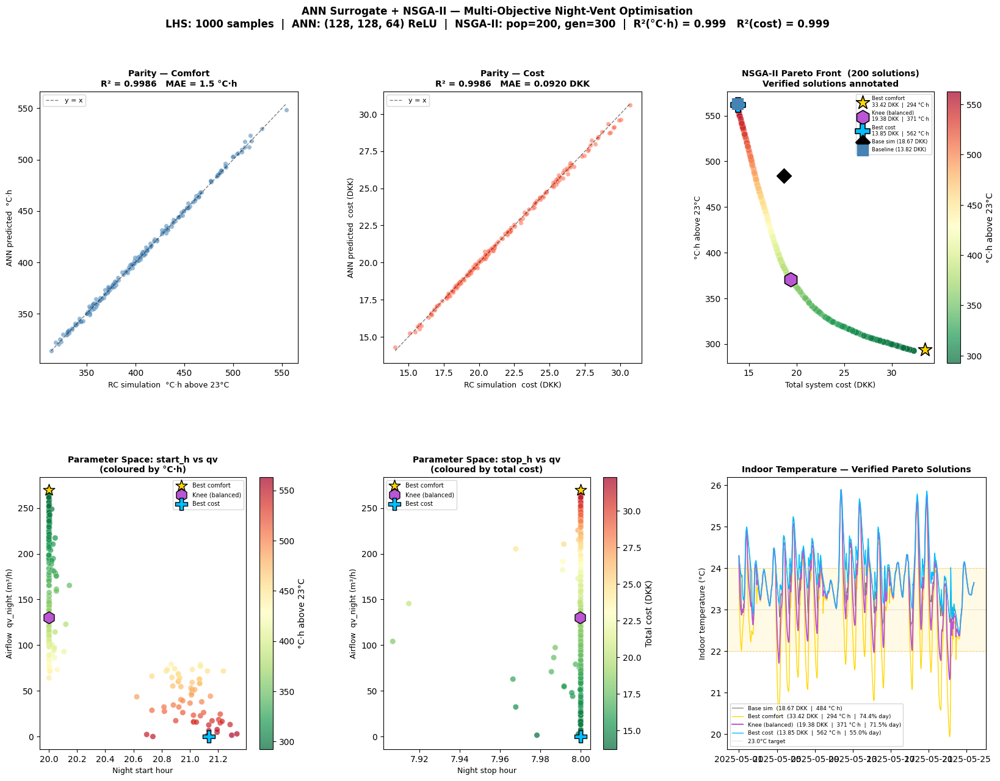


════════════════════════════════════════════════════════════════════════
  ANN + NSGA-II — RECOMMENDED SCHEDULE  (Pareto knee)
════════════════════════════════════════════════════════════════════════
  Night start   : 20.0h  →  20:00
  Night stop    : 8.0h  →  07:59
  Airflow       : 130 m³/h
  °C·h above 23°C: 370.8  (base sim: 484.3   Δ = -113.5)
  Day comfort   : 71.5%  (base sim: 66.4%)
  Total cost    : 19.38 DKK  (base sim: 18.67   Δ = +0.70)

────────────────────────────────────────────────────────────────────────
  Label                    Start   Stop     qv      °C·h       DKK     Day%    Night%
────────────────────────────────────────────────────────────────────────
  Best comfort            20.0h   8.0h   270     293.6     33.42    74.4%     59.6%
  Knee (balanced)         20.0h   8.0h   130     370.8     19.38    71.5%     82.9%
  Best cost               21.1h   8.0h     0     562.0     13.85    55.0%     66.3%
─────────────────────────────────────────────────────────────

In [ ]:
# ════════════════════════════════════════════════════════════════════════════
#  ANN SURROGATE + NSGA-II  —  Night-Vent Multi-Objective Optimisation
#
#  Pipeline:
#    Phase 1 — Latin Hypercube Sampling  →  RC simulation  →  training dataset
#    Phase 2 — Train & validate MLPRegressor surrogate  (128-128-64 ReLU)
#    Phase 3 — NSGA-II multi-objective optimisation on surrogate
#    Phase 4 — Re-simulate 3 key Pareto solutions with true RC model
#    Phase 5 — Dashboard figure + final schedule recommendation
#
#  Prerequisites (must already exist in namespace):
#    build_X_monthly, simulate_night_vent_scenario, total_system_cost,
#    dh_from_target, pct_in_band, fan_cost_aivc, q_cool_cost
#    fitted_params, X_train, N_hist, rec_duration, Ti_init, Tm_init, c_init
#    Ta_arr, qv_arr, index, occ_mask, all_night_mask, dt_h
#    T_TARGET, T_cat1_min, T_cat1_max, QV_MIN, QV_MAX
#    NIGHT_OPT_START_LB/UB, NIGHT_OPT_STOP_LB/UB     (unified bounds block)
#    dh_above_ref, cost_ref, pct_occ_ref, pct_night_ref   (Scenario 1)
#    dh_above_base, cost_baseline, pct_occ_base             (Scenario 3)
#    Ti_ref                                                  (Scenario 1)
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.stats.qmc import LatinHypercube, scale as lhs_scale
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.core.problem import Problem
from pymoo.optimize import minimize as pymoo_minimize
from pymoo.operators.crossover.sbx import SBX
from pymoo.operators.mutation.pm import PM
from pymoo.operators.sampling.rnd import FloatRandomSampling
from pymoo.termination import get_termination


# ── TUNABLE ──────────────────────────────────────────────────────────────────
N_SAMPLES    = 1000
TEST_FRAC    = 0.20
ANN_LAYERS   = (128, 128, 64)
NSGA_POP     = 200
NSGA_GEN     = 300
RANDOM_SEED  = 42

N_VARS = 4   # ← add this — single source of truth for variable count

# ── PARAMETER BOUNDS ─────────────────────────────────────────────────────────
LB = np.array([NIGHT_OPT_START_LB, NIGHT_OPT_STOP_LB, QV_MIN, 0.0] * N_months)
UB = np.array([NIGHT_OPT_START_UB, NIGHT_OPT_STOP_UB, QV_MAX, 1.0] * N_months)
PARAM_NAMES = ['start_h', 'stop_h', 'qv_night', 'on_off']

# ── PHASE 1 — LHS sampling ───────────────────────────────────────────────────
print(f"\n{'═'*72}")
print(f"  PHASE 1 — Latin Hypercube Sampling  ({N_SAMPLES} points × {N_VARS} variables)")
print(f"  start_h ∈ [{LB[0]:.0f}, {UB[0]:.0f}]h  |  "
      f"stop_h ∈ [{LB[1]:.0f}, {UB[1]:.0f}]h  |  "
      f"qv ∈ [{LB[2]:.0f}, {UB[2]:.0f}] m³/h")
print(f"{'═'*72}")

sampler = LatinHypercube(d=N_VARS, seed=RANDOM_SEED)   # ← was d=3, now d=4
X_lhs   = lhs_scale(sampler.random(n=N_SAMPLES), LB, UB)

Y_dh   = np.zeros(N_SAMPLES)   # °C·h above T_TARGET
Y_cost = np.zeros(N_SAMPLES)   # total system cost [DKK]
_failed = 0

for i, params in enumerate(X_lhs):
    if (i + 1) % 100 == 0:
        print(f"  Simulating sample {i+1}/{N_SAMPLES}  "
              f"(failed so far: {_failed})")
    try:
        qv_mod, Tsup_mod = build_X_monthly(params)
        X_mod         = X_train.copy()
        X_mod['qv']   = qv_mod
        X_mod['Tsup'] = Tsup_mod
        res = simulate_night_vent_scenario(
            fitted_params, X_mod, N_hist,
            night_start_hour=0, night_stop_hour=0, qv_night=0,
            rec_duration=rec_duration,
            Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
        Ti = np.asarray(res['Ti'])
        if np.all(np.isfinite(Ti)):
            Y_dh[i]   = float(np.sum(np.maximum(0.0, Ti - T_TARGET)) * dt_h)
            Y_cost[i] = total_system_cost(qv_mod, Ta_arr, Tsup_mod)
        else:
            # Invalid simulation — use penalised value so ANN avoids this region
            Y_dh[i]   = dh_above_ref * 2.0
            Y_cost[i] = cost_ref     * 2.0
            _failed  += 1
    except Exception as e:
        Y_dh[i]   = dh_above_ref * 2.0
        Y_cost[i] = cost_ref     * 2.0
        _failed  += 1

Y_lhs = np.column_stack([Y_dh, Y_cost])

print(f"\n  Sampling complete — {N_SAMPLES - _failed}/{N_SAMPLES} valid simulations")
print(f"  °C·h  — min: {Y_dh.min():.1f}  mean: {Y_dh.mean():.1f}  max: {Y_dh.max():.1f}")
print(f"  cost  — min: {Y_cost.min():.2f}  mean: {Y_cost.mean():.2f}  max: {Y_cost.max():.2f}")

# Save training dataset
_lhs_df = pd.DataFrame(
    np.column_stack([X_lhs, Y_lhs]),
    columns=['start_h', 'stop_h', 'qv_night', 'on_off', 'dh_above', 'cost_dkk'])
_lhs_df.to_csv('ann_lhs_training_data.csv', index=False)
print(f"  Saved: ann_lhs_training_data.csv")


# ════════════════════════════════════════════════════════════════════════════
#  PHASE 2 — Train & validate ANN surrogate
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*72}")
print(f"  PHASE 2 — ANN surrogate  ({ANN_LAYERS} hidden units, ReLU, Adam)")
print(f"{'═'*72}")

# Train / test split
X_tr, X_te, Y_tr, Y_te = train_test_split(
    X_lhs, Y_lhs, test_size=TEST_FRAC, random_state=RANDOM_SEED)

# StandardScaler — fit on train only
scaler_X = StandardScaler().fit(X_tr)
scaler_Y = StandardScaler().fit(Y_tr)
X_tr_s   = scaler_X.transform(X_tr)
X_te_s   = scaler_X.transform(X_te)
Y_tr_s   = scaler_Y.transform(Y_tr)

# ANN — multi-output regression (both objectives simultaneously)
ann = MLPRegressor(
    hidden_layer_sizes=ANN_LAYERS,
    activation='relu',
    solver='adam',
    alpha=1e-4,              # L2 regularisation
    max_iter=3000,
    learning_rate_init=1e-3,
    early_stopping=True,
    validation_fraction=0.15,
    n_iter_no_change=60,
    random_state=RANDOM_SEED,
    verbose=False
)
ann.fit(X_tr_s, Y_tr_s)
print(f"  Training stopped at iteration {ann.n_iter_} / {ann.max_iter}")

# Validation
Y_pred_s = ann.predict(X_te_s)
Y_pred   = scaler_Y.inverse_transform(Y_pred_s)

r2_dh    = r2_score(Y_te[:, 0], Y_pred[:, 0])
r2_cost  = r2_score(Y_te[:, 1], Y_pred[:, 1])
mae_dh   = mean_absolute_error(Y_te[:, 0], Y_pred[:, 0])
mae_cost = mean_absolute_error(Y_te[:, 1], Y_pred[:, 1])

print(f"\n  Validation results  (n_test = {len(X_te)}):")
print(f"  {'Objective':<24} {'R²':>8}  {'MAE':>14}  {'Status':>10}")
print(f"  {'─'*62}")
for name, r2, mae, unit in [
    ('°C·h above 23°C', r2_dh,   mae_dh,   '°C·h'),
    ('Total cost DKK',  r2_cost,  mae_cost, 'DKK'),
]:
    status = '✓  reliable' if r2 >= 0.90 else '⚠  retrain'
    print(f"  {name:<24} {r2:>8.4f}  {mae:>10.3f} {unit:>3}  {status:>10}")

if r2_dh < 0.90 or r2_cost < 0.90:
    print(f"\n  ⚠  Increase N_SAMPLES to 1000+ and re-run Phase 1–2.")
else:
    print(f"\n  ✓  Both R² ≥ 0.90 — surrogate approved for NSGA-II.")


# ── Surrogate inference helper ────────────────────────────────────────────────
def surrogate_predict(X_raw: np.ndarray) -> np.ndarray:
    """
    Predict [dh_above_23, total_cost] for a (n × 3) parameter array.
    Returns (n × 2) array with non-negative values.
    """
    Y_s = ann.predict(scaler_X.transform(np.atleast_2d(X_raw)))
    Y   = scaler_Y.inverse_transform(Y_s)
    Y[:, 0] = np.clip(Y[:, 0], 0.0, None)   # dh ≥ 0
    Y[:, 1] = np.clip(Y[:, 1], 0.0, None)   # cost ≥ 0
    return Y


# ════════════════════════════════════════════════════════════════════════════
#  PHASE 3 — NSGA-II on surrogate
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*72}")
print(f"  PHASE 3 — NSGA-II  (pop={NSGA_POP}, gen={NSGA_GEN}, surrogate-based)")
print(f"  f1 = °C·h above {T_TARGET}°C  |  f2 = total system cost (DKK)")
print(f"{'═'*72}")


class NightVentSurrogateProblem(Problem):
    """
    Minimise simultaneously:
      f1 = °C·h above T_TARGET  (thermal comfort)
      f2 = total system cost     (energy + cooling penalty)
    Decision variables: [start_h, stop_h, qv_night]
    """
    def __init__(self):
        super().__init__(n_var=N_VARS, n_obj=2, xl=LB, xu=UB, vtype=float)  # ← n_var=4

    def _evaluate(self, X, out, *args, **kwargs):
        out["F"] = surrogate_predict(X)


nsga2 = NSGA2(
    pop_size=NSGA_POP,
    sampling=FloatRandomSampling(),
    crossover=SBX(prob=0.90, eta=15),
    mutation=PM(eta=20),
    eliminate_duplicates=True,
)
nsga2_res = pymoo_minimize(
    NightVentSurrogateProblem(),
    nsga2,
    termination=get_termination("n_gen", NSGA_GEN),
    seed=RANDOM_SEED,
    verbose=True,
    save_history=False,
)

X_pareto = nsga2_res.X   # (n_sol, 3)
F_pareto = nsga2_res.F   # (n_sol, 2)  — [dh, cost]
print(f"\n  NSGA-II complete — {len(X_pareto)} Pareto-optimal solutions")


# ── Identify knee + extreme solutions ────────────────────────────────────────
F_n = (F_pareto - F_pareto.min(0)) / (F_pareto.max(0) - F_pareto.min(0) + 1e-9)
knee_idx         = int(np.argmin(np.hypot(F_n[:, 0], F_n[:, 1])))
best_comfort_idx = int(np.argmin(F_pareto[:, 0]))
best_cost_idx    = int(np.argmin(F_pareto[:, 1]))

KEY_SOLUTIONS = {
    'Best comfort'    : (best_comfort_idx, 'gold',         '*'),
    'Knee (balanced)' : (knee_idx,         'mediumorchid', 'h'),
    'Best cost'       : (best_cost_idx,    'deepskyblue',  'P'),
}


# ════════════════════════════════════════════════════════════════════════════
#  PHASE 4 — Re-simulate key solutions with true RC model
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*72}")
print(f"  PHASE 4 — RC re-simulation of 3 key Pareto solutions")
print(f"{'═'*72}")

verified = {}
for label, (idx, color, marker) in KEY_SOLUTIONS.items():
    params   = X_pareto[idx]
    qv_mod, Tsup_mod = build_X_monthly(params)
    X_mod         = X_train.copy()
    X_mod['qv']   = qv_mod
    X_mod['Tsup'] = Tsup_mod
    res = simulate_night_vent_scenario(
        fitted_params, X_mod, N_hist,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
    Ti_v        = np.asarray(res['Ti'])
    dh_v, _     = dh_from_target(Ti_v)
    cost_v      = total_system_cost(qv_mod, Ta_arr, Tsup_mod)
    pct_occ_v   = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, occ_mask)
    pct_ngt_v   = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, all_night_mask)
    verified[label] = {
        'params'       : params,
        'Ti'           : Ti_v,
        'qv_mod'       : qv_mod,
        'dh_above'     : dh_v,
        'cost'         : cost_v,
        'pct_occ'      : pct_occ_v,
        'pct_night'    : pct_ngt_v,
        'surr_dh'      : F_pareto[idx, 0],
        'surr_cost'    : F_pareto[idx, 1],
        'color'        : color,
        'marker'       : marker,
    }
    print(f"\n  ── {label}  (NSGA-II idx {idx})")
    print(f"     Schedule  : "
          f"start={params[0]:.1f}h  stop={params[1]:.1f}h  qv={params[2]:.0f} m³/h")
    print(f"     RC sim    : "
          f"{dh_v:.1f} °C·h  |  {cost_v:.2f} DKK  |  "
          f"day: {pct_occ_v:.1f}%  night: {pct_ngt_v:.1f}%")
    print(f"     Surrogate : "
          f"{F_pareto[idx,0]:.1f} °C·h  |  {F_pareto[idx,1]:.2f} DKK  "
          f"(Δ = {dh_v - F_pareto[idx,0]:+.1f} °C·h  "
          f"{cost_v - F_pareto[idx,1]:+.2f} DKK)")


# ════════════════════════════════════════════════════════════════════════════
#  PHASE 5 — Dashboard figure
# ════════════════════════════════════════════════════════════════════════════
fig_ann = plt.figure(figsize=(20, 14))
gs_ann  = gridspec.GridSpec(2, 3, figure=fig_ann, hspace=0.42, wspace=0.33)
fig_ann.suptitle(
    'ANN Surrogate + NSGA-II — Multi-Objective Night-Vent Optimisation\n'
    f'LHS: {N_SAMPLES} samples  |  ANN: {ANN_LAYERS} ReLU  |  '
    f'NSGA-II: pop={NSGA_POP}, gen={NSGA_GEN}  |  '
    f'R²(°C·h) = {r2_dh:.3f}   R²(cost) = {r2_cost:.3f}',
    fontsize=12, fontweight='bold'
)

# ── P0: Parity — comfort ──────────────────────────────────────────────────────
ax0 = fig_ann.add_subplot(gs_ann[0, 0])
ax0.scatter(Y_te[:, 0], Y_pred[:, 0], alpha=0.55, s=28,
            color='steelblue', edgecolors='white', lw=0.3)
_lo, _hi = Y_te[:, 0].min(), Y_te[:, 0].max()
ax0.plot([_lo, _hi], [_lo, _hi], 'k--', lw=1.0, alpha=0.5, label='y = x')
ax0.set_xlabel('RC simulation  °C·h above 23°C', fontsize=9)
ax0.set_ylabel('ANN predicted  °C·h', fontsize=9)
ax0.set_title(f'Parity — Comfort\nR² = {r2_dh:.4f}   MAE = {mae_dh:.1f} °C·h',
              fontsize=10, fontweight='bold')
ax0.legend(fontsize=8)

# ── P1: Parity — cost ────────────────────────────────────────────────────────
ax1 = fig_ann.add_subplot(gs_ann[0, 1])
ax1.scatter(Y_te[:, 1], Y_pred[:, 1], alpha=0.55, s=28,
            color='tomato', edgecolors='white', lw=0.3)
_lo, _hi = Y_te[:, 1].min(), Y_te[:, 1].max()
ax1.plot([_lo, _hi], [_lo, _hi], 'k--', lw=1.0, alpha=0.5, label='y = x')
ax1.set_xlabel('RC simulation  cost (DKK)', fontsize=9)
ax1.set_ylabel('ANN predicted  cost (DKK)', fontsize=9)
ax1.set_title(f'Parity — Cost\nR² = {r2_cost:.4f}   MAE = {mae_cost:.4f} DKK',
              fontsize=10, fontweight='bold')
ax1.legend(fontsize=8)

# ── P2: Pareto front (NSGA-II) ───────────────────────────────────────────────
ax2 = fig_ann.add_subplot(gs_ann[0, 2])
_sort = np.argsort(F_pareto[:, 1])
sc2   = ax2.scatter(F_pareto[:, 1], F_pareto[:, 0],
                    c=F_pareto[:, 0], cmap='RdYlGn_r', s=55,
                    alpha=0.70, edgecolors='white', lw=0.3, zorder=3)
ax2.plot(F_pareto[_sort, 1], F_pareto[_sort, 0],
         color='black', lw=1.0, alpha=0.35, zorder=2)
plt.colorbar(sc2, ax=ax2, label='°C·h above 23°C')

for label, data in verified.items():
    ax2.scatter(data['cost'], data['dh_above'],
                s=280, marker=data['marker'], color=data['color'],
                edgecolors='black', lw=1.2, zorder=6,
                label=f"{label}\n"
                      f"{data['cost']:.2f} DKK  |  {data['dh_above']:.0f} °C·h")

ax2.scatter(cost_ref,      dh_above_ref,  s=150, marker='D',
            color='black',     zorder=7, label=f'Base sim ({cost_ref:.2f} DKK)')
ax2.scatter(cost_baseline, dh_above_base, s=150, marker='s',
            color='steelblue', zorder=7, label=f'Baseline ({cost_baseline:.2f} DKK)')
ax2.set_xlabel('Total system cost (DKK)', fontsize=9)
ax2.set_ylabel('°C·h above 23°C', fontsize=9)
ax2.set_title(f'NSGA-II Pareto Front  ({len(X_pareto)} solutions)\n'
              f'Verified solutions annotated',
              fontsize=10, fontweight='bold')
ax2.legend(fontsize=6.0, loc='upper right')

# ── P3: Parameter space — start_h vs qv, coloured by dh ──────────────────────
ax3 = fig_ann.add_subplot(gs_ann[1, 0])
sc3 = ax3.scatter(X_pareto[:, 0], X_pareto[:, 2],
                  c=F_pareto[:, 0], cmap='RdYlGn_r', s=45,
                  alpha=0.70, edgecolors='white', lw=0.3)
plt.colorbar(sc3, ax=ax3, label='°C·h above 23°C')
for label, data in verified.items():
    ax3.scatter(data['params'][0], data['params'][2],
                s=200, marker=data['marker'], color=data['color'],
                edgecolors='black', lw=1.0, zorder=5, label=label)
ax3.set_xlabel('Night start hour', fontsize=9)
ax3.set_ylabel('Airflow  qv_night (m³/h)', fontsize=9)
ax3.set_title('Parameter Space: start_h vs qv\n(coloured by °C·h)',
              fontsize=10, fontweight='bold')
ax3.legend(fontsize=7)

# ── P4: Parameter space — stop_h vs qv, coloured by cost ─────────────────────
ax4 = fig_ann.add_subplot(gs_ann[1, 1])
sc4 = ax4.scatter(X_pareto[:, 1], X_pareto[:, 2],
                  c=F_pareto[:, 1], cmap='RdYlGn_r', s=45,
                  alpha=0.70, edgecolors='white', lw=0.3)
plt.colorbar(sc4, ax=ax4, label='Total cost (DKK)')
for label, data in verified.items():
    ax4.scatter(data['params'][1], data['params'][2],
                s=200, marker=data['marker'], color=data['color'],
                edgecolors='black', lw=1.0, zorder=5, label=label)
ax4.set_xlabel('Night stop hour', fontsize=9)
ax4.set_ylabel('Airflow  qv_night (m³/h)', fontsize=9)
ax4.set_title('Parameter Space: stop_h vs qv\n(coloured by total cost)',
              fontsize=10, fontweight='bold')
ax4.legend(fontsize=7)

# ── P5: Ti time-series — verified solutions ───────────────────────────────────
ax5 = fig_ann.add_subplot(gs_ann[1, 2])
ax5.plot(index, Ti_ref, color='black', lw=0.9, alpha=0.50,
         label=f'Base sim  ({cost_ref:.2f} DKK  |  {dh_above_ref:.0f} °C·h)')
for label, data in verified.items():
    lw = 1.4 if label == 'Knee (balanced)' else 1.0
    ax5.plot(index, data['Ti'], color=data['color'], lw=lw,
             label=f"{label}  ({data['cost']:.2f} DKK  |  "
                   f"{data['dh_above']:.0f} °C·h  |  {data['pct_occ']:.1f}% day)")
ax5.axhspan(T_cat1_min, T_cat1_max, alpha=0.10, color='gold')
ax5.axhline(T_cat1_max, color='goldenrod', lw=0.7, ls='--', alpha=0.5)
ax5.axhline(T_cat1_min, color='goldenrod', lw=0.7, ls='--', alpha=0.5)
ax5.axhline(T_TARGET,   color='grey',      lw=0.7, ls=':',  alpha=0.6,
            label=f'{T_TARGET}°C target')
ax5.set_ylabel('Indoor temperature (°C)', fontsize=9)
ax5.set_title('Indoor Temperature — Verified Pareto Solutions',
              fontsize=10, fontweight='bold')
ax5.legend(fontsize=6.5)

plt.savefig('ann_nsga2_dashboard.png', dpi=150, bbox_inches='tight')
plt.show()


# ════════════════════════════════════════════════════════════════════════════
#  FINAL RECOMMENDATION PRINTOUT
# ════════════════════════════════════════════════════════════════════════════
knee = verified['Knee (balanced)']
print(f"\n{'═'*72}")
print(f"  ANN + NSGA-II — RECOMMENDED SCHEDULE  (Pareto knee)")
print(f"{'═'*72}")
print(f"  Night start   : {knee['params'][0]:.1f}h  "
      f"→  {int(knee['params'][0]):02d}:{int((knee['params'][0] % 1)*60):02d}")
print(f"  Night stop    : {knee['params'][1]:.1f}h  "
      f"→  {int(knee['params'][1]):02d}:{int((knee['params'][1] % 1)*60):02d}")
print(f"  Airflow       : {knee['params'][2]:.0f} m³/h")
print(f"  °C·h above 23°C: {knee['dh_above']:.1f}  "
      f"(base sim: {dh_above_ref:.1f}   Δ = {knee['dh_above'] - dh_above_ref:+.1f})")
print(f"  Day comfort   : {knee['pct_occ']:.1f}%  "
      f"(base sim: {pct_occ_ref:.1f}%)")
print(f"  Total cost    : {knee['cost']:.2f} DKK  "
      f"(base sim: {cost_ref:.2f}   Δ = {knee['cost'] - cost_ref:+.2f})")

print(f"\n{'─'*72}")
print(f"  {'Label':<22} {'Start':>7} {'Stop':>6} {'qv':>6}  "
      f"{'°C·h':>8}  {'DKK':>8}  {'Day%':>7}  {'Night%':>8}")
print(f"{'─'*72}")
for label, data in verified.items():
    p = data['params']
    print(f"  {label:<22} {p[0]:>5.1f}h {p[1]:>5.1f}h {p[2]:>5.0f}  "
          f"{data['dh_above']:>8.1f}  {data['cost']:>8.2f}  "
          f"{data['pct_occ']:>6.1f}%  {data['pct_night']:>7.1f}%")
print(f"{'─'*72}")
print(f"  {'Base simulation':<22}  {'—':>6}  {'—':>6}  {'—':>6}  "
      f"{dh_above_ref:>8.1f}  {cost_ref:>8.2f}  "
      f"{pct_occ_ref:>6.1f}%  {pct_night_ref:>7.1f}%")
print(f"  {'Baseline (no-vent)':<22}  {'—':>6}  {'—':>6}  {'—':>6}  "
      f"{dh_above_base:>8.1f}  {cost_baseline:>8.2f}  "
      f"{pct_occ_base:>6.1f}%  {'—':>7}")
print(f"{'═'*72}")

# Surrogate error summary
print(f"\n  Surrogate accuracy on re-simulated solutions:")
print(f"  {'Label':<22}  {'Δ°C·h':>10}  {'ΔDKK':>8}")
print(f"  {'─'*44}")
for label, data in verified.items():
    print(f"  {label:<22}  "
          f"{data['dh_above'] - data['surr_dh']:>+10.2f}  "
          f"{data['cost'] - data['surr_cost']:>+8.4f}")



════════════════════════════════════════════════════════════════════════════════════════════════
  ANN + NSGA-II — PARETO COMPARISON TABLE
════════════════════════════════════════════════════════════════════════════════════════════════
  Scenario                         Start   Stop    qv      °C·h    Δ°C·h      DKK     ΔDKK    Day%   Night%
  ----------------------------------------------------------------------------------------------
  Baseline (no night vent)             —      —     —     563.1    +78.8    13.82    -4.85   54.9%    65.9%
  Base simulation (current)            —      —     —     484.3        —    18.67        —   66.4%    73.7%
  Best cost                        21.1h   8.0h     0     562.0    +77.7    13.85    -4.82   55.0%    66.3%
  Same cost as base sim            20.0h   8.0h   115     385.5    -98.8    18.70    +0.03   70.8%    83.6%
  Same comfort as base sim         21.0h   8.0h    48     479.9     -4.4    16.04    -2.64   64.2%    78.1%
  Knee (balanced) 

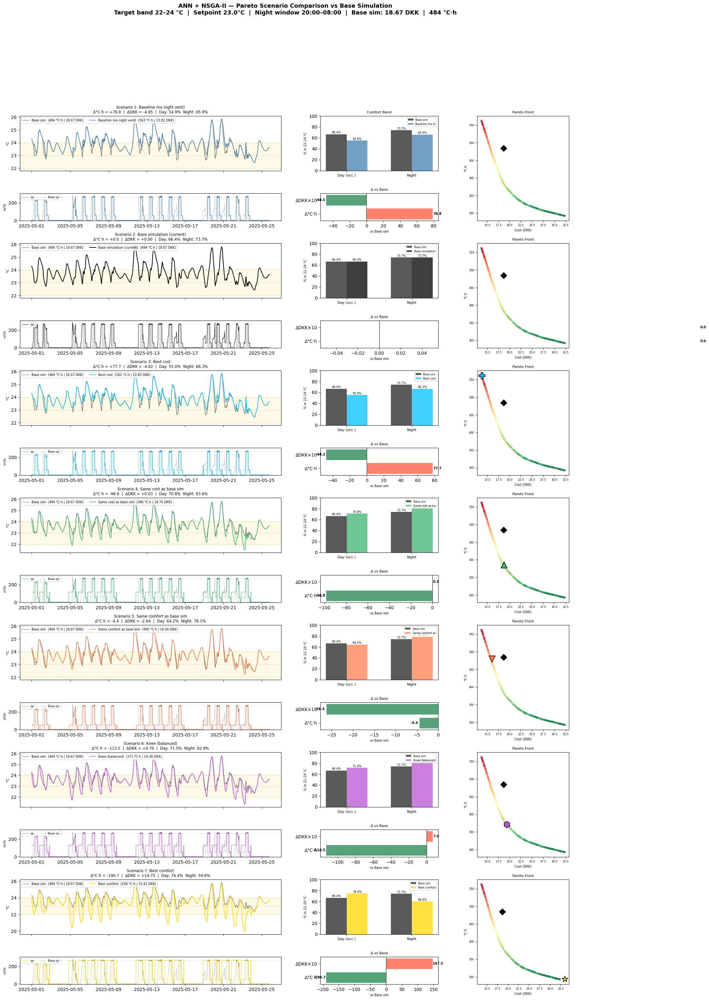

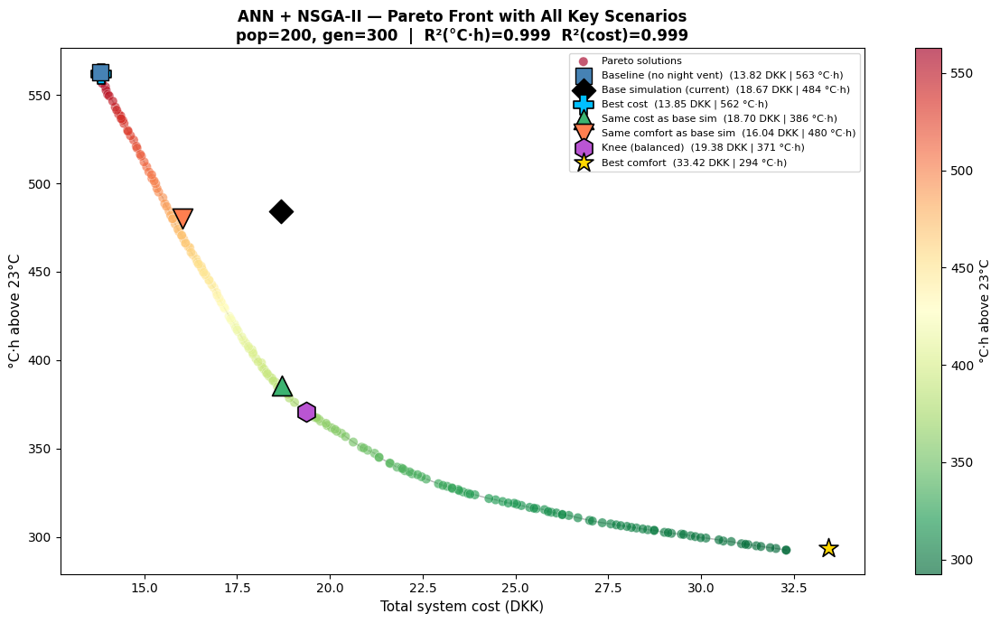

In [22]:
# ════════════════════════════════════════════════════════════════════════════
#  ANN+NSGA-II PARETO COMPARISON — Summary Table + Figure
#
#  Prerequisites (from ANN+NSGA-II block):
#    verified         — dict with keys: Best comfort, Knee (balanced), Best cost
#    F_pareto, X_pareto — full Pareto front arrays
#    dh_above_ref, cost_ref, pct_occ_ref, pct_night_ref, Ti_ref
#    dh_above_base, cost_baseline, pct_occ_base, Ti_baseline
#    index, occ_mask, all_night_mask, weekday_night_mask, weekday_day_mask
#    ta_ok_mask, T_TARGET, T_cat1_min, T_cat1_max, QV_MAX, dt_h
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches

# ── Find iso-cost and iso-comfort Pareto solutions ───────────────────────────
# 1. Same cost as base sim → best comfort achievable at that cost
_cost_diff = np.abs(F_pareto[:, 1] - cost_ref)
iso_cost_idx = int(np.argmin(_cost_diff))

# 2. Same comfort as base sim → best cost achievable at that comfort
_dh_diff = np.abs(F_pareto[:, 0] - dh_above_ref)
iso_comfort_idx = int(np.argmin(_dh_diff))

# Re-simulate both with RC model
def _resim(idx, label, color, marker):
    params = X_pareto[idx]
    qv_mod, Tsup_mod = build_X_monthly(params)
    X_mod = X_train.copy()
    X_mod['qv']   = qv_mod
    X_mod['Tsup'] = Tsup_mod
    res = simulate_night_vent_scenario(
        fitted_params, X_mod, N_hist,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
    Ti_v      = np.asarray(res['Ti'])
    dh_v, _   = dh_from_target(Ti_v)
    cost_v    = total_system_cost(qv_mod, Ta_arr, Tsup_mod)
    pct_occ_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, occ_mask)
    pct_ngt_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, all_night_mask)
    return {
        'label': label, 'params': params, 'Ti': Ti_v,
        'qv_mod': qv_mod, 'dh_above': dh_v, 'cost': cost_v,
        'pct_occ': pct_occ_v, 'pct_night': pct_ngt_v,
        'color': color, 'marker': marker,
    }

iso_cost_data    = _resim(iso_cost_idx,    'Same cost as base sim',    'mediumseagreen', '^')
iso_comfort_data = _resim(iso_comfort_idx, 'Same comfort as base sim', 'coral',          'v')

# ── Master scenario list ──────────────────────────────────────────────────────
SCENARIOS = [
    {'label': 'Baseline (no night vent)',
     'Ti': Ti_baseline, 'qv_mod': qv_baseline,
     'dh_above': dh_above_base, 'cost': cost_baseline,
     'pct_occ': pct_occ_base,
     'pct_night': pct_in_band(Ti_baseline, T_cat1_min, T_cat1_max, all_night_mask),
     'color': 'steelblue', 'marker': 's'},

    {'label': 'Base simulation (current)',
     'Ti': Ti_ref, 'qv_mod': qv_arr,
     'dh_above': dh_above_ref, 'cost': cost_ref,
     'pct_occ': pct_occ_ref, 'pct_night': pct_night_ref,
     'color': 'black', 'marker': 'D'},

    {**verified['Best cost'],    'label': 'Best cost'},
    iso_cost_data,   
    iso_comfort_data,
    {**verified['Knee (balanced)'], 'label': 'Knee (balanced)'},
    {**verified['Best comfort'],    'label': 'Best comfort'},
]

# ── SUMMARY TABLE ─────────────────────────────────────────────────────────────
print(f"\n{'═'*96}")
print(f"  ANN + NSGA-II — PARETO COMPARISON TABLE")
print(f"{'═'*96}")
print(f"  {'Scenario':<30} {'Start':>7} {'Stop':>6} {'qv':>5}  "
      f"{'°C·h':>8}  {'Δ°C·h':>7}  {'DKK':>7}  {'ΔDKK':>7}  {'Day%':>6}  {'Night%':>7}")
print(f"  {'-'*94}")
for s in SCENARIOS:
    p = s.get('params', None)
    start_str = f"{p[0]:.1f}h" if p is not None else "—"
    stop_str  = f"{p[1]:.1f}h" if p is not None else "—"
    qv_str    = f"{p[2]:.0f}"  if p is not None else "—"
    d_dh   = s['dh_above'] - dh_above_ref
    d_cost = s['cost']     - cost_ref
    d_dh_str   = f"{d_dh:+.1f}"   if s['label'] != 'Base simulation (current)' else "—"
    d_cost_str = f"{d_cost:+.2f}" if s['label'] != 'Base simulation (current)' else "—"
    print(f"  {s['label']:<30} {start_str:>7} {stop_str:>6} {qv_str:>5}  "
          f"{s['dh_above']:>8.1f}  {d_dh_str:>7}  {s['cost']:>7.2f}  "
          f"{d_cost_str:>7}  {s['pct_occ']:>5.1f}%  {s['pct_night']:>6.1f}%")
print(f"  {'═'*94}")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE — Dashboard comparison
# ════════════════════════════════════════════════════════════════════════════
N_SCEN = len(SCENARIOS)
_ref   = SCENARIOS[1]   # base simulation

fig = plt.figure(figsize=(22, 5 * N_SCEN))
gs  = gridspec.GridSpec(
    N_SCEN * 2, 3,
    figure=fig,
    width_ratios=[4, 1.8, 1.4],
    height_ratios=[2, 1] * N_SCEN,
    hspace=0.55, wspace=0.25
)
fig.suptitle(
    'ANN + NSGA-II — Pareto Scenario Comparison vs Base Simulation\n'
    f'Target band {T_cat1_min:.0f}–{T_cat1_max:.0f} °C  |  Setpoint {T_TARGET}°C  |  '
    f'Night window {NIGHT_START:02d}:00–{NIGHT_STOP:02d}:00  |  '
    f'Base sim: {cost_ref:.2f} DKK  |  {dh_above_ref:.0f} °C·h',
    fontsize=13, fontweight='bold'
)

for row, s in enumerate(SCENARIOS):
    r_temp = 2 * row
    r_qv   = 2 * row + 1

    ax_ts  = fig.add_subplot(gs[r_temp, 0])
    ax_qv  = fig.add_subplot(gs[r_qv,   0], sharex=ax_ts)
    ax_bar = fig.add_subplot(gs[r_temp,  1])
    ax_met = fig.add_subplot(gs[r_qv,    1])
    ax_fp  = fig.add_subplot(gs[r_temp:r_temp+2, 2])

    is_ref = s['label'] == 'Base simulation (current)'
    color  = s['color']

    # ── Temperature panel ────────────────────────────────────────────────────
    ax_ts.plot(index, _ref['Ti'], color='black', lw=0.9, alpha=0.55,
               label=f'Base sim  ({_ref["dh_above"]:.0f} °C·h | {_ref["cost"]:.2f} DKK)',
               zorder=3)
    ax_ts.plot(index, s['Ti'], color=color, lw=1.2 if not is_ref else 1.5,
               label=f'{s["label"]}  ({s["dh_above"]:.0f} °C·h | {s["cost"]:.2f} DKK)',
               zorder=4)
    ax_ts.axhspan(T_cat1_min, T_cat1_max, alpha=0.10, color='gold')
    ax_ts.axhline(T_cat1_max, color='goldenrod', lw=0.7, ls='--', alpha=0.5)
    ax_ts.axhline(T_cat1_min, color='goldenrod', lw=0.7, ls='--', alpha=0.5)
    ax_ts.axhline(T_TARGET,   color='grey',      lw=0.7, ls=':',  alpha=0.6)
    if not is_ref:
        ax_ts.fill_between(index, _ref['Ti'], s['Ti'],
            where=(_ref['Ti'] > s['Ti']), alpha=0.12, color=color)
        ax_ts.fill_between(index, _ref['Ti'], s['Ti'],
            where=(_ref['Ti'] < s['Ti']), alpha=0.08, color='black')
    d_dh   = s['dh_above'] - _ref['dh_above']
    d_cost = s['cost']     - _ref['cost']
    ax_ts.set_title(
        f'Scenario {row+1}: {s["label"]}\n'
        f'Δ°C·h = {d_dh:+.1f}  |  ΔDKK = {d_cost:+.2f}  |  '
        f'Day: {s["pct_occ"]:.1f}%  Night: {s["pct_night"]:.1f}%',
        fontsize=8.5
    )
    ax_ts.set_ylabel('°C', fontsize=8)
    ax_ts.legend(fontsize=7, loc='upper left', ncol=2)
    plt.setp(ax_ts.get_xticklabels(), visible=False)

    # ── qv panel ─────────────────────────────────────────────────────────────
    ax_qv.plot(index, s['qv_mod'], color=color, lw=0.9, alpha=0.85, label='qv')
    if not is_ref:
        ax_qv.plot(index, _ref['qv_mod'], color='black', lw=0.6, alpha=0.3, label='Base qv')
    ax_qv.fill_between(index, s['qv_mod'], 0,
        where=weekday_night_mask & ta_ok_mask, alpha=0.25, color=color)
    ax_qv.fill_between(index, s['qv_mod'], 0,
        where=weekday_day_mask, alpha=0.12, color=color)
    ax_qv.axhline(QV_MAX, color='black', lw=0.4, ls=':', alpha=0.4)
    ax_qv.set_ylabel('m³/h', fontsize=7)
    ax_qv.set_ylim(-3, QV_MAX * 1.15)
    ax_qv.legend(fontsize=6.5, loc='upper left', ncol=3)

    # ── Comfort bar chart ─────────────────────────────────────────────────────
    x, w = np.arange(2), 0.32
    b_ref = ax_bar.bar(x - w/2, [_ref['pct_occ'], _ref['pct_night']], w,
                       color='black', alpha=0.65, label='Base sim')
    b_alt = ax_bar.bar(x + w/2, [s['pct_occ'],   s['pct_night']  ], w,
                       color=color,   alpha=0.75, label=s['label'][:15])
    for b in list(b_ref) + list(b_alt):
        ax_bar.text(b.get_x() + b.get_width()/2, b.get_height() + 0.5,
                    f'{b.get_height():.1f}%', ha='center', va='bottom', fontsize=6.5)
    ax_bar.set_xticks(x)
    ax_bar.set_xticklabels(['Day (occ.)', 'Night'], fontsize=8)
    ax_bar.set_ylim(0, 100)
    ax_bar.set_ylabel('% in 22–24 °C', fontsize=7)
    ax_bar.legend(fontsize=6, loc='upper right')
    if row == 0:
        ax_bar.set_title('Comfort Band', fontsize=8)

    # ── Metric delta bars ─────────────────────────────────────────────────────
    metrics     = ['Δ°C·h', 'ΔDKK×10']
    delta_vals  = [d_dh, d_cost * 10]   # scale cost for visibility
    bar_colors  = ['tomato' if v > 0 else 'seagreen' for v in delta_vals]
    ax_met.barh(metrics, delta_vals, color=bar_colors, alpha=0.8, edgecolor='white')
    ax_met.axvline(0, color='black', lw=0.8)
    for i, v in enumerate(delta_vals):
        ax_met.text(v + (0.3 if v >= 0 else -0.3), i,
                    f'{v:.1f}', va='center', ha='left' if v >= 0 else 'right',
                    fontsize=7.5, fontweight='bold')
    ax_met.set_xlabel('vs Base sim', fontsize=7)
    ax_met.set_title('Δ vs Base', fontsize=8)

    # ── Pareto front mini-plot ─────────────────────────────────────────────────
    _sort = np.argsort(F_pareto[:, 1])
    ax_fp.scatter(F_pareto[:, 1], F_pareto[:, 0],
                  c=F_pareto[:, 0], cmap='RdYlGn_r', s=25, alpha=0.5,
                  edgecolors='none', zorder=2)
    ax_fp.plot(F_pareto[_sort, 1], F_pareto[_sort, 0],
               color='black', lw=0.6, alpha=0.25, zorder=1)
    # Highlight current scenario if it has Pareto params
    if s.get('params') is not None:
        ax_fp.scatter(s['cost'], s['dh_above'],
                      s=200, marker=s['marker'], color=color,
                      edgecolors='black', lw=1.2, zorder=6)
    # Always show base sim
    ax_fp.scatter(_ref['cost'], _ref['dh_above'],
                  s=100, marker='D', color='black', zorder=7,
                  label='Base sim')
    ax_fp.set_xlabel('Cost (DKK)', fontsize=7)
    ax_fp.set_ylabel('°C·h', fontsize=7)
    ax_fp.tick_params(labelsize=6)
    ax_fp.set_title('Pareto Front', fontsize=8)

plt.savefig('ann_nsga2_pareto_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Standalone Pareto summary chart ──────────────────────────────────────────
fig2, ax = plt.subplots(figsize=(12, 7))
_sort = np.argsort(F_pareto[:, 1])
sc = ax.scatter(F_pareto[:, 1], F_pareto[:, 0],
                c=F_pareto[:, 0], cmap='RdYlGn_r', s=55, alpha=0.65,
                edgecolors='white', lw=0.3, zorder=3, label='Pareto solutions')
ax.plot(F_pareto[_sort, 1], F_pareto[_sort, 0],
        color='black', lw=1.0, alpha=0.30, zorder=2)
plt.colorbar(sc, ax=ax, label='°C·h above 23°C')

for s in SCENARIOS:
    if s['label'] in ('Baseline (no night vent)', 'Base simulation (current)'):
        ax.scatter(s['cost'], s['dh_above'],
                   s=180, marker=s['marker'], color=s['color'],
                   edgecolors='black', lw=1.0, zorder=7,
                   label=f'{s["label"]}  ({s["cost"]:.2f} DKK | {s["dh_above"]:.0f} °C·h)')
    elif s.get('params') is not None:
        ax.scatter(s['cost'], s['dh_above'],
                   s=250, marker=s['marker'], color=s['color'],
                   edgecolors='black', lw=1.2, zorder=6,
                   label=f'{s["label"]}  ({s["cost"]:.2f} DKK | {s["dh_above"]:.0f} °C·h)')

ax.set_xlabel('Total system cost (DKK)', fontsize=11)
ax.set_ylabel('°C·h above 23°C', fontsize=11)
ax.set_title(
    'ANN + NSGA-II — Pareto Front with All Key Scenarios\n'
    f'pop={NSGA_POP}, gen={NSGA_GEN}  |  R²(°C·h)={r2_dh:.3f}  R²(cost)={r2_cost:.3f}',
    fontsize=12, fontweight='bold'
)
ax.legend(fontsize=8, loc='upper right')
plt.tight_layout()
plt.savefig('ann_nsga2_pareto_summary.png', dpi=150, bbox_inches='tight')
plt.show()



════════════════════════════════════════════════════════════════════════════════════════════════════
  ANN + NSGA-II — PARETO COMPARISON TABLE
════════════════════════════════════════════════════════════════════════════════════════════════════
  Scenario                           Start   Stop    qv      °C·h    Δ°C·h      DKK     ΔDKK    Day%   Night%
  --------------------------------------------------------------------------------------------------
  Baseline (no night vent)               —      —     —     563.1    +78.8    13.82    -4.85   54.9%    65.9%
  Base simulation (current)              —      —     —     484.3        —    18.67        —   66.4%    73.7%
  Best cost                          21.1h   8.0h     0     562.0    +77.7    13.85    -4.82   55.0%    66.3%
  Same cost as base sim              20.0h   8.0h   115     385.5    -98.8    18.70    +0.03   70.8%    83.6%
  Same comfort as base sim           21.0h   8.0h    48     479.9     -4.4    16.04    -2.64   64.2%    

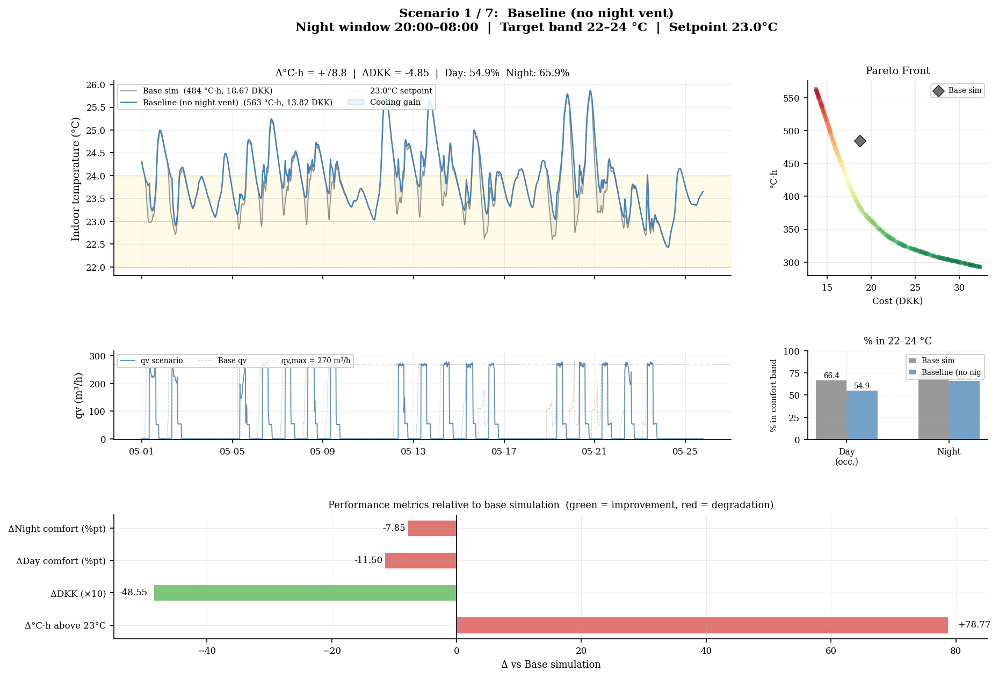

  Saved: ann_pareto_s1_baseline_no_night_vent.png


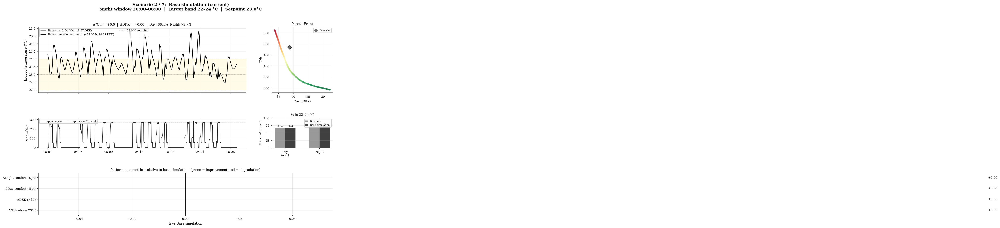

  Saved: ann_pareto_s2_base_simulation_current.png


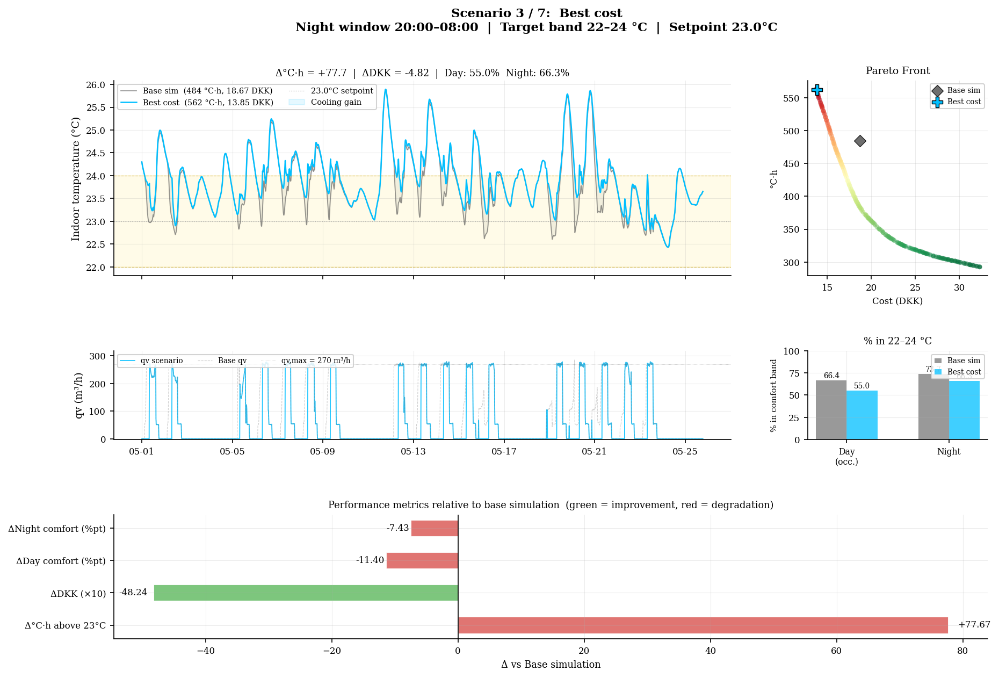

  Saved: ann_pareto_s3_best_cost.png


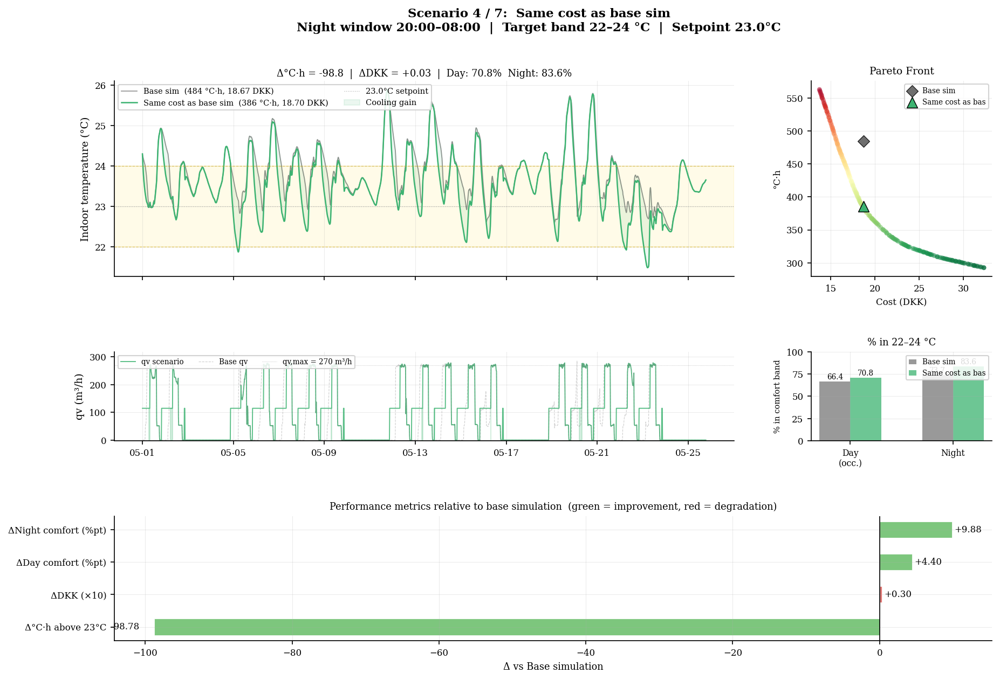

  Saved: ann_pareto_s4_same_cost_as_base_sim.png


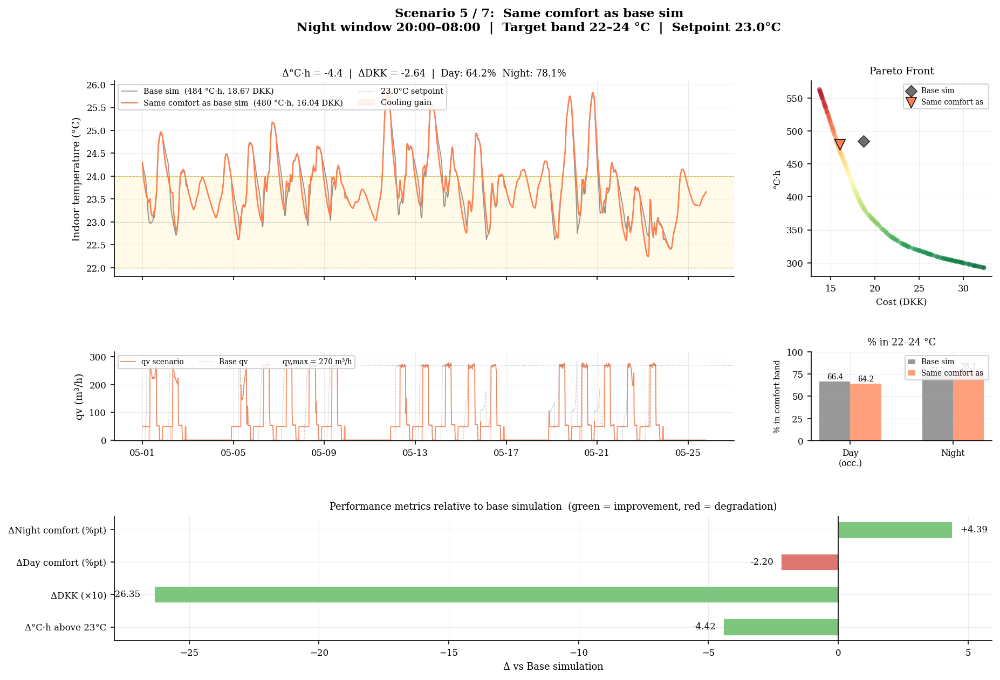

  Saved: ann_pareto_s5_same_comfort_as_base_sim.png


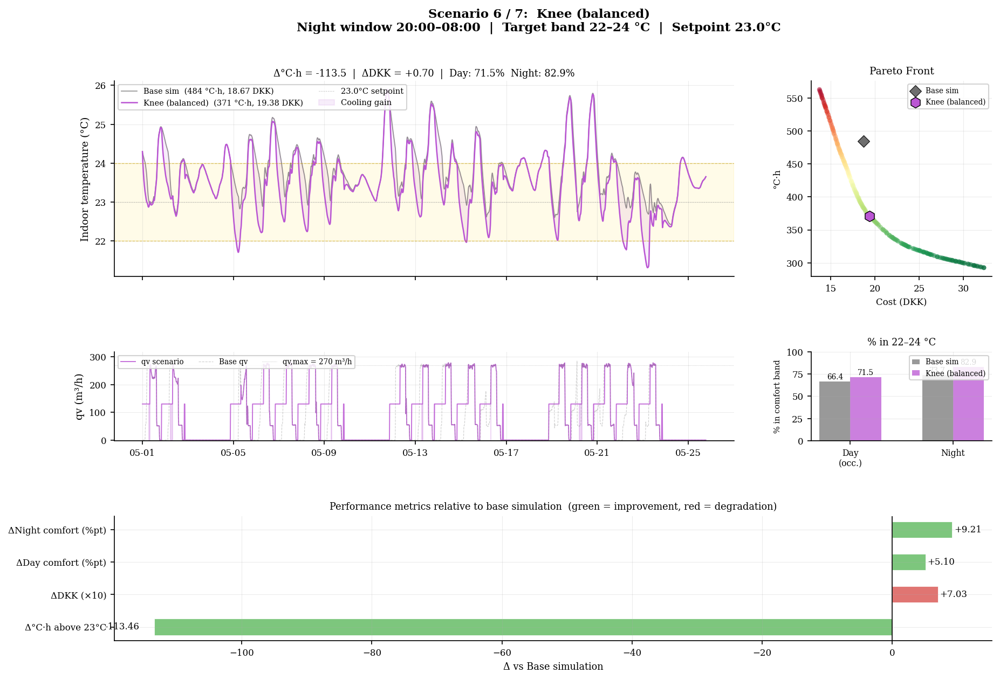

  Saved: ann_pareto_s6_knee_balanced.png


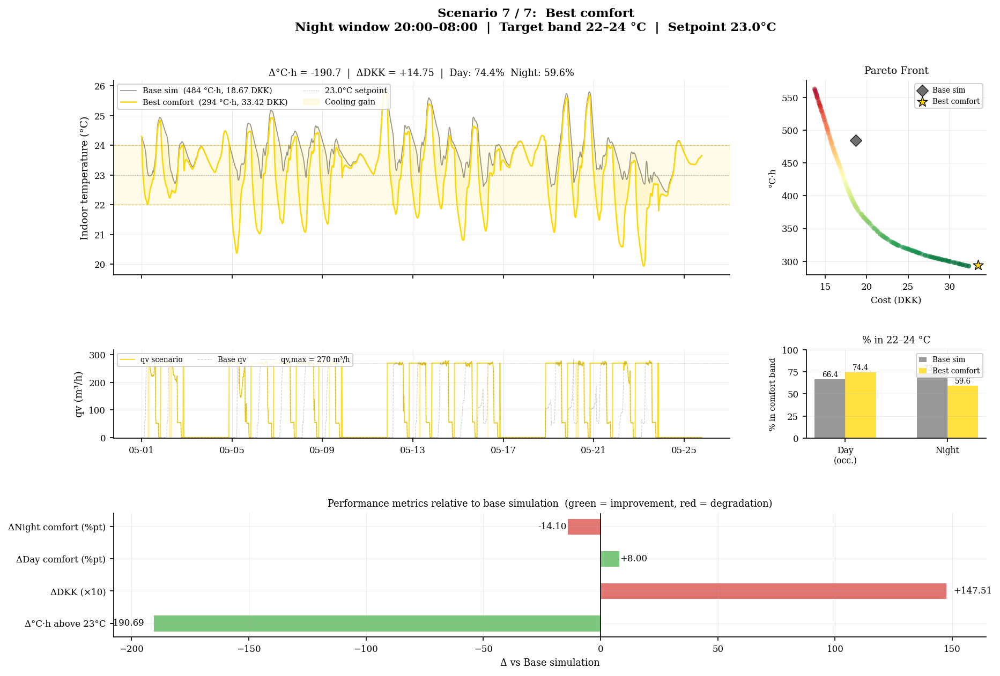

  Saved: ann_pareto_s7_best_comfort.png


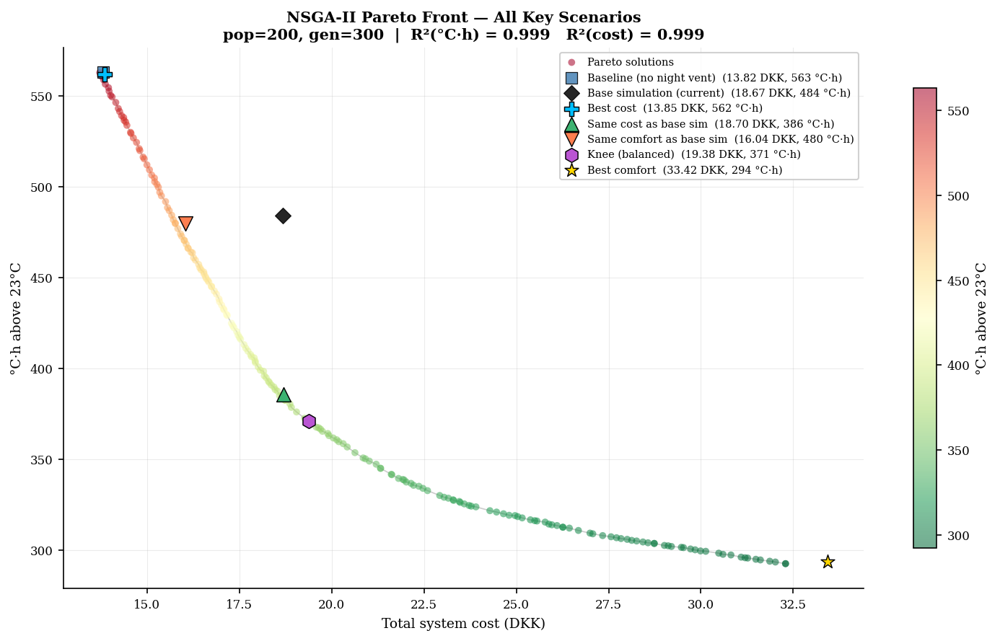

  Saved: ann_nsga2_pareto_summary.png


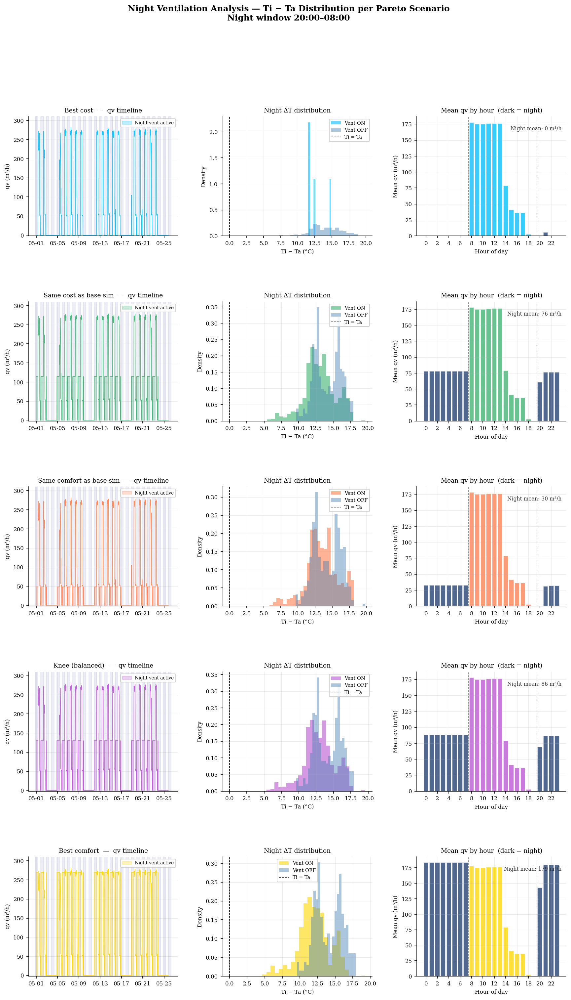

  Saved: night_vent_analysis_scenarios.png

  ✓  All figures saved.


In [23]:
# ════════════════════════════════════════════════════════════════════════════
#  ANN+NSGA-II — INDIVIDUAL SCENARIO FIGURES + NIGHT VENT ANALYSIS
#
#  Produces:
#    ann_pareto_scenario_{i}_{label}.png  — one figure per scenario (7 total)
#    ann_nsga2_pareto_summary.png         — single Pareto front, all scenarios
#    night_vent_analysis_scenarios.png    — Ti/Ta ΔT analysis per Pareto solution
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
import re

# ── Matplotlib style for scientific report ────────────────────────────────────
plt.rcParams.update({
    'font.family'      : 'serif',
    'font.size'        : 9,
    'axes.titlesize'   : 10,
    'axes.labelsize'   : 9,
    'xtick.labelsize'  : 8,
    'ytick.labelsize'  : 8,
    'legend.fontsize'  : 7.5,
    'legend.framealpha': 0.85,
    'axes.spines.top'  : False,
    'axes.spines.right': False,
    'axes.grid'        : True,
    'grid.alpha'       : 0.25,
    'grid.linewidth'   : 0.5,
    'lines.linewidth'  : 1.0,
    'figure.dpi'       : 150,
})

# ── Marker style — small, publication-quality ─────────────────────────────────
MRK = dict(s=60, edgecolors='black', linewidths=0.6, zorder=6)
MRK_KEY = dict(s=90, edgecolors='black', linewidths=0.7, zorder=7)   # key solutions
MRK_REF = dict(s=55, edgecolors='black', linewidths=0.6, zorder=7, alpha=0.85)

# ── Find iso-cost and iso-comfort Pareto solutions ────────────────────────────
_cost_diff    = np.abs(F_pareto[:, 1] - cost_ref)
iso_cost_idx  = int(np.argmin(_cost_diff))

_dh_diff         = np.abs(F_pareto[:, 0] - dh_above_ref)
iso_comfort_idx  = int(np.argmin(_dh_diff))

def _resim(idx, label, color, marker):
    params = X_pareto[idx]
    qv_mod, Tsup_mod = build_X_monthly(params)
    X_mod = X_train.copy()
    X_mod['qv']   = qv_mod
    X_mod['Tsup'] = Tsup_mod
    res = simulate_night_vent_scenario(
        fitted_params, X_mod, N_hist,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
    Ti_v      = np.asarray(res['Ti'])
    dh_v, _   = dh_from_target(Ti_v)
    cost_v    = total_system_cost(qv_mod, Ta_arr, Tsup_mod)
    pct_occ_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, occ_mask)
    pct_ngt_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, all_night_mask)
    return {'label': label, 'params': params, 'Ti': Ti_v,
            'qv_mod': qv_mod, 'dh_above': dh_v, 'cost': cost_v,
            'pct_occ': pct_occ_v, 'pct_night': pct_ngt_v,
            'color': color, 'marker': marker}

iso_cost_data    = _resim(iso_cost_idx,    'Same cost as base sim',    'mediumseagreen', '^')
iso_comfort_data = _resim(iso_comfort_idx, 'Same comfort as base sim', 'coral',          'v')

SCENARIOS = [
    {'label': 'Baseline (no night vent)',
     'Ti': Ti_baseline, 'qv_mod': qv_baseline,
     'dh_above': dh_above_base, 'cost': cost_baseline,
     'pct_occ': pct_occ_base,
     'pct_night': pct_in_band(Ti_baseline, T_cat1_min, T_cat1_max, all_night_mask),
     'color': 'steelblue', 'marker': 's'},
    {'label': 'Base simulation (current)',
     'Ti': Ti_ref, 'qv_mod': qv_arr,
     'dh_above': dh_above_ref, 'cost': cost_ref,
     'pct_occ': pct_occ_ref, 'pct_night': pct_night_ref,
     'color': 'black', 'marker': 'D'},
    {**verified['Best cost'],       'label': 'Best cost'},
    iso_cost_data,
    iso_comfort_data,
    {**verified['Knee (balanced)'], 'label': 'Knee (balanced)'},
    {**verified['Best comfort'],    'label': 'Best comfort'},
]
_ref = SCENARIOS[1]

# ── Print summary table ───────────────────────────────────────────────────────
print(f"\n{'═'*100}")
print(f"  ANN + NSGA-II — PARETO COMPARISON TABLE")
print(f"{'═'*100}")
print(f"  {'Scenario':<32} {'Start':>7} {'Stop':>6} {'qv':>5}  "
      f"{'°C·h':>8}  {'Δ°C·h':>7}  {'DKK':>7}  {'ΔDKK':>7}  {'Day%':>6}  {'Night%':>7}")
print(f"  {'-'*98}")
for s in SCENARIOS:
    p = s.get('params', None)
    start_s = f"{p[0]:.1f}h" if p is not None else "—"
    stop_s  = f"{p[1]:.1f}h" if p is not None else "—"
    qv_s    = f"{p[2]:.0f}"  if p is not None else "—"
    d_dh    = s['dh_above'] - dh_above_ref
    d_cost  = s['cost']     - cost_ref
    d_dh_s  = f"{d_dh:+.1f}"   if s['label'] != 'Base simulation (current)' else "—"
    d_c_s   = f"{d_cost:+.2f}" if s['label'] != 'Base simulation (current)' else "—"
    print(f"  {s['label']:<32} {start_s:>7} {stop_s:>6} {qv_s:>5}  "
          f"{s['dh_above']:>8.1f}  {d_dh_s:>7}  {s['cost']:>7.2f}  "
          f"{d_c_s:>7}  {s['pct_occ']:>5.1f}%  {s['pct_night']:>6.1f}%")
print(f"  {'═'*100}")

# ════════════════════════════════════════════════════════════════════════════
#  INDIVIDUAL FIGURE PER SCENARIO
# ════════════════════════════════════════════════════════════════════════════
_sort_pf = np.argsort(F_pareto[:, 1])

for i, s in enumerate(SCENARIOS):
    is_ref = (s['label'] == 'Base simulation (current)')
    color  = s['color']
    d_dh   = s['dh_above'] - _ref['dh_above']
    d_cost = s['cost']     - _ref['cost']

    fig = plt.figure(figsize=(14, 9))
    gs  = gridspec.GridSpec(3, 3, figure=fig,
                            height_ratios=[2.2, 1.0, 1.4],
                            width_ratios=[3.0, 1.5, 1.5],
                            hspace=0.55, wspace=0.32)

    ax_ts  = fig.add_subplot(gs[0, :2])      # Ti time series (wide)
    ax_qv  = fig.add_subplot(gs[1, :2], sharex=ax_ts)   # qv
    ax_pf  = fig.add_subplot(gs[0,  2])      # Pareto front
    ax_bar = fig.add_subplot(gs[1,  2])      # comfort bar
    ax_met = fig.add_subplot(gs[2, :])       # metrics bar (full width)

    fig.suptitle(
        f'Scenario {i+1} / {len(SCENARIOS)}:  {s["label"]}\n'
        f'Night window {NIGHT_START:02d}:00–{NIGHT_STOP:02d}:00  |  '
        f'Target band {T_cat1_min:.0f}–{T_cat1_max:.0f} °C  |  Setpoint {T_TARGET}°C',
        fontsize=11, fontweight='bold'
    )

    # ── Ti time series ────────────────────────────────────────────────────────
    ax_ts.plot(index, _ref['Ti'], color='#555555', lw=0.85, alpha=0.6,
               label=f'Base sim  ({_ref["dh_above"]:.0f} °C·h, {_ref["cost"]:.2f} DKK)')
    ax_ts.plot(index, s['Ti'], color=color, lw=1.2,
               label=f'{s["label"]}  ({s["dh_above"]:.0f} °C·h, {s["cost"]:.2f} DKK)')
    ax_ts.axhspan(T_cat1_min, T_cat1_max, alpha=0.09, color='gold', zorder=0)
    ax_ts.axhline(T_cat1_max, color='#c8a000', lw=0.6, ls='--', alpha=0.55)
    ax_ts.axhline(T_cat1_min, color='#c8a000', lw=0.6, ls='--', alpha=0.55)
    ax_ts.axhline(T_TARGET,   color='grey',    lw=0.6, ls=':',  alpha=0.6,
                  label=f'{T_TARGET}°C setpoint')
    if not is_ref:
        ax_ts.fill_between(index, _ref['Ti'], s['Ti'],
            where=(_ref['Ti'] > s['Ti']), alpha=0.10, color=color, label='Cooling gain')
        ax_ts.fill_between(index, _ref['Ti'], s['Ti'],
            where=(_ref['Ti'] < s['Ti']), alpha=0.07, color='#444444')
    ax_ts.set_ylabel('Indoor temperature (°C)')
    ax_ts.set_title(
        f'Δ°C·h = {d_dh:+.1f}  |  ΔDKK = {d_cost:+.2f}  |  '
        f'Day: {s["pct_occ"]:.1f}%  Night: {s["pct_night"]:.1f}%',
        fontsize=8.5, pad=4
    )
    ax_ts.legend(loc='upper left', ncol=2, fontsize=7)
    plt.setp(ax_ts.get_xticklabels(), visible=False)

    # ── qv panel ──────────────────────────────────────────────────────────────
    ax_qv.plot(index, s['qv_mod'], color=color, lw=0.9, alpha=0.85, label='qv scenario')
    if not is_ref:
        ax_qv.plot(index, _ref['qv_mod'], color='#777777', lw=0.55,
                   alpha=0.35, ls='--', label='Base qv')
    ax_qv.fill_between(index, s['qv_mod'], 0,
        where=weekday_night_mask & ta_ok_mask, alpha=0.22, color=color)
    ax_qv.axhline(QV_MAX, color='#444444', lw=0.4, ls=':', alpha=0.4,
                  label=f'qv,max = {QV_MAX:.0f} m³/h')
    ax_qv.set_ylabel('qv (m³/h)')
    ax_qv.set_ylim(-3, QV_MAX * 1.18)
    ax_qv.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
    ax_qv.legend(loc='upper left', ncol=3, fontsize=6.5)

    # ── Pareto front ──────────────────────────────────────────────────────────
    sc = ax_pf.scatter(F_pareto[:, 1], F_pareto[:, 0],
                       c=F_pareto[:, 0], cmap='RdYlGn_r', s=18,
                       alpha=0.55, edgecolors='none', zorder=2)
    ax_pf.plot(F_pareto[_sort_pf, 1], F_pareto[_sort_pf, 0],
               color='#333333', lw=0.7, alpha=0.25, zorder=1)
    ax_pf.scatter(_ref['cost'], _ref['dh_above'],
                  marker='D', color='#555555', **{**MRK_REF, 'label': 'Base sim'})
    if s.get('params') is not None:
        ax_pf.scatter(s['cost'], s['dh_above'],
                      marker=s['marker'], color=color, **{**MRK_KEY, 'label': s['label'][:16]})
    ax_pf.set_xlabel('Cost (DKK)', fontsize=8)
    ax_pf.set_ylabel('°C·h', fontsize=8)
    ax_pf.set_title('Pareto Front', fontsize=9)
    ax_pf.legend(fontsize=6.5, handlelength=1.2)

    # ── Comfort bar ───────────────────────────────────────────────────────────
    x, w = np.arange(2), 0.30
    b_r = ax_bar.bar(x - w/2, [_ref['pct_occ'], _ref['pct_night']], w,
                     color='#555555', alpha=0.60, label='Base sim')
    b_a = ax_bar.bar(x + w/2, [s['pct_occ'],    s['pct_night']   ], w,
                     color=color,    alpha=0.75, label=s['label'][:16])
    for b in list(b_r) + list(b_a):
        ax_bar.text(b.get_x() + b.get_width()/2, b.get_height() + 0.8,
                    f'{b.get_height():.1f}', ha='center', va='bottom', fontsize=6.5)
    ax_bar.set_xticks(x)
    ax_bar.set_xticklabels(['Day\n(occ.)', 'Night'], fontsize=7.5)
    ax_bar.set_ylim(0, 100)
    ax_bar.set_ylabel('% in comfort band', fontsize=7)
    ax_bar.legend(fontsize=6.5, loc='upper right', handlelength=1.0)
    ax_bar.set_title('% in 22–24 °C', fontsize=8.5)

    # ── Metrics bar (horizontal) ──────────────────────────────────────────────
    all_labels  = ['Δ°C·h above 23°C', 'ΔDKK (×10)', 'ΔDay comfort (%pt)', 'ΔNight comfort (%pt)']
    all_vals    = [d_dh, d_cost * 10,
                   s['pct_occ']   - _ref['pct_occ'],
                   s['pct_night'] - _ref['pct_night']]
    bar_cols    = ['#d9534f' if v > 0 else '#5cb85c' for v in all_vals[:2]] + \
                  ['#5cb85c' if v > 0 else '#d9534f' for v in all_vals[2:]]
    # for comfort, positive is good; for dh/cost, negative is good
    bars_m = ax_met.barh(all_labels, all_vals, color=bar_cols, alpha=0.80,
                         edgecolor='white', linewidth=0.5, height=0.5)
    ax_met.axvline(0, color='black', lw=0.8)
    for b, v in zip(bars_m, all_vals):
        offset = max(abs(v) * 0.02, 0.3)
        ax_met.text(v + (offset if v >= 0 else -offset), b.get_y() + b.get_height()/2,
                    f'{v:+.2f}', va='center',
                    ha='left' if v >= 0 else 'right', fontsize=8)
    ax_met.set_xlabel('Δ vs Base simulation', fontsize=8.5)
    ax_met.set_title(
        'Performance metrics relative to base simulation'
        '  (green = improvement, red = degradation)',
        fontsize=8.5
    )

    fname = re.sub(r'[^a-z0-9]+', '_', s['label'].lower()).strip('_')
    plt.savefig(f'ann_pareto_s{i+1}_{fname}.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f"  Saved: ann_pareto_s{i+1}_{fname}.png")

# ════════════════════════════════════════════════════════════════════════════
#  PARETO SUMMARY — all scenarios annotated
# ════════════════════════════════════════════════════════════════════════════
fig_sum, ax_s = plt.subplots(figsize=(10, 6))
sc_s = ax_s.scatter(F_pareto[:, 1], F_pareto[:, 0],
                    c=F_pareto[:, 0], cmap='RdYlGn_r', s=22,
                    alpha=0.55, edgecolors='none', zorder=2, label='Pareto solutions')
ax_s.plot(F_pareto[_sort_pf, 1], F_pareto[_sort_pf, 0],
          color='#333333', lw=0.8, alpha=0.25, zorder=1)
plt.colorbar(sc_s, ax=ax_s, label='°C·h above 23°C', shrink=0.85)

for s in SCENARIOS:
    if s['label'] in ('Baseline (no night vent)', 'Base simulation (current)'):
        ax_s.scatter(s['cost'], s['dh_above'],
                     marker=s['marker'], color=s['color'], **MRK_REF,
                     label=f'{s["label"]}  ({s["cost"]:.2f} DKK, {s["dh_above"]:.0f} °C·h)')
    elif s.get('params') is not None:
        ax_s.scatter(s['cost'], s['dh_above'],
                     marker=s['marker'], color=s['color'], **MRK_KEY,
                     label=f'{s["label"]}  ({s["cost"]:.2f} DKK, {s["dh_above"]:.0f} °C·h)')

ax_s.set_xlabel('Total system cost (DKK)')
ax_s.set_ylabel('°C·h above 23°C')
ax_s.set_title(
    f'NSGA-II Pareto Front — All Key Scenarios\n'
    f'pop={NSGA_POP}, gen={NSGA_GEN}  |  '
    f'R²(°C·h) = {r2_dh:.3f}   R²(cost) = {r2_cost:.3f}',
    fontweight='bold'
)
ax_s.legend(fontsize=7, loc='upper right', handlelength=1.4,
            framealpha=0.9, edgecolor='#cccccc')
plt.tight_layout()
plt.savefig('ann_nsga2_pareto_summary.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: ann_nsga2_pareto_summary.png")

# ════════════════════════════════════════════════════════════════════════════
#  NIGHT VENTILATION ANALYSIS — Ti−Ta distributions per Pareto scenario
# ════════════════════════════════════════════════════════════════════════════
NIGHT_START_NV = NIGHT_START
NIGHT_STOP_NV  = NIGHT_STOP
hours_arr      = np.array([t.hour + t.minute / 60.0 for t in index])
night_mask_nv  = (hours_arr >= NIGHT_START_NV) | (hours_arr < NIGHT_STOP_NV)
Ta_full        = np.asarray(X_train['Ta'], dtype=float)

# Include only Pareto scenarios (skip Baseline and Base sim)
pareto_scens = [s for s in SCENARIOS if s.get('params') is not None]
n_ps = len(pareto_scens)

fig_nv = plt.figure(figsize=(14, 4.5 * n_ps))
gs_nv  = gridspec.GridSpec(n_ps, 3, figure=fig_nv, hspace=0.55, wspace=0.30)
fig_nv.suptitle(
    'Night Ventilation Analysis — Ti − Ta Distribution per Pareto Scenario\n'
    f'Night window {NIGHT_START_NV:02d}:00–{NIGHT_STOP_NV:02d}:00',
    fontsize=12, fontweight='bold'
)

for row, s in enumerate(pareto_scens):
    Ti_s   = np.asarray(s['Ti'], dtype=float)
    qv_s   = np.asarray(s['qv_mod'], dtype=float)
    dT_all = Ti_s - Ta_full                  # ΔT at all timesteps
    dT_ngt = dT_all[night_mask_nv]           # ΔT at night
    qv_ngt = qv_s[night_mask_nv]

    vent_on_ngt  = qv_ngt > 1.0             # ventilation active at night
    vent_off_ngt = ~vent_on_ngt

    # ── qv timeline ──────────────────────────────────────────────────────────
    ax_tl = fig_nv.add_subplot(gs_nv[row, 0])
    ax_tl.plot(index, qv_s, color=s['color'], lw=0.75, alpha=0.9)
    ax_tl.fill_between(index, qv_s, 0,
        where=night_mask_nv & (qv_s > 1.0), alpha=0.25, color=s['color'],
        label='Night vent active')
    day_start_nv = index[0].normalize()
    for d in range((index[-1] - index[0]).days + 2):
        ns = day_start_nv + pd.Timedelta(hours=NIGHT_START_NV + d*24 - 24)
        ne = day_start_nv + pd.Timedelta(hours=NIGHT_STOP_NV  + d*24)
        ax_tl.axvspan(ns, ne, alpha=0.07, color='navy', zorder=0)
    ax_tl.set_ylabel('qv (m³/h)', fontsize=8)
    ax_tl.set_ylim(-2, QV_MAX * 1.15)
    ax_tl.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
    ax_tl.set_title(f'{s["label"]}  —  qv timeline', fontsize=9)
    ax_tl.legend(fontsize=6.5)

    # ── ΔT histogram (night only) ─────────────────────────────────────────────
    ax_ht = fig_nv.add_subplot(gs_nv[row, 1])
    if vent_on_ngt.sum() > 0:
        ax_ht.hist(dT_ngt[vent_on_ngt], bins=25, color=s['color'],
                   alpha=0.60, density=True, label='Vent ON')
    ax_ht.hist(dT_ngt[vent_off_ngt], bins=25, color='steelblue',
               alpha=0.45, density=True, label='Vent OFF')
    ax_ht.axvline(0, color='black', lw=0.8, ls='--', label='Ti = Ta')
    ax_ht.set_xlabel('Ti − Ta (°C)', fontsize=8)
    ax_ht.set_ylabel('Density', fontsize=8)
    ax_ht.set_title('Night ΔT distribution', fontsize=9)
    ax_ht.legend(fontsize=7)

    # ── Hourly mean qv profile ────────────────────────────────────────────────
    ax_hr = fig_nv.add_subplot(gs_nv[row, 2])
    hour_int   = np.array([t.hour for t in index])
    qv_by_hr   = np.array([qv_s[hour_int == h].mean() for h in range(24)])
    bar_cols   = ['#1f3d6e' if (h >= NIGHT_START_NV or h < NIGHT_STOP_NV)
                  else s['color'] for h in range(24)]
    ax_hr.bar(range(24), qv_by_hr, color=bar_cols, alpha=0.78, edgecolor='white', width=0.85)
    ax_hr.axvline(NIGHT_START_NV - 0.5, color='black', lw=0.8, ls='--', alpha=0.5)
    ax_hr.axvline(NIGHT_STOP_NV  - 0.5, color='black', lw=0.8, ls='--', alpha=0.5)
    ax_hr.set_xlabel('Hour of day', fontsize=8)
    ax_hr.set_ylabel('Mean qv (m³/h)', fontsize=8)
    ax_hr.set_xticks(range(0, 24, 2))
    ax_hr.set_title('Mean qv by hour  (dark = night)', fontsize=9)

    # Annotate night mean
    qv_night_mean = qv_s[night_mask_nv].mean()
    ax_hr.text(0.97, 0.92, f'Night mean: {qv_night_mean:.0f} m³/h',
               transform=ax_hr.transAxes, ha='right', va='top',
               fontsize=7.5, color='#333333')

plt.savefig('night_vent_analysis_scenarios.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: night_vent_analysis_scenarios.png")
print("\n  ✓  All figures saved.")
